##### FINAL VERSION OF SCRIPT -  
Katrina Kalantar
April 2018

Analysis for mBAL microbe study

# Set-up

In [1]:
run_description = 'Running with Meningitis Pathogen List, NO water correction, Z-score > 1, dual RNA-seq (no DNA)'

## Environment Setup

In [2]:
# set the width of the jupyter notebook so we don't waste so much valuable browser real-estate!
#from IPython.core.display import display, HTML
#display(HTML("<style>.container { width:95% !important; }</style>"))

In [3]:
# required libraries
from collections import Counter
import csv
import glob
import math
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import pickle
from pylab import *
import random
import seaborn as sns
import sklearn
import statistics
import scipy
import scipy.stats
from sklearn import metrics
from sklearn.model_selection import cross_val_predict
from sklearn import preprocessing
from sklearn.metrics import roc_curve
import sys, os.path
import warnings; warnings.simplefilter('ignore')
import ecopy

# import microbial analysis and plotting functions 
# developed by me, but moved to external scripts for simplicity in .ipynb
scripts_dir = './scripts/'
sys.path.append(scripts_dir)
import IDseq_pathogen_functions2 
import IDseq_plotting_functions

#https://tonysyu.github.io/raw_content/matplotlib-style-gallery/gallery.html
plt.style.use('fivethirtyeight')   
%matplotlib inline  

## Import Data

### Curated List of Top Respiratory Pathogens (and viruses)
Manually currated from papers and the NCBI taxonomy database

The **list_of_viruses_in_dictionary** contains all microbes which are listed as "Viruses". The **full_respiratory_microbes_list** contains all microbes identified as "likely pathogenic" in the respiratory tract.

In [4]:
# a priori curated list of all viruses
# to obtain this list (of all viruses in the samples), I ran `grep Viruses` 
# in all .csv report files in BM_4
v = open('./reference/viruses_bangldesh_uniq.txt', 'r').readlines()
list_of_viruses_in_dictionary = [i.strip() for i in v]

# Curated list of top respiratory pathogens
resp_mic = open('./reference/pathogens_bangladesh_official.txt', 'r').readlines()
full_respiratory_microbes_list = [i.strip() for i in resp_mic]

### Global Variables

In [5]:
data_directory =  '070518'
output_directory = '070618_z=1_dualRNA'  

topX = 25 # because all microbes identified in culture are present among the top 15 microbes


# read in metadata to get RNA and DNA file names
metadata = pd.read_csv(
    './data/' + data_directory +
    '/combined_metadata.tsv',
    sep='\t',
    header=0,
    index_col=0)

# remove rows with null DNA filenames; some samples were missing DNA-seq data
metadata = metadata[metadata['sample_name_DNA']
                    .notnull()]  

# remove rows with null RNA filenames; no RNA-seq files should be missing
metadata = metadata[metadata['sample_name_RNA']
                    .notnull()] 

#print(metadata.head())
true_classification = ''

if('effective_group' in metadata.columns):
    # create the "true_classification" variable from the metadata  
    a = metadata[['sample_name_DNA','effective_group','organism']]
    b = metadata[['sample_name_RNA','effective_group','organism']]
    b.columns = ['sample_name_DNA','effective_group','organism']
    c = pd.concat([a,b])
    c.index = c['sample_name_DNA']
    c.sort_values(by='sample_name_DNA',inplace=True)
    c = c[c['sample_name_DNA'] != 'n/a']
    c = c[['effective_group','organism']]
    true_classification = c

else:
    effective_group = [2 for i in range(len(metadata.index))]
    organism = ['' for i in range(len(metadata.index))]
    c = pd.concat([metadata['sample_name_DNA'],metadata['sample_name_RNA']], axis=1)
    c['effective_group'] = pd.Series(effective_group, index = metadata.index)
    c['organism'] = pd.Series(organism, index = metadata.index)
    true_classification = c

print(true_classification.head())

file_pairs_dict = dict(
    zip(metadata['sample_name_DNA'], metadata['sample_name_RNA']
        ))  #create dictionary mapping RNAfilename with associated DNAfilename

# create a reverse dictionary for file look-up from RNA:DNA later on
file_pairs_dict
file_pairs_dict_rev = {}
for i in file_pairs_dict.keys():
    file_pairs_dict_rev[file_pairs_dict[i]] = i
    

description_file = open('./output/' + output_directory + '/run_description.txt','w')
description_file.write(run_description)
description_file.close()
    

# these sample names were identified by random selection of host RNA-seq data 
# based on RNA-seq batches.
training_sample_names = []
'''
training_sample_names = ["mBAL-212-RNA-TA1-B10.report.csv","mBAL-225-RNA-TA1-B10.report.csv",
                         "mBAL-298-RNA-TA1-B10.report.csv","mBAL-304-RNA-TA1-B10.report.csv",
                         "mBAL-314-RNA-TA1-B10.report.csv","mBAL-315-RNA-TA1-B10.report.csv",
                         "mBAL-335-RNA-TA1-B10.report.csv","mBAL-337-RNA-TA1-B10.report.csv",
                         "mBAL-343-RNA-TA1-B10.report.csv","mBAL-350-RNA-TA1-B10.report.csv",
                         "mBAL-349-RNA-TA1-B10.report.csv","mBAL-273-RNA-TA1-B10.report.csv",
                         "mBAL-331-RNA-TA1-B10.report.csv","mBAL-221-RNA-TA1-B10.report.csv",
                         "mBAL-220-RNA-TA1-B10.report.csv","mBAL-215-RNA-TA1-B10.report.csv",
                         "mBAL-270-RNA-TA1-B10.report.csv","mBAL-241-RNA-TA1-B10.report.csv",
                         "mBAL-211-RNA-TA1-B10.report.csv","mBAL-218-RNA-TA1-B10.report.csv"]
'''

                     effective_group                  organism
sample_name_DNA                                               
CHRF_DNA_0002_C_S4               1.0  Streptococcus pneumoniae
CHRF_DNA_0003_C_S12              1.0  Streptococcus pneumoniae
CHRF_DNA_0004_C_S20              1.0  Streptococcus pneumoniae
CHRF_DNA_0005_C_S28              1.0   Enterobacter hormaechei
CHRF_DNA_0006_C_S36              4.0                       NaN


'\ntraining_sample_names = ["mBAL-212-RNA-TA1-B10.report.csv","mBAL-225-RNA-TA1-B10.report.csv",\n                         "mBAL-298-RNA-TA1-B10.report.csv","mBAL-304-RNA-TA1-B10.report.csv",\n                         "mBAL-314-RNA-TA1-B10.report.csv","mBAL-315-RNA-TA1-B10.report.csv",\n                         "mBAL-335-RNA-TA1-B10.report.csv","mBAL-337-RNA-TA1-B10.report.csv",\n                         "mBAL-343-RNA-TA1-B10.report.csv","mBAL-350-RNA-TA1-B10.report.csv",\n                         "mBAL-349-RNA-TA1-B10.report.csv","mBAL-273-RNA-TA1-B10.report.csv",\n                         "mBAL-331-RNA-TA1-B10.report.csv","mBAL-221-RNA-TA1-B10.report.csv",\n                         "mBAL-220-RNA-TA1-B10.report.csv","mBAL-215-RNA-TA1-B10.report.csv",\n                         "mBAL-270-RNA-TA1-B10.report.csv","mBAL-241-RNA-TA1-B10.report.csv",\n                         "mBAL-211-RNA-TA1-B10.report.csv","mBAL-218-RNA-TA1-B10.report.csv"]\n'

In [6]:
## WATER SUBTRACTION!!!

'''

water_samples_rna = list(metadata[metadata['effective_group']==5]['sample_name_RNA'])
water_samples_dna = list(metadata[metadata['effective_group']==5]['sample_name_DNA'])

# SCALING TO THE PROPORTION MICROBIAL IN REAL SAMPLES
med_DNA = np.median(metadata['nonhost_reads_percent_DNA'])
scale_0033 = med_DNA/metadata['nonhost_reads_percent_DNA']['CHRF_0033']
scale_0045 =  med_DNA/metadata['nonhost_reads_percent_DNA']['CHRF_0045']
scale_0057 =  med_DNA/metadata['nonhost_reads_percent_DNA']['CHRF_0057']
scale_0069 =  med_DNA/metadata['nonhost_reads_percent_DNA']['CHRF_0069']
scale_0096 =  med_DNA/metadata['nonhost_reads_percent_DNA']['CHRF_0096']



dna_dir = 'rr007_dna_reports'
rna_dir = 'rapid-response-007_reports'

merge_dna = []
merge_rna = []

for i in water_samples_dna:
    print(i)
    dna_file = 'data/' + data_directory + '/' + dna_dir + '/' + i.lower() + '.csv'
    rna_file = 'data/' + data_directory + '/' + rna_dir + '/' + file_pairs_dict[i].lower() + '.csv'
    df_dna = pd.read_csv(dna_file, error_bad_lines=False)
    df_dna = df_dna[df_dna['tax_level'] == 2]
    scaled_df_dna = None

    merge_dna.append(df_dna)
    df_rna = pd.read_csv(rna_file, error_bad_lines=False)
    df_rna = df_rna[df_rna['tax_level'] == 2]
    merge_rna.append(df_rna[df_rna['tax_id'] > 0][['NT_rpm','genus_taxid']])

    print(df_rna[df_rna['genus_taxid'] == 11019]['NT_rpm'])

def compute_water_subtraction(merge_samples): 
    #
    #Take all the water files, merge the NT rpm and compute the mean rpm for each genus
    #
    df = merge_samples[0]
    for df_ in merge_samples[1:]:
        df = df.merge(df_,how='outer',on='genus_taxid') 
    df.index = df['genus_taxid']
    df = df.drop('genus_taxid', axis=1)
    df = df.fillna(0)
    return(df.mean(axis=1))

dna_genus_water_subtraction = compute_water_subtraction(merge_dna)
rna_genus_water_subtraction = compute_water_subtraction(merge_rna)

dna_genus_water_subtraction = None #compute_water_subtraction(merge_dna)
rna_genus_water_subtraction = None #compute_water_subtraction(merge_rna)


dna_genus_water_subtraction.to_csv('./output/' + output_directory + '/water_correction_genus_DNA.csv')
rna_genus_water_subtraction.to_csv('./output/' + output_directory + '/water_correction_genus_RNA.csv')

'''
    
dna_genus_water_subtraction = None #compute_water_subtraction(merge_dna)
rna_genus_water_subtraction = None #compute_water_subtraction(merge_rna)


In [7]:
#print(dna_genus_water_subtraction)
#print(dna_genus_water_subtraction.to_frame(name='DNA'))
df = dna_genus_water_subtraction.to_frame(name='DNA').join(rna_genus_water_subtraction.to_frame(name='RNA'),how='outer')
#print(df.sort_values(by='DNA', ascending = False))
print(1763 in df.index)

# where did enterovirus go???
print(12059 in df.index)
print(138948 in df.index)
print(138949 in df.index)
#plt.scatter(rna_genus_water_subtraction, dna_genus_water_subtraction)

AttributeError: 'NoneType' object has no attribute 'to_frame'

In [8]:
med_DNA = np.median(metadata['nonhost_reads_percent_DNA'])
scale_0033 = med_DNA/metadata['nonhost_reads_percent_DNA']['CHRF_0033']
scale_0045 =  med_DNA/metadata['nonhost_reads_percent_DNA']['CHRF_0045']
scale_0057 =  med_DNA/metadata['nonhost_reads_percent_DNA']['CHRF_0057']
scale_0069 =  med_DNA/metadata['nonhost_reads_percent_DNA']['CHRF_0069']
scale_0096 =  med_DNA/metadata['nonhost_reads_percent_DNA']['CHRF_0096']
print(scale_0033)
print("--")

print(med_DNA)
print(metadata['nonhost_reads_percent_DNA']['CHRF_0033'])
print(metadata['nonhost_reads_percent_DNA']['CHRF_0045'])
print(metadata['nonhost_reads_percent_DNA']['CHRF_0057'])
print(metadata['nonhost_reads_percent_DNA']['CHRF_0069'])
print(metadata['nonhost_reads_percent_DNA']['CHRF_0096'])

print(np.median(metadata['nonhost_reads_percent_RNA']))
print(metadata['nonhost_reads_percent_RNA']['CHRF_0033'])
print(metadata['nonhost_reads_percent_RNA']['CHRF_0045'])
print(metadata['nonhost_reads_percent_RNA']['CHRF_0057'])
print(metadata['nonhost_reads_percent_RNA']['CHRF_0069'])
print(metadata['nonhost_reads_percent_RNA']['CHRF_0096'])

0.07023533715400561
--
0.5760000000000001
8.201
5.572
10.561
7.437
8.931000000000001
0.16
0.134
0.16
0.19
0.13
0.141


In [9]:
# write the microbes used for this particular analysis to the output directory
open('./output/' + output_directory + '/USED.viruses.txt', 'w').write(
    '\n'.join(list_of_viruses_in_dictionary));
open('./output/' + output_directory + '/USED.known_respiratory_pathogens.txt',
     'w').write('\n'.join(full_respiratory_microbes_list));

# Run Analysis

Run the main functions to generate scores required for all further plotting steps.

In [10]:
# create the output file that will containg the top 20 microbes for each sample 
# with the caveat that all microbes must be present on both RNA-seq and 
# DNA-seq (with the exception of RNA viruses)
f = open('./output/' + output_directory + '/TableS4.csv', 'w')
f.close()

f = open('./output/' + output_directory + '/TableS4_lowcount.csv', 'w')
f.close()

# run the main function to load microbial data into the data structure for downstream analysis
main_output = IDseq_pathogen_functions2.main('data/' + data_directory, 
                                      'rr007_dna_reports', 'rapid-response-007_reports',
                                      file_pairs_dict, output_directory,
                                      metadata, subtract_dna = dna_genus_water_subtraction, 
                                            subtract_rna = rna_genus_water_subtraction, expect_DNA=False)#True) 
bacterial = main_output[0]
viral = main_output[1]
full = main_output[2]

list_of_files = list(
    bacterial.keys())  # create list of RNA files for accessing the outputs




./data/070518/rapid-response-007_reports/chrf_rna_0002_s2.csv
./data/070518/rr007_dna_reports/chrf_dna_0002_c_s4.csv
      tax_id                                               name common_name  \
0       1301                                      Streptococcus         NaN   
1       1313                           Streptococcus pneumoniae         NaN   
2 -100001301  Non-species-specific reads in genus Streptococcus         NaN   
3      28037                                Streptococcus mitis         NaN   
4       1311                           Streptococcus agalactiae         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100         1301          1300      Bacteria   
1          1           1313         1301          1300      Bacteria   
2          1     -100001301         1301          1300      Bacteria   
3          1          28037         1301          1300      Bacteria   
4          1           1311         1301     

       tax_id                                    name common_name  tax_level  \
0        1313                Streptococcus pneumoniae         NaN          1   
1       28037                     Streptococcus mitis         NaN          1   
2        1311                Streptococcus agalactiae         NaN          1   
3        1303                    Streptococcus oralis         NaN          1   
4        1314                  Streptococcus pyogenes         NaN          1   
5        1338               Streptococcus intermedius         NaN          1   
6        1308              Streptococcus thermophilus         NaN          1   
7      257758          Streptococcus pseudopneumoniae         NaN          1   
8        1307                      Streptococcus suis         NaN          1   
9      113107                 Streptococcus australis         NaN          1   
10       1318             Streptococcus parasanguinis         NaN          1   
11    1095727                 Streptococ

(5787, 26)
A
B
C
D
E
F
RNA shape in calculate_scores:
(3413, 29)
RNA HEAD
(218, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0        Viruses   -200687329    41.1       99.0           NaN   
1        Viruses   -200687329     0.1      100.0           NaN   
5        Viruses       687331     3.9      100.0           8.3   
7        Viruses       687331     0.8      100.0           8.3   
10       Viruses       687332     0.4       91.9           0.7   

    genus_NT_zscore                    name  NR_rpm  
0               NaN       Torque teno virus    28.5  
1               NaN  uncultured Anellovirus     0.6  
5             100.0    Torque teno virus 16     1.7  
7             100.0     Torque teno virus 3     0.3  
10             46.6     TTV-like mini virus     0.8  
RNA HEAD2
(11, 8)
   category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0        Viruses   -200687329        41.1           99.0               NaN   
5        Viruses      

      tax_id                                               name common_name  \
0     447237                                     Frondihabitans         NaN   
1    1795630                      Frondihabitans sp. PAMC 28766         NaN   
2 -100447237  Non-species-specific reads in genus Frondihabi...         NaN   
3    1736329                         Frondihabitans sp. Leaf304         NaN   
4    1436968                             Frondihabitans sp. 4r5         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100       447237         85023      Bacteria   
1          1        1795630       447237         85023      Bacteria   
2          1     -100447237       447237         85023      Bacteria   
3          1        1736329       447237         85023      Bacteria   
4          1        1436968       447237         85023      Bacteria   

   is_phage    NT_r      ...       aggregatescore  NT_maxzscore   NR_r  \
0         0  5989.

       tax_id                                name                common_name  \
0     1795630       Frondihabitans sp. PAMC 28766                        NaN   
1     1736329          Frondihabitans sp. Leaf304                        NaN   
2     1436968              Frondihabitans sp. 4r5                        NaN   
3      598626            Frondihabitans peucedani                        NaN   
4     1341574      Frondihabitans sp. TP-Snow-C86                        NaN   
5      386892          Frondihabitans australicus                        NaN   
6     1712675               Turicibacter sp. H121                        NaN   
7     1508344           Turicibacter sp. S37_09_1                        NaN   
8      154288              Turicibacter sanguinis                        NaN   
9      392734                  Terriglobus roseus                        NaN   
10     870903               Terriglobus saanensis                        NaN   
11    1793722             Curtobacterium

      tax_id                                              name common_name  \
0        547                                      Enterobacter         NaN   
1 -100000547  Non-species-specific reads in genus Enterobacter         NaN   
2     158836                           Enterobacter hormaechei         NaN   
3    1296536                       Enterobacter xiangfangensis         NaN   
4        550                              Enterobacter cloacae         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100          547           543      Bacteria   
1          1     -100000547          547           543      Bacteria   
2          1         158836          547           543      Bacteria   
3          1        1296536          547           543      Bacteria   
4          1            550          547           543      Bacteria   

   is_phage     NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         0  17729.0 

category_name                         Bacteria
genus_taxid                                547
NT_rpm DNA                                99.8
NT_zscore DNA                               99
genus_NT_rpm DNA                         465.9
genus_NT_zscore DNA                         99
name_x                 Enterobacter hormaechei
NR_rpm DNA                                11.2
NT_rpm RNA                                99.8
NT_zscore RNA                               99
genus_NT_rpm RNA                         465.9
genus_NT_zscore RNA                         99
name_y                 Enterobacter hormaechei
NR_rpm RNA                                11.2
Name: 0, dtype: object
category_name                         Bacteria
genus_taxid                               1578
NT_rpm DNA                                36.5
NT_zscore DNA                             17.7
genus_NT_rpm DNA                          68.6
genus_NT_zscore DNA                        4.6
name_x                 Lactobacillus 

         tax_id                                               name  \
0        212015                                         Sphaeridia   
1        212016                                 Sphaeridia pumilis   
2          1298                                        Deinococcus   
3        309887                           Deinococcus maricopensis   
4        432329                        Deinococcus peraridilitoris   
5    -100001298    Non-species-specific reads in genus Deinococcus   
6       1309411                   Deinococcus soli Cha et al. 2016   
7        502394                              Deinococcus gobiensis   
8       1768108                          Deinococcus actinosclerus   
9        310783                                Deinococcus deserti   
10         1299                            Deinococcus radiodurans   
11      1182568                               Deinococcus puniceus   
12        55148                          Deinococcus proteolyticus   
13        57498     




./data/070518/rapid-response-007_reports/chrf_rna_0007_s7.csv
./data/070518/rr007_dna_reports/chrf_dna_0007_c_s44.csv
      tax_id                                         name common_name  \
0      57493                                      Kocuria         NaN   
1     388357                          Kocuria turfanensis         NaN   
2 -100057493  Non-species-specific reads in genus Kocuria         NaN   
3    1811275                         Kocuria sp. ALBL_117         NaN   
4     446860                                Kocuria flava         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100        57493          1268      Bacteria   
1          1         388357        57493          1268      Bacteria   
2          1     -100057493        57493          1268      Bacteria   
3          1        1811275        57493          1268      Bacteria   
4          1         446860        57493          1268      Bacteria   

   is_p

C
D
E
F
RNA shape in calculate_scores:
(3476, 29)
RNA HEAD
(365, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0       Bacteria        57493    30.5        5.5          75.1   
2       Bacteria        57493     5.0        2.5          75.1   
5       Bacteria        57493     0.1        5.8          75.1   
14      Bacteria        57493     0.9       -0.1          75.1   
15      Bacteria        57493     4.8        0.1          75.1   

    genus_NT_zscore                 name  NR_rpm  
0               3.5  Kocuria turfanensis     0.7  
2               3.5        Kocuria flava     0.3  
5               3.5      Kocuria polaris     1.2  
14              3.5   Kocuria rhizophila     0.8  
15              3.5    Kocuria palustris     1.5  
RNA HEAD2
(39, 8)
   category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0       Bacteria        57493        30.5            5.5              75.1   
33      Bacteria       332248         6.2            5.

category_name                               Bacteria
genus_taxid                                   161492
NT_rpm DNA                                       0.1
NT_zscore DNA                                    2.3
genus_NT_rpm DNA                                 0.1
genus_NT_zscore DNA                              0.5
name_x                 Anaeromyxobacter dehalogenans
NR_rpm DNA                                       0.1
NT_rpm RNA                                       0.1
NT_zscore RNA                                    2.3
genus_NT_rpm RNA                                 0.1
genus_NT_zscore RNA                              0.5
name_y                 Anaeromyxobacter dehalogenans
NR_rpm RNA                                       0.1
Name: 148, dtype: object
category_name                      Bacteria
genus_taxid                          162027
NT_rpm DNA                              0.1
NT_zscore DNA                           1.1
genus_NT_rpm DNA                        0.1
genus_NT_zsco

46                  4.1       Tessaracoccus aquimaris         0.4  
       tax_id                              name        common_name  tax_level  \
0      110526              Kretzschmaria deusta                NaN          1   
1     1755186              Eutypa sp. 1 NV-2015                NaN          1   
2     1812702                   Eutypa linearis                NaN          1   
3       97096                       Eutypa lata                NaN          1   
4      190937              Eutypa sp. HKUCC 337                NaN          1   
5      140182                 Eutypa consobrina                NaN          1   
6      252224                Eutypa sp. SMH3580                NaN          1   
7         853      Faecalibacterium prausnitzii                NaN          1   
8      259315   uncultured Faecalibacterium sp.                NaN          1   
9       77044               Rosellinia necatrix                NaN          1   
10       5141                 Neurospora 

DNA
      tax_id                                               name common_name  \
0       1678                                    Bifidobacterium         NaN   
1     216816                             Bifidobacterium longum         NaN   
2 -100001678  Non-species-specific reads in genus Bifidobact...         NaN   
3       1681                            Bifidobacterium bifidum         NaN   
4       1685                              Bifidobacterium breve         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100         1678         31953      Bacteria   
1          1         216816         1678         31953      Bacteria   
2          1     -100001678         1678         31953      Bacteria   
3          1           1681         1678         31953      Bacteria   
4          1           1685         1678         31953      Bacteria   

   is_phage     NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         0

category_name                              Bacteria
genus_taxid                                    1279
NT_rpm DNA                                     39.3
NT_zscore DNA                                   5.8
genus_NT_rpm DNA                               98.4
genus_NT_zscore DNA                             1.3
name_x                 Staphylococcus saprophyticus
NR_rpm DNA                                      5.6
NT_rpm RNA                                     39.3
NT_zscore RNA                                   5.8
genus_NT_rpm RNA                               98.4
genus_NT_zscore RNA                             1.3
name_y                 Staphylococcus saprophyticus
NR_rpm RNA                                      5.6
Name: 0, dtype: object
category_name                                  Bacteria
genus_taxid                                        1716
NT_rpm DNA                                         24.2
NT_zscore DNA                                       2.7
genus_NT_rpm DNA         

C
D
E
F
RNA shape in calculate_scores:
(2032, 29)
RNA HEAD
(114, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0        Viruses        12059     9.3       99.0           9.3   
15      Bacteria         1386     0.1        0.1          18.8   
39      Bacteria         1386     0.1       -0.8          18.8   
40      Bacteria         1386     0.2       -1.4          18.8   
44       Viruses   -200687329     0.3       12.6           NaN   

    genus_NT_zscore                 name  NR_rpm  
0              99.0        Enterovirus B     8.9  
15              2.1  Bacillus megaterium     0.9  
39              2.1      Bacillus cereus     1.2  
40              2.1    Bacillus subtilis     1.4  
44              NaN    Torque teno virus     0.1  
RNA HEAD2
(6, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0         Viruses        12059         9.3           99.0               9.3   
44        Viruses   -200687329         0.3           1

DNA
      tax_id                                             name common_name  \
0       6281                                       Onchocerca         NaN   
1     387005                              Onchocerca flexuosa         NaN   
2       1243                                      Leuconostoc         NaN   
3    1403934                           Leuconostoc sp. DORA_2         NaN   
4 -100001243  Non-species-specific reads in genus Leuconostoc         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100         6281          6296     Eukaryota   
1          1         387005         6281          6296     Eukaryota   
2          2           -100         1243         81850      Bacteria   
3          1        1403934         1243         81850      Bacteria   
4          1     -100001243         1243         81850      Bacteria   

   is_phage   NT_r      ...       aggregatescore  NT_maxzscore  NR_r  NR_rpm  \
0         0  266.0  

      tax_id                                            name  \
0      11019                                      Alphavirus   
1      37124                               Chikungunya virus   
2 -100011019  Non-species-specific reads in genus Alphavirus   
3      59300                                     Getah virus   
4    1511911                                 Tetraparvovirus   

           common_name  tax_level  species_taxid  genus_taxid  family_taxid  \
0  arboviruses group A          2           -100        11019         11018   
1                  NaN          1          37124        11019         11018   
2                  NaN          1     -100011019        11019         11018   
3                  NaN          1          59300        11019         11018   
4                  NaN          2           -100      1511911         10780   

  category_name  is_phage     NT_r      ...       aggregatescore  \
0       Viruses         0  12865.0      ...           19334858.4   
1   

[1621 rows x 29 columns]
DNA shape in calculate_scores:
(1621, 29)
category_name                    Viruses
genus_taxid                        11019
NT_rpm DNA                        1398.4
NT_zscore DNA                         99
genus_NT_rpm DNA                  1830.1
genus_NT_zscore DNA                   99
name_x                 Chikungunya virus
NR_rpm DNA                         568.6
NT_rpm RNA                        1398.4
NT_zscore RNA                         99
genus_NT_rpm RNA                  1830.1
genus_NT_zscore RNA                   99
name_y                 Chikungunya virus
NR_rpm RNA                         568.6
Name: 0, dtype: object
category_name                            Viruses
genus_taxid                              1511911
NT_rpm DNA                                1172.3
NT_zscore DNA                                 99
genus_NT_rpm DNA                            1175
genus_NT_zscore DNA                           99
name_x                 Primate tetraparvov

        tax_id                                               name  \
0   -200687329   Non-genus-specific reads in family Anelloviridae   
1        68887                                  Torque teno virus   
2       432261                             Torque teno midi virus   
3       393049                                  Small anellovirus   
4       687332                                    Betatorquevirus   
5        93678                                TTV-like mini virus   
6      1535290                       Torque teno mini virus ALA22   
7      2065036                      Unnamed species taxon 2065036   
8       687373                           Torque teno mini virus 5   
9         6281                                         Onchocerca   
10      387005                                Onchocerca flexuosa   
11         127                                         Isosphaera   
12  -100000127     Non-species-specific reads in genus Isosphaera   
13         128                    

DNA
      tax_id                                               name common_name  \
0    1511911                                    Tetraparvovirus         NaN   
1    1511913                          Primate tetraparvovirus 1         NaN   
2 -101511911  Non-species-specific reads in genus Tetraparvo...         NaN   
3    1511915                         Ungulate tetraparvovirus 2         NaN   
4    1511917                         Ungulate tetraparvovirus 4         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100      1511911         10780       Viruses   
1          1        1511913      1511911         10780       Viruses   
2          1     -101511911      1511911         10780       Viruses   
3          1        1511915      1511911         10780       Viruses   
4          1        1511917      1511911         10780       Viruses   

   is_phage     NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         0

category_name                       Bacteria
genus_taxid                              469
NT_rpm DNA                             142.6
NT_zscore DNA                           80.8
genus_NT_rpm DNA                       372.9
genus_NT_zscore DNA                      2.3
name_x                 Acinetobacter lwoffii
NR_rpm DNA                               0.3
NT_rpm RNA                             142.6
NT_zscore RNA                           80.8
genus_NT_rpm RNA                       372.9
genus_NT_zscore RNA                      2.3
name_y                 Acinetobacter lwoffii
NR_rpm RNA                               0.3
Name: 0, dtype: object
category_name                            Viruses
genus_taxid                              1511911
NT_rpm DNA                                 136.6
NT_zscore DNA                               80.4
genus_NT_rpm DNA                           139.6
genus_NT_zscore DNA                         82.2
name_x                 Primate tetraparvovirus 1
NR_r

DNA
      tax_id                                           name common_name  \
0    1920762                                      Lit1virus         NaN   
1    1920764                         Pseudomonas virus PA26         NaN   
2    1920765                         Pseudomonas virus Ab09         NaN   
3    1920763                         Pseudomonas virus LIT1         NaN   
4 -101920762  Non-species-specific reads in genus Lit1virus         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100      1920762         10744       Viruses   
1          1        1920764      1920762         10744       Viruses   
2          1        1920765      1920762         10744       Viruses   
3          1        1920763      1920762         10744       Viruses   
4          1     -101920762      1920762         10744       Viruses   

   is_phage  NT_r      ...       aggregatescore  NT_maxzscore  NR_r  NR_rpm  \
0         1  56.0      ...       

Name: 0, dtype: object
category_name                            Bacteria
genus_taxid                                 43668
NT_rpm DNA                                   10.8
NT_zscore DNA                                 1.1
genus_NT_rpm DNA                             32.2
genus_NT_zscore DNA                           0.8
name_x                 Brachybacterium sp. VR2415
NR_rpm DNA                                    0.6
NT_rpm RNA                                   10.8
NT_zscore RNA                                 1.1
genus_NT_rpm RNA                             32.2
genus_NT_zscore RNA                           0.8
name_y                 Brachybacterium sp. VR2415
NR_rpm RNA                                    0.6
Name: 2, dtype: object
category_name                   Bacteria
genus_taxid                          286
NT_rpm DNA                           8.6
NT_zscore DNA                       23.5
genus_NT_rpm DNA                    67.9
genus_NT_zscore DNA                  1.1
name_x  

RNA HEAD
(144, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
12      Bacteria          816     6.2       30.0           9.5   
16      Bacteria          816     0.5        1.6           9.5   
42       Viruses   -200687329     0.1      100.0           NaN   
49      Bacteria          407     6.9        1.2          90.9   
53      Bacteria          407     1.8        0.6          90.9   

    genus_NT_zscore                        name  NR_rpm  
12              3.9        Bacteroides fragilis    15.2  
16              3.9        Bacteroides vulgatus     0.3  
42              NaN                   SEN virus     0.1  
49              0.4  Methylobacterium aquaticum     1.5  
53              0.4     Methylobacterium populi     1.6  
RNA HEAD2
(8, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
12       Bacteria          816         6.2           30.0               9.5   
42        Viruses   -200687329         0.1          100.0     

DNA
      tax_id                                               name common_name  \
0        590                                         Salmonella         NaN   
1      28901                                Salmonella enterica         NaN   
2 -100000590     Non-species-specific reads in genus Salmonella         NaN   
3      54736                                 Salmonella bongori         NaN   
4 -200000543  Non-genus-specific reads in family Enterobacte...         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100          590           543      Bacteria   
1          1          28901          590           543      Bacteria   
2          1     -100000590          590           543      Bacteria   
3          1          54736          590           543      Bacteria   
4          2           -100   -200000543           543      Bacteria   

   is_phage      NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         

category_name                     Bacteria
genus_taxid                            590
NT_rpm DNA                            12.6
NT_zscore DNA                          1.7
genus_NT_rpm DNA                      12.7
genus_NT_zscore DNA                    1.8
name_x                 Salmonella enterica
NR_rpm DNA                            44.8
NT_rpm RNA                            12.6
NT_zscore RNA                          1.7
genus_NT_rpm RNA                      12.7
genus_NT_zscore RNA                    1.8
name_y                 Salmonella enterica
NR_rpm RNA                            44.8
Name: 0, dtype: object
category_name                    Bacteria
genus_taxid                          1357
NT_rpm DNA                            2.1
NT_zscore DNA                         1.9
genus_NT_rpm DNA                      2.2
genus_NT_zscore DNA                   1.4
name_x                 Lactococcus lactis
NR_rpm DNA                            1.8
NT_rpm RNA                            2

         tax_id                                               name  \
0          4930                                      Saccharomyces   
1          4932                           Saccharomyces cerevisiae   
2    -100004930  Non-species-specific reads in genus Saccharomyces   
3        367824                            Saccharomyces sp. WW-W8   
4        374799                             Saccharomyces sp. W108   
5        252598                      Saccharomyces sp. 'boulardii'   
6        114524                         Saccharomyces kudriavzevii   
7       1911677             Saccharomyces cf. cerevisiae/paradoxus   
8         27291                            Saccharomyces paradoxus   
9       1912216                                      Cutibacterium   
10         1747                                Cutibacterium acnes   
11   -101912216  Non-species-specific reads in genus Cutibacterium   
12      1050843                      [Propionibacterium] humerusii   
13        33010     

category_name                          Bacteria
genus_taxid                               83654
NT_rpm DNA                                  1.3
NT_zscore DNA                               3.4
genus_NT_rpm DNA                            1.3
genus_NT_zscore DNA                         3.4
name_x                 Leclercia adecarboxylata
NR_rpm DNA                                  0.8
NT_rpm RNA                                  1.3
NT_zscore RNA                               3.4
genus_NT_rpm RNA                            1.3
genus_NT_zscore RNA                         3.4
name_y                 Leclercia adecarboxylata
NR_rpm RNA                                  0.8
Name: 111, dtype: object
category_name               Bacteria
genus_taxid                   572511
NT_rpm DNA                       1.3
NT_zscore DNA                    1.8
genus_NT_rpm DNA                 2.5
genus_NT_zscore DNA              2.3
name_x                 Blautia obeum
NR_rpm DNA                       4.4
NT_rpm 

         tax_id                                               name  \
0          -200  All taxa with neither family nor genus classif...   
1         77133                               uncultured bacterium   
2       1701325                          uncultured bacterium 5G12   
3        384764                uncultured Thermomicrobia bacterium   
4       1882833                          Frankineae bacterium MT45   
5        155098                       uncultured compost bacterium   
6        155900                                uncultured organism   
7       1701326                           uncultured bacterium 5G4   
8       1941207               Entomoplasmatales bacterium EntAcro1   
9        417305  uncultured beta proteobacterium CBNPD1 BAC clo...   
10       501931              uncultured Cystobacterineae bacterium   
11      1701327                           uncultured bacterium 5H7   
12       710780      uncultured Rhizobiales bacterium HF4000_32B18   
13       710741  unc

Name: 2, dtype: object
category_name                       Bacteria
genus_taxid                            60919
NT_rpm DNA                              82.4
NT_zscore DNA                            5.6
genus_NT_rpm DNA                        92.7
genus_NT_zscore DNA                      5.5
name_x                 Sanguibacter keddieii
NR_rpm DNA                               0.3
NT_rpm RNA                              82.4
NT_zscore RNA                            5.6
genus_NT_rpm RNA                        92.7
genus_NT_zscore RNA                      5.5
name_y                 Sanguibacter keddieii
NR_rpm RNA                               0.3
Name: 4, dtype: object
category_name                     Bacteria
genus_taxid                         186650
NT_rpm DNA                              50
NT_zscore DNA                          5.5
genus_NT_rpm DNA                      58.3
genus_NT_zscore DNA                    5.5
name_x                 Microvirga ossetica
NR_rpm DNA             

DNA
      tax_id                                               name common_name  \
0    1912216                                      Cutibacterium         NaN   
1       1747                                Cutibacterium acnes         NaN   
2 -101912216  Non-species-specific reads in genus Cutibacterium         NaN   
3      33010                               Cutibacterium avidum         NaN   
4      33011                           Cutibacterium granulosum         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100      1912216         31957      Bacteria   
1          1           1747      1912216         31957      Bacteria   
2          1     -101912216      1912216         31957      Bacteria   
3          1          33010      1912216         31957      Bacteria   
4          1          33011      1912216         31957      Bacteria   

   is_phage      NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         

category_name                    Bacteria
genus_taxid                          1269
NT_rpm DNA                           63.9
NT_zscore DNA                         4.1
genus_NT_rpm DNA                    168.5
genus_NT_zscore DNA                   5.1
name_x                 Micrococcus luteus
NR_rpm DNA                            1.4
NT_rpm RNA                           63.9
NT_zscore RNA                         4.1
genus_NT_rpm RNA                    168.5
genus_NT_zscore RNA                   5.1
name_y                 Micrococcus luteus
NR_rpm RNA                            1.4
Name: 0, dtype: object
category_name                         Bacteria
genus_taxid                              45669
NT_rpm DNA                                37.3
NT_zscore DNA                              5.7
genus_NT_rpm DNA                          76.8
genus_NT_zscore DNA                        5.7
name_x                 Salinicoccus halodurans
NR_rpm DNA                                 0.2
NT_rpm RNA   

E
F
inside convert_input
         tax_id                                               name  \
0          5770                                        Vahlkampfia   
1         74082                                  Vahlkampfia avara   
2    -100005770    Non-species-specific reads in genus Vahlkampfia   
3         76890                                      Asticcacaulis   
4         78587                          Asticcacaulis excentricus   
5    -100076890  Non-species-specific reads in genus Asticcacaulis   
6       1282363                           Asticcacaulis sp. YBE204   
7       1282360                            Asticcacaulis sp. AC460   
8       1282362                            Asticcacaulis sp. AC466   
9        265211                       uncultured Asticcacaulis sp.   
10       347481                         Asticcacaulis benevestitus   
11        76891                        Asticcacaulis biprosthecium   
12      1282361                            Asticcacaulis sp. AC40

category_name                        Bacteria
genus_taxid                            572511
NT_rpm DNA                                0.8
NT_zscore DNA                             1.4
genus_NT_rpm DNA                          1.2
genus_NT_zscore DNA                       0.6
name_x                 [Ruminococcus] torques
NR_rpm DNA                                1.1
NT_rpm RNA                                0.8
NT_zscore RNA                             1.4
genus_NT_rpm RNA                          1.2
genus_NT_zscore RNA                       0.6
name_y                 [Ruminococcus] torques
NR_rpm RNA                                1.1
Name: 15, dtype: object
category_name                              Bacteria
genus_taxid                                 1742989
NT_rpm DNA                                      0.7
NT_zscore DNA                                   2.3
genus_NT_rpm DNA                                0.8
genus_NT_zscore DNA                               1
name_x              

A
B
C
D
E
F
RNA shape in calculate_scores:
(4852, 29)
RNA HEAD
(558, 8)
  category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0      Bacteria      1055688   298.1       99.0         299.6   
1      Bacteria       469322   100.5       99.0         114.0   
3      Bacteria           50    85.1       99.0          88.4   
5      Bacteria        39643    52.3       99.0          54.4   
6      Bacteria          413     0.1        1.7           0.1   

   genus_NT_zscore                          name  NR_rpm  
0             99.0     Sandaracinus amylolyticus     2.4  
1             99.0  Steroidobacter denitrificans     0.5  
3             99.0         Chondromyces crocatus     0.3  
5             99.0          Sorangium cellulosum     1.4  
6              1.7      Methylococcus capsulatus    32.3  
RNA HEAD2
(116, 8)
  category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0      Bacteria      1055688       298.1           99.0             299.6   
1      Bac

Name: 0, dtype: object
category_name                           Bacteria
genus_taxid                              1055688
NT_rpm DNA                                 298.1
NT_zscore DNA                                 99
genus_NT_rpm DNA                           299.6
genus_NT_zscore DNA                           99
name_x                 Sandaracinus amylolyticus
NR_rpm DNA                                   2.4
NT_rpm RNA                                 298.1
NT_zscore RNA                                 99
genus_NT_rpm RNA                           299.6
genus_NT_zscore RNA                           99
name_y                 Sandaracinus amylolyticus
NR_rpm RNA                                   2.4
Name: 1, dtype: object
category_name                              Bacteria
genus_taxid                                  469322
NT_rpm DNA                                    100.5
NT_zscore DNA                                    99
genus_NT_rpm DNA                                114
genus_NT

      tax_id                                               name common_name  \
0 -200687329   Non-genus-specific reads in family Anelloviridae         NaN   
1      68887                                  Torque teno virus         NaN   
2    1034771                             uncultured Anellovirus         NaN   
3     687331                                   Alphatorquevirus         NaN   
4 -100687331  Non-species-specific reads in genus Alphatorqu...         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100   -200687329        687329       Viruses   
1          1          68887   -200687329        687329       Viruses   
2          1        1034771   -200687329        687329       Viruses   
3          2           -100       687331        687329       Viruses   
4          1     -100687331       687331        687329       Viruses   

   is_phage   NT_r      ...       aggregatescore  NT_maxzscore   NR_r  NR_rpm  \
0         0

category_name                          Bacteria
genus_taxid                                1301
NT_rpm DNA                                 21.6
NT_zscore DNA                              30.7
genus_NT_rpm DNA                             36
genus_NT_zscore DNA                         0.4
name_x                 Streptococcus pneumoniae
NR_rpm DNA                                 18.6
NT_rpm RNA                                 21.6
NT_zscore RNA                              30.7
genus_NT_rpm RNA                             36
genus_NT_zscore RNA                         0.4
name_y                 Streptococcus pneumoniae
NR_rpm RNA                                 18.6
Name: 0, dtype: object
category_name                   Bacteria
genus_taxid                        13687
NT_rpm DNA                          13.2
NT_zscore DNA                        2.5
genus_NT_rpm DNA                    71.9
genus_NT_zscore DNA                  0.7
name_x                 Sphingomonas taxi
NR_rpm DNA        

[929 rows x 29 columns]
DNA shape in calculate_scores:
(929, 29)
category_name                          Bacteria
genus_taxid                                1301
NT_rpm DNA                                533.4
NT_zscore DNA                                99
genus_NT_rpm DNA                            659
genus_NT_zscore DNA                          23
name_x                 Streptococcus pneumoniae
NR_rpm DNA                                463.9
NT_rpm RNA                                533.4
NT_zscore RNA                                99
genus_NT_rpm RNA                            659
genus_NT_zscore RNA                          23
name_y                 Streptococcus pneumoniae
NR_rpm RNA                                463.9
Name: 0, dtype: object



./data/070518/rapid-response-007_reports/chrf_rna_0027_s27.csv
./data/070518/rr007_dna_reports/chrf_dna_0027_c_s14.csv
      tax_id                                             name common_name  \
0        724                             

RNA HEAD2
(3, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0        Bacteria          724        54.3           64.3              56.3   
20       Bacteria         1234         4.9            1.9              17.2   
484      Bacteria        53355         0.1            1.1               0.1   

     genus_NT_zscore RNA                     name  NR_rpm RNA  
0                    8.8   Haemophilus influenzae        20.3  
20                   2.7  Nitrospira moscoviensis         1.8  
484                 -0.0    Terrabacter sp. DBF63         0.1  
       tax_id                                    name     common_name  \
0         727                  Haemophilus influenzae             NaN   
1      197575                   Haemophilus aegyptius             NaN   
2     1859694              Haemophilus sp. CCUG 66565             NaN   
3      762964          Haemophilus sp. oral taxon 851             NaN   
4         726                Haemophilus haem

F
inside convert_input
         tax_id                                               name  \
0          6278                                             Brugia   
1         42155                                      Brugia timori   
2    -100006278         Non-species-specific reads in genus Brugia   
3          6279                                      Brugia malayi   
4          1378                                            Gemella   
5       1785995                         Gemella sp. oral taxon 928   
6    -100001378        Non-species-specific reads in genus Gemella   
7         29391                                Gemella morbillorum   
8        254352                             uncultured Gemella sp.   
9        325816                      Gemella sp. oral clone ASCF04   
10         1379                                Gemella haemolysans   
11        84136                                    Gemella bergeri   
12       150240                                   Gemella cuniculi 

Name: 148, dtype: object
category_name                                     Bacteria
genus_taxid                                          33926
NT_rpm DNA                                             0.1
NT_zscore DNA                                         23.9
genus_NT_rpm DNA                                       0.1
genus_NT_zscore DNA                                    1.8
name_x                 Candidatus Phytoplasma australiense
NR_rpm DNA                                             3.3
NT_rpm RNA                                             0.1
NT_zscore RNA                                         23.9
genus_NT_rpm RNA                                       0.1
genus_NT_zscore RNA                                    1.8
name_y                 Candidatus Phytoplasma australiense
NR_rpm RNA                                             3.3
Name: 152, dtype: object
category_name                       Viruses
genus_taxid                      -200151340
NT_rpm DNA                          

       tax_id                                        name  \
0     1117645                   Elizabethkingia anophelis   
1      172045                    Elizabethkingia miricola   
2         238              Elizabethkingia meningoseptica   
3      432638              uncultured Elizabethkingia sp.   
4     1756149                 Elizabethkingia genomosp. 3   
5     1756718                    Elizabethkingia sp. VV60   
6     1873419                   Elizabethkingia sp. C1558   
7     1756150                 Elizabethkingia genomosp. 4   
8     1756715                    Elizabethkingia sp. VV11   
9      519809                    Elizabethkingia sp. CH2B   
10     713571                     Elizabethkingia sp. CH2   
11    1221621                  Elizabethkingia sp. LA1-18   
12    1602902                    Elizabethkingia sp. B914   
13    1756713                     Elizabethkingia sp. VV1   
14    1867263                   Elizabethkingia sp. G4070   
15    1056979           

DNA
      tax_id                                        name       common_name  \
0       4520                                      Lolium               NaN   
1       4522                              Lolium perenne               NaN   
2       4521                          Lolium multiflorum  Italian ryegrass   
3 -100004520  Non-species-specific reads in genus Lolium               NaN   
4      34176                           Lolium temulentum               NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100         4520          4479     Eukaryota   
1          1           4522         4520          4479     Eukaryota   
2          1           4521         4520          4479     Eukaryota   
3          1     -100004520         4520          4479     Eukaryota   
4          1          34176         4520          4479     Eukaryota   

   is_phage    NT_r      ...       aggregatescore  NT_maxzscore  NR_r  NR_rpm  \
0         0  

category_name                        Bacteria
genus_taxid                             40222
NT_rpm DNA                                0.1
NT_zscore DNA                             1.1
genus_NT_rpm DNA                          0.2
genus_NT_zscore DNA                       0.9
name_x                 Methylophaga frappieri
NR_rpm DNA                                0.1
NT_rpm RNA                                0.1
NT_zscore RNA                             1.1
genus_NT_rpm RNA                          0.2
genus_NT_zscore RNA                       0.9
name_y                 Methylophaga frappieri
NR_rpm RNA                                0.1
Name: 4, dtype: object
category_name              Viruses
genus_taxid                  10912
NT_rpm DNA                     0.1
NT_zscore DNA                    2
genus_NT_rpm DNA               0.1
genus_NT_zscore DNA              2
name_x                 Rotavirus A
NR_rpm DNA                     0.1
NT_rpm RNA                     0.1
NT_zscore RNA     

         tax_id                                               name  \
0          1847                                     Pseudonocardia   
1    -100001847  Non-species-specific reads in genus Pseudonoca...   
2        240495                       Pseudonocardia dioxanivorans   
3       1641402                     Pseudonocardia sp. HH130629-09   
4        423558                         Pseudonocardia sp. TFS 575   
5       1096868                     Pseudonocardia sp. EC080625-04   
6       1690815                     Pseudonocardia sp. HH130630-07   
7        862411                       Pseudonocardia sp. YIM 68245   
8        445576                     Pseudonocardia sp. AL041005-10   
9        756935                       Pseudonocardia sp. TSI116-13   
10        75291                        Pseudonocardia alaniniphila   
11      1454101                        Pseudonocardia sp. FXJ1.482   
12       211455                      uncultured Pseudonocardia sp.   
13        29401     

      tax_id                                               name common_name  \
0    1511911                                    Tetraparvovirus         NaN   
1    1511913                          Primate tetraparvovirus 1         NaN   
2 -101511911  Non-species-specific reads in genus Tetraparvo...         NaN   
3      33981                                        Kineococcus         NaN   
4     131568                          Kineococcus radiotolerans         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100      1511911         10780       Viruses   
1          1        1511913      1511911         10780       Viruses   
2          1     -101511911      1511911         10780       Viruses   
3          2           -100        33981         83778      Bacteria   
4          1         131568        33981         83778      Bacteria   

   is_phage   NT_r      ...       aggregatescore  NT_maxzscore   NR_r  NR_rpm  \
0         0

       tax_id                                               name common_name  \
0     1511913                          Primate tetraparvovirus 1         NaN   
1      131568                          Kineococcus radiotolerans         NaN   
2      634158                             Kineococcus sp. CNU140         NaN   
3        1249                        Weissella paramesenteroides         NaN   
4     1129792                                   Weissella oryzae         NaN   
5        1583                                  Weissella confusa         NaN   
6      137591                                  Weissella cibaria         NaN   
7       28901                                Salmonella enterica         NaN   
8        1290                             Staphylococcus hominis         NaN   
9        1283                        Staphylococcus haemolyticus         NaN   
10       1280                              Staphylococcus aureus         NaN   
11     246432                           

DNA
      tax_id                                               name common_name  \
0       1763                                      Mycobacterium         NaN   
1 -100001763  Non-species-specific reads in genus Mycobacterium         NaN   
2      56689                          Mycobacterium mucogenicum         NaN   
3       1774                             Mycobacterium chelonae         NaN   
4      36809                            Mycobacterium abscessus         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100         1763          1762      Bacteria   
1          1     -100001763         1763          1762      Bacteria   
2          1          56689         1763          1762      Bacteria   
3          1           1774         1763          1762      Bacteria   
4          1          36809         1763          1762      Bacteria   

   is_phage      NT_r      ...       aggregatescore  NT_maxzscore      NR_r  \
0        

Name: 1, dtype: object
category_name                   Bacteria
genus_taxid                         1386
NT_rpm DNA                           0.9
NT_zscore DNA                        1.2
genus_NT_rpm DNA                     4.2
genus_NT_zscore DNA                 -0.2
name_x                 Bacillus subtilis
NR_rpm DNA                           0.6
NT_rpm RNA                           0.9
NT_zscore RNA                        1.2
genus_NT_rpm RNA                     4.2
genus_NT_zscore RNA                 -0.2
name_y                 Bacillus subtilis
NR_rpm RNA                           0.6
Name: 3, dtype: object
category_name                       Bacteria
genus_taxid                            59753
NT_rpm DNA                               0.8
NT_zscore DNA                            3.9
genus_NT_rpm DNA                         0.8
genus_NT_zscore DNA                      1.3
name_x                 Alcanivorax pacificus
NR_rpm DNA                               0.1
NT_rpm RNA          

(17, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
10       Bacteria      1912216       206.4            2.4             215.1   
35       Bacteria       150247         7.6            6.2              16.8   
85        Viruses   -200687329         0.4           20.4               NaN   
95       Bacteria         1158         1.9            7.2               2.7   
101       Viruses       325455         0.1          100.0               0.1   

     genus_NT_zscore RNA                        name  NR_rpm RNA  
10                   2.4         Cutibacterium acnes       130.1  
35                   7.8  Anoxybacillus flavithermus         1.3  
85                   NaN           Torque teno virus         0.2  
95                   5.5  Oscillatoria nigro-viridis         0.1  
101                  1.6      Gammapapillomavirus 12         0.1  
       tax_id                               name                  common_name  \
0       76773                 Mala

F
RNA shape in calculate_scores:
(987, 29)
RNA HEAD
(24, 8)
  category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0       Viruses   -200687329     5.5       99.0           NaN   
1       Viruses   -200687329     0.2      100.0           NaN   
2       Viruses   -200687329     0.5      100.0           NaN   
4       Viruses       687331     1.2      100.0           2.0   
5       Viruses       687331     0.3      100.0           2.0   

   genus_NT_zscore                    name  NR_rpm  
0              NaN       Torque teno virus     5.1  
1              NaN  Torque teno midi virus     0.8  
2              NaN               SEN virus     0.3  
4            100.0    Torque teno virus 16     1.1  
5            100.0    Torque teno virus 12     0.3  
RNA HEAD2
(4, 8)
   category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0        Viruses   -200687329         5.5           99.0               NaN   
4        Viruses       687331         1.2          100.0  

        tax_id                                               name  \
0         6281                                         Onchocerca   
1       387005                                Onchocerca flexuosa   
2       687333                                   Gammatorquevirus   
3   -100687333  Non-species-specific reads in genus Gammatorqu...   
4       687379                           Torque teno midi virus 1   
5      2065045                      Unnamed species taxon 2065045   
6       687331                                   Alphatorquevirus   
7   -100687331  Non-species-specific reads in genus Alphatorqu...   
8       687349                               Torque teno virus 10   
9       687351                               Torque teno virus 12   
10      687355                               Torque teno virus 16   
11       46580                                         Spirometra   
12       99802                        Spirometra erinaceieuropaei   
13  -200687329   Non-genus-specifi

[5 rows x 26 columns]
RNA
DNA
    tax_id                    name common_name  tax_level  species_taxid  \
0     6281              Onchocerca         NaN          2           -100   
1   387005     Onchocerca flexuosa         NaN          1         387005   
2     1243             Leuconostoc         NaN          2           -100   
3  1403934  Leuconostoc sp. DORA_2         NaN          1        1403934   
4   117902          Protopolystoma         NaN          2           -100   

   genus_taxid  family_taxid category_name  is_phage   NT_r      ...       \
0         6281          6296     Eukaryota         0  243.0      ...        
1         6281          6296     Eukaryota         0  243.0      ...        
2         1243         81850      Bacteria         0    0.0      ...        
3         1243         81850      Bacteria         0    0.0      ...        
4       117902         54588     Eukaryota         0    9.0      ...        

   aggregatescore  NT_maxzscore  NR_r  NR_rpm  NR_

category_name                        Bacteria
genus_taxid                              1654
NT_rpm DNA                                6.1
NT_zscore DNA                             8.1
genus_NT_rpm DNA                         43.8
genus_NT_zscore DNA                       6.1
name_x                 Actinomyces naeslundii
NR_rpm DNA                                0.5
NT_rpm RNA                                6.1
NT_zscore RNA                             8.1
genus_NT_rpm RNA                         43.8
genus_NT_zscore RNA                       6.1
name_y                 Actinomyces naeslundii
NR_rpm RNA                                0.5
Name: 0, dtype: object
category_name                     Bacteria
genus_taxid                          32207
NT_rpm DNA                             3.3
NT_zscore DNA                          4.6
genus_NT_rpm DNA                       6.3
genus_NT_zscore DNA                   -0.2
name_x                 Rothia dentocariosa
NR_rpm DNA                      

       tax_id                                    name     common_name  \
0       93678                     TTV-like mini virus             NaN   
1      687369                Torque teno mini virus 1             NaN   
2      687372                Torque teno mini virus 4             NaN   
3      687373                Torque teno mini virus 5             NaN   
4      687374                Torque teno mini virus 6             NaN   
5     1535290            Torque teno mini virus ALA22             NaN   
6     1859149               Torque teno mini virus 18             NaN   
7     2065036           Unnamed species taxon 2065036             NaN   
8      687352                    Torque teno virus 13             NaN   
9      687344                     Torque teno virus 5             NaN   
10     687347                     Torque teno virus 8             NaN   
11     687349                    Torque teno virus 10             NaN   
12     687359                    Torque teno virus 

DNA
      tax_id                                             name common_name  \
0        561                                      Escherichia         NaN   
1        562                                 Escherichia coli         NaN   
2 -100000561  Non-species-specific reads in genus Escherichia         NaN   
3     208962                             Escherichia albertii         NaN   
4        564                           Escherichia fergusonii         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100          561           543      Bacteria   
1          1            562          561           543      Bacteria   
2          1     -100000561          561           543      Bacteria   
3          1         208962          561           543      Bacteria   
4          1            564          561           543      Bacteria   

   is_phage      NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         0  145668.0 

category_name                     Bacteria
genus_taxid                            475
NT_rpm DNA                            69.3
NT_zscore DNA                         11.6
genus_NT_rpm DNA                      71.5
genus_NT_zscore DNA                    7.9
name_x                 Moraxella osloensis
NR_rpm DNA                            16.2
NT_rpm RNA                            69.3
NT_zscore RNA                         11.6
genus_NT_rpm RNA                      71.5
genus_NT_zscore RNA                    7.9
name_y                 Moraxella osloensis
NR_rpm RNA                            16.2
Name: 0, dtype: object
category_name                       Bacteria
genus_taxid                           165779
NT_rpm DNA                              57.1
NT_zscore DNA                           19.5
genus_NT_rpm DNA                        71.6
genus_NT_zscore DNA                     14.4
name_x                 Anaerococcus prevotii
NR_rpm DNA                               3.1
NT_rpm RNA     

      tax_id                                            name common_name  \
0        570                                      Klebsiella         NaN   
1 -100000570  Non-species-specific reads in genus Klebsiella         NaN   
2    1463165                      Klebsiella quasipneumoniae         NaN   
3        573                           Klebsiella pneumoniae         NaN   
4    1640609                             Klebsiella sp. J2-K         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100          570           543      Bacteria   
1          1     -100000570          570           543      Bacteria   
2          1        1463165          570           543      Bacteria   
3          1            573          570           543      Bacteria   
4          1        1640609          570           543      Bacteria   

   is_phage    NT_r      ...       aggregatescore  NT_maxzscore    NR_r  \
0         0  1561.0      ...       

       tax_id                                    name  \
0     1463165              Klebsiella quasipneumoniae   
1         573                   Klebsiella pneumoniae   
2     1640609                     Klebsiella sp. J2-K   
3      244366                    Klebsiella variicola   
4      284011               uncultured Klebsiella sp.   
5         548                    Klebsiella aerogenes   
6      469608                   Klebsiella sp. 1_1_55   
7         571                      Klebsiella oxytoca   
8      749535                  Klebsiella sp. MS 92-3   
9     1134687                Klebsiella michiganensis   
10      12433                          Garlic virus A   
11    1965593                Gordonibacter sp. An232A   
12      99802             Spirometra erinaceieuropaei   
13      33127                      Parietaria judaica   
14     647281                      Parietaria debilis   
15      28612                     Rhagoletis zephyria   
16        644                  

HIIII HIII
inside convert_input
         tax_id                                               name  \
0         32207                                             Rothia   
1        172042                                       Rothia aeria   
2    -100032207         Non-species-specific reads in genus Rothia   
3       1848190                                 Rothia sp. ND6WE1A   
4          2047                                Rothia dentocariosa   
5         43675                                Rothia mucilaginosa   
6        114248                                        Tepidimonas   
7    -100114248    Non-species-specific reads in genus Tepidimonas   
8        453579                         uncultured Tepidimonas sp.   
9        307486                            Tepidimonas taiwanensis   
10      1101373                             Tepidimonas fonticaldi   
11          590                                         Salmonella   
12        28901                                Salmonella 

category_name                          Bacteria
genus_taxid                                1372
NT_rpm DNA                                  1.4
NT_zscore DNA                               1.7
genus_NT_rpm DNA                            1.7
genus_NT_zscore DNA                        -0.1
name_x                 Planococcus rifietoensis
NR_rpm DNA                                  0.4
NT_rpm RNA                                  1.4
NT_zscore RNA                               1.7
genus_NT_rpm RNA                            1.7
genus_NT_zscore RNA                        -0.1
name_y                 Planococcus rifietoensis
NR_rpm RNA                                  0.4
Name: 1, dtype: object
category_name                     Bacteria
genus_taxid                          53335
NT_rpm DNA                               1
NT_zscore DNA                          3.5
genus_NT_rpm DNA                       1.5
genus_NT_zscore DNA                    0.3
name_x                 Pantoea agglomerans
NR_r

          tax_id                                               name  \
0     -200004479         Non-genus-specific reads in family Poaceae   
1     -100004479       Non-species-specific reads in family Poaceae   
2         483236                              Poaceae sp. HUV 20951   
3        1912216                                      Cutibacterium   
4           1747                                Cutibacterium acnes   
5          33010                               Cutibacterium avidum   
6     -101912216  Non-species-specific reads in genus Cutibacterium   
7        1050843                      [Propionibacterium] humerusii   
8          33011                           Cutibacterium granulosum   
9        1574624                     [Propionibacterium] namnetense   
10          5073                                        Penicillium   
11       1108849                                 Penicillium rubens   
12    -100005073    Non-species-specific reads in genus Penicillium   
13    

Name: 15, dtype: object
category_name                       Bacteria
genus_taxid                           265976
NT_rpm DNA                              10.8
NT_zscore DNA                            1.6
genus_NT_rpm DNA                        11.3
genus_NT_zscore DNA                      1.6
name_x                 Serinicoccus sp. JLT9
NR_rpm DNA                               0.5
NT_rpm RNA                              10.8
NT_zscore RNA                            1.6
genus_NT_rpm RNA                        11.3
genus_NT_zscore RNA                      1.6
name_y                 Serinicoccus sp. JLT9
NR_rpm RNA                               0.5
Name: 16, dtype: object
category_name                    Bacteria
genus_taxid                         53457
NT_rpm DNA                           10.3
NT_zscore DNA                         4.4
genus_NT_rpm DNA                     12.6
genus_NT_zscore DNA                   4.4
name_x                 Janibacter indicus
NR_rpm DNA                  

Name: 142, dtype: object
category_name                                Bacteria
genus_taxid                                    752201
NT_rpm DNA                                        0.7
NT_zscore DNA                                     5.8
genus_NT_rpm DNA                                  0.7
genus_NT_zscore DNA                               5.8
name_x                 Sphaerospermopsis kisseleviana
NR_rpm DNA                                        0.1
NT_rpm RNA                                        0.7
NT_zscore RNA                                     5.8
genus_NT_rpm RNA                                  0.7
genus_NT_zscore RNA                               5.8
name_y                 Sphaerospermopsis kisseleviana
NR_rpm RNA                                        0.1
Name: 143, dtype: object
category_name                      Bacteria
genus_taxid                          875170
NT_rpm DNA                              0.7
NT_zscore DNA                           1.2
genus_NT_rpm DNA  

         tax_id                                               name  \
0          4564                                           Triticum   
1          4565                                  Triticum aestivum   
2          4572                                    Triticum urartu   
3          4568                                Triticum monococcum   
4          4571                                  Triticum turgidum   
5    -100004564       Non-species-specific reads in genus Triticum   
6         58933                                    Triticum spelta   
7          4480                                           Aegilops   
8         37682                                  Aegilops tauschii   
9         39391                               Aegilops triuncialis   
10       400634                                     Lysinibacillus   
11       202611                            Lysinibacillus odysseyi   
12   -100400634  Non-species-specific reads in genus Lysinibaci...   
13       561440     

category_name                        Bacteria
genus_taxid                               914
NT_rpm DNA                                0.2
NT_zscore DNA                             2.8
genus_NT_rpm DNA                          0.4
genus_NT_zscore DNA                      -0.2
name_x                  Nitrosomonas communis
NR_rpm DNA                                0.1
NT_rpm RNA                                0.2
NT_zscore RNA                             1.1
genus_NT_rpm RNA                          0.4
genus_NT_zscore RNA                      -0.2
name_y                 Nitrosomonas sp. AL212
NR_rpm RNA                                0.2
Name: 31, dtype: object
category_name                          Bacteria
genus_taxid                              316625
NT_rpm DNA                                  0.2
NT_zscore DNA                               1.3
genus_NT_rpm DNA                            0.2
genus_NT_zscore DNA                         1.3
name_x                 Saccharophagus degrad

RNA HEAD
(112, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
26      Bacteria        32008     0.1        5.8           7.7   
46      Bacteria          590     9.3        0.3           9.3   
47      Bacteria       120652     1.5        4.6           1.5   
56      Bacteria          532     1.4        3.4           1.5   
98      Bacteria       106589     0.5        1.4           3.9   

    genus_NT_zscore                       name  NR_rpm  
26              1.9     Burkholderia sp. RPE67     8.3  
46              0.2        Salmonella enterica    42.1  
47              4.5    Methylocella silvestris     0.1  
56              3.5        Beijerinckia indica     0.2  
98              1.2  Cupriavidus metallidurans     0.2  
RNA HEAD2
(17, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
26       Bacteria        32008         0.1            5.8               7.7   
47       Bacteria       120652         1.5            4.6          

DNA
      tax_id                                             name common_name  \
0     102106                                      Collinsella         NaN   
1 -100102106  Non-species-specific reads in genus Collinsella         NaN   
2      74426                          Collinsella aerofaciens         NaN   
3    1262850                          Collinsella sp. CAG:166         NaN   
4     742722                        Collinsella sp. 4_8_47FAA         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100       102106         84107      Bacteria   
1          1     -100102106       102106         84107      Bacteria   
2          1          74426       102106         84107      Bacteria   
3          1        1262850       102106         84107      Bacteria   
4          1         742722       102106         84107      Bacteria   

   is_phage  NT_r      ...       aggregatescore  NT_maxzscore    NR_r  NR_rpm  \
0         0  36.0  

       tax_id                                name                common_name  \
0      208548  uncultured Neisseriaceae bacterium                        NaN   
1        1747                 Cutibacterium acnes                        NaN   
2       33010                Cutibacterium avidum                        NaN   
3     1574624      [Propionibacterium] namnetense                        NaN   
4       33011            Cutibacterium granulosum                        NaN   
5     1050843       [Propionibacterium] humerusii                        NaN   
6       76773                  Malassezia globosa                        NaN   
7       76777              Malassezia sympodialis                        NaN   
8       77020            Malassezia pachydermatis                        NaN   
9       76775                Malassezia restricta                        NaN   
10    1514897               Malassezia arunalokei                        NaN   
11     395497     Malassezia cf. restric

DNA
      tax_id                                               name common_name  \
0       6281                                         Onchocerca         NaN   
1     387005                                Onchocerca flexuosa         NaN   
2 -200687329   Non-genus-specific reads in family Anelloviridae         NaN   
3      68887                                  Torque teno virus         NaN   
4 -100687329  Non-species-specific reads in family Anellovir...         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100         6281          6296     Eukaryota   
1          1         387005         6281          6296     Eukaryota   
2          2           -100   -200687329        687329       Viruses   
3          1          68887   -200687329        687329       Viruses   
4          1     -100687329   -200687329        687329       Viruses   

   is_phage   NT_r      ...       aggregatescore  NT_maxzscore  NR_r  NR_rpm  \
0       

category_name                    Viruses
genus_taxid                   -200687329
NT_rpm DNA                          29.3
NT_zscore DNA                         99
genus_NT_rpm DNA                       0
genus_NT_zscore DNA                    0
name_x                 Torque teno virus
NR_rpm DNA                            21
NT_rpm RNA                          29.3
NT_zscore RNA                         99
genus_NT_rpm RNA                       0
genus_NT_zscore RNA                    0
name_y                 Torque teno virus
NR_rpm RNA                            21
Name: 0, dtype: object
category_name                      Viruses
genus_taxid                         687332
NT_rpm DNA                             9.8
NT_zscore DNA                           99
genus_NT_rpm DNA                      17.2
genus_NT_zscore DNA                     99
name_x                 TTV-like mini virus
NR_rpm DNA                             5.6
NT_rpm RNA                             9.8
NT_zscore RNA   

      tax_id                                    name  \
0    1046828             Sclerosomatidae sp. JA-2011   
1     320497                 Neoasaia chiangmaiensis   
2      62132                Capnobotryella renispora   
3     148813                  Sulfuricurvum kujiense   
4    1841860                  Mycobacterium sp. AB57   
5    1961706                   Mycobacterium sp. AT1   
6    1520670           Mycobacterium stephanolepidis   
7      43304                Mycobacterium peregrinum   
8    1578165               Mycobacterium saopaulense   
9       1772                 Mycobacterium smegmatis   
10      1797         Mycobacterium thermoresistibile   
11    404941             Mycobacterium salmoniphilum   
12   1834117               Mycobacterium sp. ACS1612   
13   1855659                Mycobacterium sp. D16Q16   
14   1879023                Mycobacterium sp. djl-10   
15     83262               Mycobacterium immunogenum   
16    134601                    Mycobacterium go

         tax_id                                               name  \
0       2005363                                        Auricoccucs   
1       1849491                                 Auricoccus indicus   
2    -102005363    Non-species-specific reads in genus Auricoccucs   
3          5583                                          Exophiala   
4        348802                              Exophiala xenobiotica   
5    -100005583      Non-species-specific reads in genus Exophiala   
6         43214                                 Exophiala salmonis   
7       1587499                               Exophiala polymorpha   
8       1033840                               Exophiala aquamarina   
9        943929                                 Exophiala cancerae   
10       933098                             Exophiala encephalarti   
11      1783548                                Exophiala sp. B8573   
12       215243                              Exophiala oligosperma   
13         5584     

category_name                             Bacteria
genus_taxid                                   1716
NT_rpm DNA                                   239.3
NT_zscore DNA                                 16.5
genus_NT_rpm DNA                             737.3
genus_NT_zscore DNA                           14.6
name_x                 Corynebacterium urealyticum
NR_rpm DNA                                     0.6
NT_rpm RNA                                   239.3
NT_zscore RNA                                 16.5
genus_NT_rpm RNA                             737.3
genus_NT_zscore RNA                           14.6
name_y                 Corynebacterium urealyticum
NR_rpm RNA                                     0.6
Name: 0, dtype: object
category_name                    Bacteria
genus_taxid                       2005363
NT_rpm DNA                           62.3
NT_zscore DNA                        55.1
genus_NT_rpm DNA                     62.4
genus_NT_zscore DNA                  54.7
name_x     

16                  1.4  Streptococcus pneumoniae        35.8  
      tax_id                                          name  \
0      68887                             Torque teno virus   
1    1743410                        Chimpanzee anellovirus   
2     432261                        Torque teno midi virus   
3     136966                                     SEN virus   
4    1743411                           Gorilla anellovirus   
5      93678                           TTV-like mini virus   
6    2065036                 Unnamed species taxon 2065036   
7     687369                      Torque teno mini virus 1   
8     687373                      Torque teno mini virus 5   
9     687371                      Torque teno mini virus 3   
10    687375                      Torque teno mini virus 7   
11    687377                      Torque teno mini virus 9   
12   1535290                  Torque teno mini virus ALA22   
13   1859149                     Torque teno mini virus 18   
14   2

F
RNA shape in calculate_scores:
(2015, 29)
RNA HEAD
(128, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0       Bacteria          561  1613.2       39.5        1784.0   
2       Bacteria          561     0.6        2.0        1784.0   
5       Bacteria          561     0.1        3.0        1784.0   
18       Viruses   -200687329     2.3       99.0           NaN   
20      Bacteria          544     5.7       99.0           7.4   

    genus_NT_zscore                    name  NR_rpm  
0              33.6        Escherichia coli  1067.6  
2              33.6    Escherichia albertii     2.6  
5              33.6  Escherichia fergusonii     2.0  
18              NaN       Torque teno virus     2.0  
20              9.0     Citrobacter braakii     0.1  
RNA HEAD2
(15, 8)
   category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0       Bacteria          561      1613.2           39.5            1784.0   
18       Viruses   -200687329         2.3  

DNA
   tax_id                                  name common_name  tax_level  \
0    1743                     Propionibacterium         NaN          2   
1  671223  Propionibacterium sp. oral taxon 193         NaN          1   
2    1744      Propionibacterium freudenreichii         NaN          1   
3  450748      Propionibacterium sp. 5_U_42AFAA         NaN          1   
4  936047         Propionibacterium sp. 409-HC1         NaN          1   

   species_taxid  genus_taxid  family_taxid category_name  is_phage    NT_r  \
0           -100         1743         31957      Bacteria         0  7623.0   
1         671223         1743         31957      Bacteria         0  7564.0   
2           1744         1743         31957      Bacteria         0    59.0   
3         450748         1743         31957      Bacteria         0     0.0   
4         936047         1743         31957      Bacteria         0     0.0   

       ...       aggregatescore  NT_maxzscore   NR_r  NR_rpm  NR_zscore  \
0

category_name                   Bacteria
genus_taxid                        57493
NT_rpm DNA                          76.2
NT_zscore DNA                        5.7
genus_NT_rpm DNA                    82.3
genus_NT_zscore DNA                  3.9
name_x                 Kocuria palustris
NR_rpm DNA                          33.5
NT_rpm RNA                          76.2
NT_zscore RNA                        5.7
genus_NT_rpm RNA                    82.3
genus_NT_zscore RNA                  3.9
name_y                 Kocuria palustris
NR_rpm RNA                          33.5
Name: 0, dtype: object
category_name                                 Bacteria
genus_taxid                                     361177
NT_rpm DNA                                           2
NT_zscore DNA                                      1.1
genus_NT_rpm DNA                                   3.6
genus_NT_zscore DNA                                0.8
name_x                 Altererythrobacter dongtanensis
NR_rpm DNA        

A
B
C
D
E
F
inside convert_input
         tax_id                                               name  \
0        908626                                      Angustibacter   
1    -100908626  Non-species-specific reads in genus Angustibacter   
2        658456                               Angustibacter luteus   
3       1736539                          Angustibacter sp. Root456   
4       1730255                       Angustibacter sp. I15A-00801   
5        598653                            Angustibacter peucedani   
6        190323                                       Plantibacter   
7        150123                                Plantibacter flavus   
8    -100190323   Non-species-specific reads in genus Plantibacter   
9         29407                                        Rhodoplanes   
10       674703                          Rhodoplanes sp. Z2-YC6860   
11   -100029407    Non-species-specific reads in genus Rhodoplanes   
12      1055688                                       San

Name: 58, dtype: object



./data/070518/rapid-response-007_reports/chrf_rna_0055_s55.csv
./data/070518/rr007_dna_reports/chrf_dna_0055_c_s48.csv
      tax_id                                               name common_name  \
0    1912216                                      Cutibacterium         NaN   
1       1747                                Cutibacterium acnes         NaN   
2 -101912216  Non-species-specific reads in genus Cutibacterium         NaN   
3      33010                               Cutibacterium avidum         NaN   
4    1050843                      [Propionibacterium] humerusii         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100      1912216         31957      Bacteria   
1          1           1747      1912216         31957      Bacteria   
2          1     -101912216      1912216         31957      Bacteria   
3          1          33010      1912216         31957      Bacteria   
4          1       

category_name                           Bacteria
genus_taxid                                34072
NT_rpm DNA                                     4
NT_zscore DNA                                2.7
genus_NT_rpm DNA                            13.4
genus_NT_zscore DNA                          0.9
name_x                 Variovorax sp. PAMC 28711
NR_rpm DNA                                   0.2
NT_rpm RNA                                     4
NT_zscore RNA                                2.7
genus_NT_rpm RNA                            13.4
genus_NT_zscore RNA                          0.9
name_y                 Variovorax sp. PAMC 28711
NR_rpm RNA                                   0.2
Name: 1, dtype: object
category_name                           Bacteria
genus_taxid                                   20
NT_rpm DNA                                   3.6
NT_zscore DNA                                1.4
genus_NT_rpm DNA                             3.9
genus_NT_zscore DNA                          0

         tax_id                                               name  \
0       1912216                                      Cutibacterium   
1          1747                                Cutibacterium acnes   
2    -101912216  Non-species-specific reads in genus Cutibacterium   
3         33010                               Cutibacterium avidum   
4       1050843                      [Propionibacterium] humerusii   
5       1574624                     [Propionibacterium] namnetense   
6    -200031957  Non-genus-specific reads in family Propionibac...   
7    -100031957  Non-species-specific reads in family Propionib...   
8        257457          uncultured Propionibacteriaceae bacterium   
9           642                                          Aeromonas   
10   -100000642      Non-species-specific reads in genus Aeromonas   
11          644                               Aeromonas hydrophila   
12        73010                                Aeromonas encheleia   
13       558964     

Name: 0, dtype: object
category_name                       Bacteria
genus_taxid                              724
NT_rpm DNA                               7.8
NT_zscore DNA                            1.4
genus_NT_rpm DNA                           9
genus_NT_zscore DNA                      0.5
name_x                 [Haemophilus] ducreyi
NR_rpm DNA                               0.7
NT_rpm RNA                               7.8
NT_zscore RNA                            1.4
genus_NT_rpm RNA                           9
genus_NT_zscore RNA                      0.5
name_y                 [Haemophilus] ducreyi
NR_rpm RNA                               0.7
Name: 1, dtype: object
category_name                    Bacteria
genus_taxid                       2005363
NT_rpm DNA                            5.4
NT_zscore DNA                         4.4
genus_NT_rpm DNA                      5.5
genus_NT_zscore DNA                   4.4
name_x                 Auricoccus indicus
NR_rpm DNA                    

       tax_id                              name        common_name  tax_level  \
0       68887                 Torque teno virus                NaN          1   
1      136966                         SEN virus                NaN          1   
2     1473216        Senegalimassilia anaerobia                NaN          1   
3       99802       Spirometra erinaceieuropaei                NaN          1   
4      703342                  Myroides marinus                NaN          1   
5      480520                 Myroides profundi                NaN          1   
6     1458492                 Myroides sp. ZB35                NaN          1   
7       76832             Myroides odoratimimus                NaN          1   
8     1583100                  Myroides sp. A21                NaN          1   
9      109876             Catenaria anguillulae                NaN          1   
10     945686                 Catenaria spinosa                NaN          1   
11     101128        Synceph

C
D
E
F
RNA shape in calculate_scores:
(2861, 29)
RNA HEAD
(179, 8)
  category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0      Bacteria        40323  7726.2       99.0        9808.3   
1      Bacteria        40323   947.0       99.0        9808.3   
3      Bacteria        40323     0.1      100.0        9808.3   
5      Bacteria        40323    15.2       99.0        9808.3   
8      Bacteria        40323    16.9       64.8        9808.3   

   genus_NT_zscore                             name  NR_rpm  
0             99.0     Stenotrophomonas maltophilia  2581.5  
1             99.0       Stenotrophomonas sp. WZN-1     4.6  
3             99.0         Stenotrophomonas pavanii    24.5  
5             99.0  uncultured Stenotrophomonas sp.     2.5  
8             99.0      Stenotrophomonas rhizophila     2.9  
RNA HEAD2
(19, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0        Bacteria        40323      7726.2           99.0            980

      tax_id                                               name common_name  \
0     489909                                    Nosocomiicoccus         NaN   
1 -100489909  Non-species-specific reads in genus Nosocomiic...         NaN   
2    1232430                       Nosocomiicoccus massiliensis         NaN   
3     489910                           Nosocomiicoccus ampullae         NaN   
4    1581145                      Nosocomiicoccus sp. HMSC09A07         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100       489909         90964      Bacteria   
1          1     -100489909       489909         90964      Bacteria   
2          1        1232430       489909         90964      Bacteria   
3          1         489910       489909         90964      Bacteria   
4          1        1581145       489909         90964      Bacteria   

   is_phage  NT_r      ...       aggregatescore  NT_maxzscore    NR_r  NR_rpm  \
0         0

       tax_id                             name        common_name  tax_level  \
0     1232430     Nosocomiicoccus massiliensis                NaN          1   
1      489910         Nosocomiicoccus ampullae                NaN          1   
2     1581145    Nosocomiicoccus sp. HMSC09A07                NaN          1   
3     1739271   Nosocomiicoccus sp. HMSC067E10                NaN          1   
4     1739531   Nosocomiicoccus sp. HMSC059G07                NaN          1   
5     1399880   uncultured Nosocomiicoccus sp.                NaN          1   
6      479117    Brevibacterium ravenspurgense                NaN          1   
7     1581060     Brevibacterium sp. HMSC24B04                NaN          1   
8     1581055     Brevibacterium sp. HMSC22B09                NaN          1   
9     1581140     Brevibacterium sp. HMSC08F02                NaN          1   
10    1581130     Brevibacterium sp. HMSC07C04                NaN          1   
11     417948             Brevibacterium

inside convert_input
         tax_id                                               name  \
0          1301                                      Streptococcus   
1          1313                           Streptococcus pneumoniae   
2    -100001301  Non-species-specific reads in genus Streptococcus   
3        257758                     Streptococcus pseudopneumoniae   
4         28037                                Streptococcus mitis   
5          1334                         Streptococcus dysgalactiae   
6          1340                             Streptococcus porcinus   
7         45634                            Streptococcus cristatus   
8         68891                              Streptococcus peroris   
9         68892                             Streptococcus infantis   
10        83427                       uncultured Streptococcus sp.   
11       563038                             Streptococcus sp. M334   
12       712622                   Streptococcus sp. oral taxon 058   

inside convert_input
         tax_id                                               name  \
0    -200687329   Non-genus-specific reads in family Anelloviridae   
1         68887                                  Torque teno virus   
2       1743411                                Gorilla anellovirus   
3        432261                             Torque teno midi virus   
4        136966                                          SEN virus   
5       1743410                             Chimpanzee anellovirus   
6    -100687329  Non-species-specific reads in family Anellovir...   
7       1034771                             uncultured Anellovirus   
8        393049                                  Small anellovirus   
9        687332                                    Betatorquevirus   
10        93678                                TTV-like mini virus   
11       687372                           Torque teno mini virus 4   
12       687375                           Torque teno mini virus 7   

category_name                           Viruses
genus_taxid                              687333
NT_rpm DNA                                    0
NT_zscore DNA                               100
genus_NT_rpm DNA                              0
genus_NT_zscore DNA                         100
name_x                 Torque teno midi virus 2
NR_rpm DNA                                    0
NT_rpm RNA                                    0
NT_zscore RNA                                 0
genus_NT_rpm RNA                              0
genus_NT_zscore RNA                           0
name_y                                        0
NR_rpm RNA                                    0
Name: 15, dtype: object



./data/070518/rapid-response-007_reports/chrf_rna_0063_s63.csv
./data/070518/rr007_dna_reports/chrf_dna_0063_c_s17.csv
      tax_id                                           name common_name  \
0        482                                      Neisseria         NaN   
1        487                    

       tax_id                                    name     common_name  \
0         487                  Neisseria meningitidis             NaN   
1         485                   Neisseria gonorrhoeae             NaN   
2         486                     Neisseria lactamica             NaN   
3         489                 Neisseria polysaccharea             NaN   
4         483                       Neisseria cinerea             NaN   
5         484                    Neisseria flavescens             NaN   
6         495                      Neisseria elongata             NaN   
7     1739463                Neisseria sp. HMSC070F02             NaN   
8         490                         Neisseria sicca             NaN   
9     1581124                 Neisseria sp. HMSC06F02             NaN   
10      28449                      Neisseria subflava             NaN   
11    1715037                Neisseria sp. HMSC064F03             NaN   
12        488                        Neisseria muco

         tax_id                                               name  \
0          1301                                      Streptococcus   
1          1313                           Streptococcus pneumoniae   
2    -100001301  Non-species-specific reads in genus Streptococcus   
3         28037                                Streptococcus mitis   
4          1311                           Streptococcus agalactiae   
5          1336                                 Streptococcus equi   
6          1303                               Streptococcus oralis   
7        257758                     Streptococcus pseudopneumoniae   
8       1739284                       Streptococcus sp. HMSC062B01   
9          1314                             Streptococcus pyogenes   
10         1338                          Streptococcus intermedius   
11      1095727                            Streptococcus sp. SK643   
12         1318                        Streptococcus parasanguinis   
13      1403937     

[5 rows x 26 columns]
RNA
DNA
      tax_id                                  name common_name  tax_level  \
0    2071980           Unnamed genus taxon 2071980         NaN          2   
1    1547515            Pararheinheimera mesophila         NaN          1   
2     306205           Pararheinheimera texasensis         NaN          1   
3 -102071980  Non-species-specific reads in genus          NaN          1   
4     400153        Pararheinheimera tangshanensis         NaN          1   

   species_taxid  genus_taxid  family_taxid  category_name  is_phage   NT_r  \
0           -100      2071980          1046  Uncategorized         0  238.0   
1        1547515      2071980          1046       Bacteria         0    3.0   
2         306205      2071980          1046       Bacteria         0    0.0   
3     -102071980      2071980          1046  Uncategorized         0   11.0   
4         400153      2071980          1046       Bacteria         0  195.0   

       ...       aggregatescore 

category_name                     Bacteria
genus_taxid                            469
NT_rpm DNA                           618.2
NT_zscore DNA                          5.8
genus_NT_rpm DNA                     854.4
genus_NT_zscore DNA                    5.7
name_x                 Acinetobacter junii
NR_rpm DNA                           235.3
NT_rpm RNA                           618.2
NT_zscore RNA                          5.8
genus_NT_rpm RNA                     854.4
genus_NT_zscore RNA                    5.7
name_y                 Acinetobacter junii
NR_rpm RNA                           235.3
Name: 0, dtype: object
category_name                     Bacteria
genus_taxid                          67575
NT_rpm DNA                           313.6
NT_zscore DNA                          5.8
genus_NT_rpm DNA                     334.2
genus_NT_zscore DNA                    5.8
name_x                 Rheinheimera sp. F8
NR_rpm DNA                            28.3
NT_rpm RNA                     

DNA
      tax_id                                               name common_name  \
0 -200200667  Non-genus-specific reads in family Flammeovirg...         NaN   
1    1257021                     Flammeovirgaceae bacterium 311         NaN   
2 -100200667  Non-species-specific reads in family Flammeovi...         NaN   
3    1986681                  Flammeovirgaceae bacterium TMED32         NaN   
4         68                                         Lysobacter         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100   -200200667        200667      Bacteria   
1          1        1257021   -200200667        200667      Bacteria   
2          1     -100200667   -200200667        200667      Bacteria   
3          1        1986681   -200200667        200667      Bacteria   
4          2           -100           68         32033      Bacteria   

   is_phage    NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         0 

category_name                     Bacteria
genus_taxid                         191494
NT_rpm DNA                            11.5
NT_zscore DNA                          5.2
genus_NT_rpm DNA                      11.9
genus_NT_zscore DNA                    5.1
name_x                 Conexibacter woesei
NR_rpm DNA                             0.2
NT_rpm RNA                            11.5
NT_zscore RNA                          5.2
genus_NT_rpm RNA                      11.9
genus_NT_zscore RNA                    5.1
name_y                 Conexibacter woesei
NR_rpm RNA                             0.2
Name: 0, dtype: object
category_name                       Bacteria
genus_taxid                             1578
NT_rpm DNA                               8.4
NT_zscore DNA                            5.8
genus_NT_rpm DNA                        16.1
genus_NT_zscore DNA                      0.5
name_x                 Lactobacillus reuteri
NR_rpm DNA                               1.1
NT_rpm RNA     

(6700, 26)
A
B
C
D
E
F
inside convert_input
         tax_id                                               name  \
0    -200028556   Non-genus-specific reads in family Pleosporaceae   
1    -100028556  Non-species-specific reads in family Pleospora...   
2        395586                              uncultured Alternaria   
3       1525343                             Pleosporaceae sp. M306   
4        312143                           uncultured Pleosporaceae   
5        698293      Alternaria sp. enrichment culture clone NJ-F3   
6          5598                                         Alternaria   
7          5599                               Alternaria alternata   
8    -100005598     Non-species-specific reads in genus Alternaria   
9       1783543                               Alternaria sp. 14883   
10       119927                              Alternaria tenuissima   
11        45303                              Alternaria infectoria   
12       870900                          Alter

category_name                 Bacteria
genus_taxid                        265
NT_rpm DNA                         7.7
NT_zscore DNA                      2.7
genus_NT_rpm DNA                  25.1
genus_NT_zscore DNA                1.1
name_x                 Paracoccus yeei
NR_rpm DNA                         1.3
NT_rpm RNA                         7.7
NT_zscore RNA                      2.7
genus_NT_rpm RNA                  25.1
genus_NT_zscore RNA                1.1
name_y                 Paracoccus yeei
NR_rpm RNA                         1.3
Name: 0, dtype: object
category_name                        Bacteria
genus_taxid                               352
NT_rpm DNA                                3.5
NT_zscore DNA                             5.2
genus_NT_rpm DNA                          4.6
genus_NT_zscore DNA                       5.3
name_x                 Azotobacter vinelandii
NR_rpm DNA                                0.3
NT_rpm RNA                                3.5
NT_zscore RNA    

         tax_id                                               name  \
0          1257                                 Peptostreptococcus   
1        341694                        Peptostreptococcus stomatis   
2    -100001257  Non-species-specific reads in genus Peptostrep...   
3          1261                      Peptostreptococcus anaerobius   
4        169971                  uncultured Peptostreptococcus sp.   
5          2000                                  Streptosporangium   
6        106412                        Streptosporangium subroseum   
7          2001                           Streptosporangium roseum   
8         46255                                          Weissella   
9        137591                                  Weissella cibaria   
10   -100046255      Non-species-specific reads in genus Weissella   
11       674981                                       Victorivirus   
12      1087070                  Aspergillus foetidus slow virus 1   
13   -100674981   No

Name: 37, dtype: object
category_name                                Viruses
genus_taxid                                  2003394
NT_rpm DNA                                       0.2
NT_zscore DNA                                    5.6
genus_NT_rpm DNA                                 0.2
genus_NT_zscore DNA                              3.1
name_x                 Bell pepper alphaendornavirus
NR_rpm DNA                                       0.2
NT_rpm RNA                                       0.2
NT_zscore RNA                                    5.6
genus_NT_rpm RNA                                 0.2
genus_NT_zscore RNA                              3.1
name_y                 Bell pepper alphaendornavirus
NR_rpm RNA                                       0.2
Name: 28, dtype: object
category_name                       Bacteria
genus_taxid                             1485
NT_rpm DNA                               0.2
NT_zscore DNA                            1.7
genus_NT_rpm DNA              

   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
1       Bacteria       423349    28.0        5.8          85.4   
2       Bacteria       423349    15.1        5.8          85.4   
8       Bacteria       423349     0.1        5.8          85.4   
29      Bacteria        84567     2.6        5.2          16.9   
94      Bacteria        37914     4.4        0.9          11.5   

    genus_NT_zscore                             name  NR_rpm  
1               5.8  Mucilaginibacter sp. PAMC 26640     0.2  
2               5.8       Mucilaginibacter mallensis     0.2  
8               5.8  Mucilaginibacter polytrichastri     0.4  
29              5.7             Pedobacter heparinus     0.1  
94              1.0               Dietzia timorensis     0.1  
RNA HEAD2
(7, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
1        Bacteria       423349        28.0            5.8              85.4   
29       Bacteria        84567         2.6        

inside convert_input
         tax_id                                               name  \
0          1386                                           Bacillus   
1    -100001386       Non-species-specific reads in genus Bacillus   
2          1396                                    Bacillus cereus   
3          1428                             Bacillus thuringiensis   
4          1405                                  Bacillus mycoides   
5        658666                             Bacillus bombysepticus   
6        155322                                Bacillus toyonensis   
7       1868655                            Bacillus sp. B25(2016b)   
8       1839798                          Bacillus sp. FDAARGOS_235   
9       1679169                            Bacillus sp. FJAT-27916   
10       580165                               Bacillus cytotoxicus   
11      1866313                              Bacillus sp. N35-10-2   
12       665957                        Bacillus sp. 7_6_55CFAA_CT2   

      tax_id                                            name  \
0      11019                                      Alphavirus   
1      37124                               Chikungunya virus   
2 -100011019  Non-species-specific reads in genus Alphavirus   
3      11027                             O'nyong-nyong virus   
4      11021               Eastern equine encephalitis virus   

           common_name  tax_level  species_taxid  genus_taxid  family_taxid  \
0  arboviruses group A          2           -100        11019         11018   
1                  NaN          1          37124        11019         11018   
2                  NaN          1     -100011019        11019         11018   
3                  NaN          1          11027        11019         11018   
4                  NaN          1          11021        11019         11018   

  category_name  is_phage     NT_r      ...       aggregatescore  \
0       Viruses         0  11308.0      ...            2482266.6   
1   

       tax_id                                               name  \
0       37124                                  Chikungunya virus   
1       11027                                O'nyong-nyong virus   
2       11021                  Eastern equine encephalitis virus   
3       11036               Venezuelan equine encephalitis virus   
4      338954                    uncultured Paracraurococcus sp.   
5     1141886                       Paracraurococcus sp. 1PNM-27   
6       77675                             Paracraurococcus ruber   
7     2013562                           Siccirubricoccus deserti   
8     1511900                        Primate erythroparvovirus 1   
9     1852370                      Prevotellamassilia timonensis   
10    1527800                                 Cerataulina daemon   
11    1517521                              Normandina simodensis   
12    1617685                            Rhodoglobus sp. IF14R2A   
13     139980                              Bangi

         tax_id                                               name  \
0    -200687329   Non-genus-specific reads in family Anelloviridae   
1         68887                                  Torque teno virus   
2        136966                                          SEN virus   
3        432261                             Torque teno midi virus   
4       1034771                             uncultured Anellovirus   
5    -100687329  Non-species-specific reads in family Anellovir...   
6       1743410                             Chimpanzee anellovirus   
7       1743411                                Gorilla anellovirus   
8        943084                            Micro Torque teno virus   
9        687331                                   Alphatorquevirus   
10       687355                               Torque teno virus 16   
11   -100687331  Non-species-specific reads in genus Alphatorqu...   
12       687352                               Torque teno virus 13   
13       687358     

DNA
      tax_id                                               name common_name  \
0       1301                                      Streptococcus         NaN   
1       1313                           Streptococcus pneumoniae         NaN   
2 -100001301  Non-species-specific reads in genus Streptococcus         NaN   
3      28037                                Streptococcus mitis         NaN   
4     257758                     Streptococcus pseudopneumoniae         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100         1301          1300      Bacteria   
1          1           1313         1301          1300      Bacteria   
2          1     -100001301         1301          1300      Bacteria   
3          1          28037         1301          1300      Bacteria   
4          1         257758         1301          1300      Bacteria   

   is_phage     NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         0

category_name                          Bacteria
genus_taxid                                1301
NT_rpm DNA                                503.9
NT_zscore DNA                                99
genus_NT_rpm DNA                          554.8
genus_NT_zscore DNA                        19.2
name_x                 Streptococcus pneumoniae
NR_rpm DNA                                297.8
NT_rpm RNA                                503.9
NT_zscore RNA                                99
genus_NT_rpm RNA                          554.8
genus_NT_zscore RNA                        19.2
name_y                 Streptococcus pneumoniae
NR_rpm RNA                                297.8
Name: 0, dtype: object
category_name                     Bacteria
genus_taxid                          32207
NT_rpm DNA                             9.8
NT_zscore DNA                          1.5
genus_NT_rpm DNA                      13.6
genus_NT_zscore DNA                      1
name_x                 Rothia mucilaginosa
NR_r

(973, 29)
category_name                    Viruses
genus_taxid                   -200687329
NT_rpm DNA                         133.4
NT_zscore DNA                         99
genus_NT_rpm DNA                       0
genus_NT_zscore DNA                    0
name_x                 Torque teno virus
NR_rpm DNA                          77.8
NT_rpm RNA                         133.4
NT_zscore RNA                         99
genus_NT_rpm RNA                       0
genus_NT_zscore RNA                    0
name_y                 Torque teno virus
NR_rpm RNA                          77.8
Name: 0, dtype: object
category_name                          Bacteria
genus_taxid                                1301
NT_rpm DNA                                  4.2
NT_zscore DNA                               5.3
genus_NT_rpm DNA                            5.1
genus_NT_zscore DNA                        -0.7
name_x                 Streptococcus pneumoniae
NR_rpm DNA                                  2.5
NT_rpm RN

      tax_id                                    name  \
0     687363                    Torque teno virus 24   
1    1698434                  Ceraceosorus africanus   
2     387005                     Onchocerca flexuosa   
3      68887                       Torque teno virus   
4     136966                               SEN virus   
5     432261                  Torque teno midi virus   
6       1313                Streptococcus pneumoniae   
7       1303                    Streptococcus oralis   
8       1307                      Streptococcus suis   
9       1311                Streptococcus agalactiae   
10      1314                  Streptococcus pyogenes   
11     59310               Streptococcus macedonicus   
12     83427            uncultured Streptococcus sp.   
13    113107                 Streptococcus australis   
14    257758          Streptococcus pseudopneumoniae   
15   1156431                  Streptococcus sp. I-G2   
16   1161416                   Streptococcus sp.

C
D
E
F
RNA shape in calculate_scores:
(2306, 29)
RNA HEAD
(133, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0       Bacteria         1301   141.0       99.0         356.2   
1       Bacteria         1301     0.1        0.4         356.2   
4       Bacteria         1301     0.1       -0.1         356.2   
9       Bacteria         1301     1.5       -0.3         356.2   
12      Bacteria         1301     0.2        3.7         356.2   

    genus_NT_zscore                        name  NR_rpm  
0              12.0    Streptococcus pneumoniae   126.1  
1              12.0    Streptococcus agalactiae    14.9  
4              12.0          Streptococcus suis     7.9  
9              12.0         Streptococcus mitis     1.4  
12             12.0  Streptococcus constellatus     0.1  
RNA HEAD2
(11, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0        Bacteria         1301       141.0           99.0             356.2   
88       Ba

      tax_id                                               name common_name  \
0        497                                      Psychrobacter         NaN   
1 -100000497  Non-species-specific reads in genus Psychrobacter         NaN   
2     861445                            Psychrobacter sanguinis         NaN   
3     349106                           Psychrobacter sp. PRwf-1         NaN   
4     256326                             Psychrobacter arenosus         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100          497           468      Bacteria   
1          1     -100000497          497           468      Bacteria   
2          1         861445          497           468      Bacteria   
3          1         349106          497           468      Bacteria   
4          1         256326          497           468      Bacteria   

   is_phage    NT_r      ...       aggregatescore  NT_maxzscore  NR_r  NR_rpm  \
0         0

(8, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
11       Bacteria        48736         7.4            4.5              27.7   
61       Bacteria        57499         2.8            2.6               2.8   
117       Viruses        39749         0.1            5.8               0.1   
120      Bacteria         1716        13.5            1.2              56.9   
254      Bacteria        79603         0.1            2.4               0.1   

     genus_NT_zscore RNA                                  name  NR_rpm RNA  
11                   2.1             Ralstonia mannitolilytica         3.8  
61                   2.4                Kytococcus sedentarius         1.2  
117                  5.8  Sclerotinia sclerotiorum hypovirus 2         0.1  
120                  0.4      Corynebacterium ureicelerivorans         0.5  
254                  2.4         Denitrobacterium detoxificans         0.1  
       tax_id                              name         

         tax_id                                               name  \
0          1696                                     Brevibacterium   
1    -100001696  Non-species-specific reads in genus Brevibacte...   
2       1581055                       Brevibacterium sp. HMSC22B09   
3       1581140                       Brevibacterium sp. HMSC08F02   
4        479117                      Brevibacterium ravenspurgense   
5         53363                         Brevibacterium mcbrellneri   
6          1703                              Brevibacterium linens   
7        629680                        Brevibacterium sandarakinum   
8        292713                                        Silanimonas   
9        265429                                  Silanimonas lenta   
10        65356                                             Albugo   
11       295094                         Albugo ipomoeae-panduratae   
12       653948                                   Albugo laibachii   
13   -100065356     

Name: 3, dtype: object
category_name                           Bacteria
genus_taxid                               106589
NT_rpm DNA                                   0.5
NT_zscore DNA                                1.4
genus_NT_rpm DNA                             0.9
genus_NT_zscore DNA                         -0.2
name_x                 Cupriavidus metallidurans
NR_rpm DNA                                   0.2
NT_rpm RNA                                   0.5
NT_zscore RNA                                1.4
genus_NT_rpm RNA                             0.9
genus_NT_zscore RNA                         -0.2
name_y                 Cupriavidus metallidurans
NR_rpm RNA                                   0.2
Name: 10, dtype: object
category_name                      Bacteria
genus_taxid                           39643
NT_rpm DNA                              0.4
NT_zscore DNA                           2.2
genus_NT_rpm DNA                        0.4
genus_NT_zscore DNA                     2.2
nam

RNA HEAD
(225, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0       Bacteria        34072     4.7        0.7          17.6   
7       Bacteria        34072     0.2       -0.2          17.6   
8       Bacteria        34072     0.1       -0.5          17.6   
10      Bacteria          561    79.6        0.3         113.4   
13      Bacteria          561     0.1        1.2         113.4   

    genus_NT_zscore                       name  NR_rpm  
0               1.4       Variovorax paradoxus     0.3  
7               1.4       Variovorax sp. HW608     0.2  
8               1.4  Variovorax sp. PAMC 28711     0.1  
10              0.7           Escherichia coli   187.3  
13              0.7     Escherichia fergusonii     0.1  
RNA HEAD2
(17, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
98       Bacteria         1763         1.5            1.3              22.4   
156      Bacteria      1849828         0.2            3.9          

DNA
      tax_id                                               name  \
0      10375                                  Lymphocryptovirus   
1      10376                           Human gammaherpesvirus 4   
2 -100010375  Non-species-specific reads in genus Lymphocryp...   
3        613                                           Serratia   
4        615                                Serratia marcescens   

          common_name  tax_level  species_taxid  genus_taxid  family_taxid  \
0                 NaN          2           -100        10375         10292   
1  Epstein-Barr virus          1          10376        10375         10292   
2                 NaN          1     -100010375        10375         10292   
3                 NaN          2           -100          613       1903411   
4                 NaN          1            615          613       1903411   

  category_name  is_phage    NT_r      ...       aggregatescore  NT_maxzscore  \
0       Viruses         0    22.0      ... 

category_name                     Bacteria
genus_taxid                            475
NT_rpm DNA                            10.3
NT_zscore DNA                          1.2
genus_NT_rpm DNA                      25.8
genus_NT_zscore DNA                    2.4
name_x                 Moraxella osloensis
NR_rpm DNA                             0.6
NT_rpm RNA                            10.3
NT_zscore RNA                          1.2
genus_NT_rpm RNA                      25.8
genus_NT_zscore RNA                    2.4
name_y                 Moraxella osloensis
NR_rpm RNA                             0.6
Name: 0, dtype: object
category_name                          Bacteria
genus_taxid                               72763
NT_rpm DNA                                  1.2
NT_zscore DNA                               2.3
genus_NT_rpm DNA                            4.8
genus_NT_zscore DNA                         2.3
name_x                 Tessaracoccus flavescens
NR_rpm DNA                             

       tax_id                              name                common_name  \
0     1463601         Alkalimicrobium pacificum                        NaN   
1      187695                 Sinella curviseta                        NaN   
2      373890             Siccationidurans soli                        NaN   
3       28198          Arcobacter cryaerophilus                        NaN   
4      487184         Pseudomonas xinjiangensis                        NaN   
5     1844102            Pseudomonas sp. 34 E 7                        NaN   
6      150396              Pseudomonas sp. MT-1                        NaN   
7       76758            Pseudomonas orientalis                        NaN   
8       29442              Pseudomonas tolaasii                        NaN   
9      380021             Pseudomonas protegens                        NaN   
10    1735680            Pseudomonas sp. Leaf15                        NaN   
11     651740               Pseudomonas cedrina                 

A
B
C
D
E
F
RNA shape in calculate_scores:
(3268, 29)
RNA HEAD
(240, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0       Bacteria          590    97.1       36.4          97.8   
1       Bacteria          590     0.1        0.4          97.8   
7       Bacteria          270     3.8       57.2          10.1   
8       Bacteria          270     4.4       47.0          10.1   
15      Bacteria          270     0.3       22.0          10.1   

    genus_NT_zscore                  name  NR_rpm  
0              41.4   Salmonella enterica    72.7  
1              41.4    Salmonella bongori     0.1  
7              23.9  Thermus parvatiensis     1.3  
8              23.9  Thermus thermophilus     2.1  
15             23.9    Thermus brockianus     0.2  
RNA HEAD2
(12, 8)
   category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0       Bacteria          590        97.1           36.4              97.8   
8       Bacteria          270         4.4    

DNA
      tax_id                                             name common_name  \
0        561                                      Escherichia         NaN   
1        562                                 Escherichia coli         NaN   
2 -100000561  Non-species-specific reads in genus Escherichia         NaN   
3     208962                             Escherichia albertii         NaN   
4        564                           Escherichia fergusonii         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100          561           543      Bacteria   
1          1            562          561           543      Bacteria   
2          1     -100000561          561           543      Bacteria   
3          1         208962          561           543      Bacteria   
4          1            564          561           543      Bacteria   

   is_phage      NT_r      ...       aggregatescore  NT_maxzscore      NR_r  \
0         0  598469.0

category_name                    Viruses
genus_taxid                   -200687329
NT_rpm DNA                           3.3
NT_zscore DNA                         99
genus_NT_rpm DNA                       0
genus_NT_zscore DNA                    0
name_x                 Torque teno virus
NR_rpm DNA                           7.1
NT_rpm RNA                           3.3
NT_zscore RNA                         99
genus_NT_rpm RNA                       0
genus_NT_zscore RNA                    0
name_y                 Torque teno virus
NR_rpm RNA                           7.1
Name: 0, dtype: object
category_name                      Viruses
genus_taxid                         687332
NT_rpm DNA                             1.8
NT_zscore DNA                           99
genus_NT_rpm DNA                       2.2
genus_NT_zscore DNA                     99
name_x                 TTV-like mini virus
NR_rpm DNA                             0.6
NT_rpm RNA                             1.8
NT_zscore RNA   

       tax_id                                name    common_name  tax_level  \
0      416001                Nodosilinea nodulosa            NaN          1   
1     2072019       Unnamed species taxon 2072019            NaN          1   
2      126344                    Phormidium tenue            NaN          1   
3       71191                 Phormidium ambiguum            NaN          1   
4     1666905                 Phormidium sp. OSCR            NaN          1   
5     1229172            Leptolyngbya sp. KIOST-1            NaN          1   
6     1173264           Leptolyngbya sp. PCC 6406            NaN          1   
7     1080068               Leptolyngbya sp. O-77            NaN          1   
8     1962290                 Leptolyngbya ohadii            NaN          1   
9     1752064          Leptolyngbya sp. NIES-3755            NaN          1   
10     102129           Leptolyngbya sp. PCC 7375            NaN          1   
11       1184                Leptolyngbya boryana   

B
C
D
E
F
RNA shape in calculate_scores:
(2373, 29)
RNA HEAD
(152, 8)
  category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0      Bacteria        32199    45.5       94.3          61.8   
1      Bacteria        32008    63.6       92.1          84.7   
2      Bacteria        32008     1.5       99.0          84.7   
3      Bacteria        32008     2.9       11.6          84.7   
4      Bacteria        32008     0.6      100.0          84.7   

   genus_NT_zscore                      name  NR_rpm  
0             99.0       Buchnera aphidicola     1.2  
1             26.1         Burkholderia lata    18.3  
2             26.1  Burkholderia contaminans     0.5  
3             26.1      Burkholderia cepacia     4.2  
4             26.1    Burkholderia sp. KJ006     0.2  
RNA HEAD2
(21, 8)
   category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0       Bacteria        32199        45.5           94.3              61.8   
1       Bacteria        32008      

[5 rows x 26 columns]
RNA
DNA
      tax_id                                              name common_name  \
0       6281                                        Onchocerca         NaN   
1     387005                               Onchocerca flexuosa         NaN   
2 -200687329  Non-genus-specific reads in family Anelloviridae         NaN   
3     136966                                         SEN virus         NaN   
4      68887                                 Torque teno virus         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100         6281          6296     Eukaryota   
1          1         387005         6281          6296     Eukaryota   
2          2           -100   -200687329        687329       Viruses   
3          1         136966   -200687329        687329       Viruses   
4          1          68887   -200687329        687329       Viruses   

   is_phage   NT_r      ...       aggregatescore  NT_maxzscore  NR_r

category_name                    Viruses
genus_taxid                   -200687329
NT_rpm DNA                          56.7
NT_zscore DNA                         99
genus_NT_rpm DNA                       0
genus_NT_zscore DNA                    0
name_x                 Torque teno virus
NR_rpm DNA                          45.9
NT_rpm RNA                          56.7
NT_zscore RNA                         99
genus_NT_rpm RNA                       0
genus_NT_zscore RNA                    0
name_y                 Torque teno virus
NR_rpm RNA                          45.9
Name: 0, dtype: object
category_name                          Bacteria
genus_taxid                                1301
NT_rpm DNA                                 52.6
NT_zscore DNA                                76
genus_NT_rpm DNA                             82
genus_NT_zscore DNA                         2.1
name_x                 Streptococcus pneumoniae
NR_rpm DNA                                 41.1
NT_rpm RNA         

       tax_id                                               name  \
0      687342                                Torque teno virus 3   
1      687351                               Torque teno virus 12   
2      867217                        Gracilibacillus sp. IBP-VN3   
3     1505646                               Retrophyllum piresii   
4       36012                                        Nageia nagi   
5       16969                                  Lambertia inermis   
6      198663                  Melampsora euphorbiae-gerardianae   
7      203908                         Melampsora larici-populina   
8      474950                         Granulicella pectinivorans   
9     1807213                           Pseudo-nitzschia arctica   
10    1852776                             Perlucidibaca aquatica   
11     392589                             Perlucidibaca piscinae   
12      71139                                 Eucalyptus grandis   
13      68887                                  T

inside convert_input
         tax_id                                               name  \
0        308865                                    Elizabethkingia   
1       1117645                          Elizabethkingia anophelis   
2    -100308865  Non-species-specific reads in genus Elizabethk...   
3       1221621                         Elizabethkingia sp. LA1-18   
4           238                     Elizabethkingia meningoseptica   
5        172045                           Elizabethkingia miricola   
6       1756149                        Elizabethkingia genomosp. 3   
7       1756150                        Elizabethkingia genomosp. 4   
8        432638                     uncultured Elizabethkingia sp.   
9       1837870                                       Spissiomyces   
10      1423624                            Spissiomyces aggregatus   
11      1423644                               Spissiomyces ramosus   
12   -101837870   Non-species-specific reads in genus Spissiomyces   

[5 rows x 26 columns]
RNA
DNA
      tax_id                                         name common_name  \
0       3655                                      Cucumis         NaN   
1       3656                                 Cucumis melo   muskmelon   
2 -100003655  Non-species-specific reads in genus Cucumis         NaN   
3       3659                              Cucumis sativus    cucumber   
4     442738                            Cucumis x hytivus         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100         3655          3650     Eukaryota   
1          1           3656         3655          3650     Eukaryota   
2          1     -100003655         3655          3650     Eukaryota   
3          1           3659         3655          3650     Eukaryota   
4          1         442738         3655          3650     Eukaryota   

   is_phage      NT_r      ...       aggregatescore  NT_maxzscore     NR_r  \
0         0  117037.

category_name                              Bacteria
genus_taxid                                   40323
NT_rpm DNA                                    257.6
NT_zscore DNA                                   5.8
genus_NT_rpm DNA                              349.7
genus_NT_zscore DNA                             5.8
name_x                 Stenotrophomonas maltophilia
NR_rpm DNA                                    136.3
NT_rpm RNA                                    257.6
NT_zscore RNA                                   5.8
genus_NT_rpm RNA                              349.7
genus_NT_zscore RNA                             5.8
name_y                 Stenotrophomonas maltophilia
NR_rpm RNA                                    136.3
Name: 0, dtype: object
category_name                         Bacteria
genus_taxid                                407
NT_rpm DNA                               255.2
NT_zscore DNA                              5.8
genus_NT_rpm DNA                         639.5
genus_NT_zscor

(4450, 26)
A
B
C
D
E
F
inside convert_input
         tax_id                                               name  \
0          1279                                     Staphylococcus   
1          1280                              Staphylococcus aureus   
2    -100001279  Non-species-specific reads in genus Staphyloco...   
3         29388                             Staphylococcus capitis   
4       1262969                         Staphylococcus sp. CAG:324   
5        321215                             Staphylococcus sp. CW4   
6       1607616                        Staphylococcus sp. MVS_1562   
7          1284                              Staphylococcus hyicus   
8        189668                      uncultured Staphylococcus sp.   
9         29378                            Staphylococcus arlettae   
10      1403935                       Staphylococcus sp. DORA_6_22   
11      1715059                      Staphylococcus sp. HMSC036D05   
12         1281                            Sta

category_name                         Bacteria
genus_taxid                               1041
NT_rpm DNA                                 0.7
NT_zscore DNA                              1.1
genus_NT_rpm DNA                           3.8
genus_NT_zscore DNA                        3.5
name_x                 Erythrobacter litoralis
NR_rpm DNA                                 0.2
NT_rpm RNA                                 0.7
NT_zscore RNA                              1.1
genus_NT_rpm RNA                           3.8
genus_NT_zscore RNA                        3.5
name_y                 Erythrobacter litoralis
NR_rpm RNA                                 0.2
Name: 18, dtype: object
category_name                               Bacteria
genus_taxid                                   246875
NT_rpm DNA                                       0.5
NT_zscore DNA                                    5.5
genus_NT_rpm DNA                                 0.9
genus_NT_zscore DNA                              3.3


B
C
D
E
F
RNA shape in calculate_scores:
(2520, 29)
RNA HEAD
(251, 8)
   category_name  genus_taxid  NT_rpm  NT_zscore  genus_NT_rpm  \
0       Bacteria          561   120.2        1.4         200.5   
4       Bacteria          561     0.1        1.8         200.5   
7       Bacteria        33877    19.7        5.8          29.5   
15      Bacteria          113    18.8        5.8          22.4   
16      Bacteria          113     2.7        5.5          22.4   

    genus_NT_zscore                    name  NR_rpm  
0               2.4        Escherichia coli   317.9  
4               2.4  Escherichia fergusonii     0.1  
7               5.8        Agromyces flavus     0.1  
15              5.8     Gemmata sp. SH-PL17     0.2  
16              5.8   Gemmata obscuriglobus     0.1  
RNA HEAD2
(40, 8)
   category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0       Bacteria          561       120.2            1.4             200.5   
7       Bacteria        33877      

category_name                   Bacteria
genus_taxid                       171436
NT_rpm DNA                           0.8
NT_zscore DNA                        1.6
genus_NT_rpm DNA                     0.8
genus_NT_zscore DNA                  1.6
name_x                 Tistrella mobilis
NR_rpm DNA                           0.3
NT_rpm RNA                           0.8
NT_zscore RNA                        1.6
genus_NT_rpm RNA                     0.8
genus_NT_zscore RNA                  1.6
name_y                 Tistrella mobilis
NR_rpm RNA                           0.3
Name: 23, dtype: object
category_name                          Bacteria
genus_taxid                             1868332
NT_rpm DNA                                  0.8
NT_zscore DNA                               1.5
genus_NT_rpm DNA                            0.8
genus_NT_zscore DNA                         1.5
name_x                 Neomicrococcus aestuarii
NR_rpm DNA                                  0.3
NT_rpm RNA        

RNA HEAD2
(28, 8)
   category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0       Bacteria         2701         7.6            3.7              10.4   
10      Bacteria       312063         0.6            5.8               2.9   
19      Bacteria        32067         0.6            1.5               5.3   
20      Bacteria        64001         1.3            5.3               1.3   
21      Bacteria          590        12.1            1.5              12.6   

    genus_NT_zscore RNA                             name  NR_rpm RNA  
0                   3.9            Gardnerella vaginalis         4.9  
10                  5.8         Azohydromonas australica         0.1  
19                  4.3  Leptotrichia sp. oral taxon 212         0.3  
20                  5.3                   Nevskia ramosa         0.5  
21                  1.8              Salmonella enterica        32.6  
       tax_id                                    name common_name  tax_level  \
0      

DNA
      tax_id                                               name common_name  \
0     604195                                      Cyberlindnera         NaN   
1       4903                              Cyberlindnera jadinii         NaN   
2 -100604195  Non-species-specific reads in genus Cyberlindnera         NaN   
3      36022                             Cyberlindnera fabianii         NaN   
4    1851472                                       Takashimella         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100       604195        115784     Eukaryota   
1          1           4903       604195        115784     Eukaryota   
2          1     -100604195       604195        115784     Eukaryota   
3          1          36022       604195        115784     Eukaryota   
4          2           -100      1851472       1851470     Eukaryota   

   is_phage   NT_r      ...       aggregatescore  NT_maxzscore   NR_r  NR_rpm  \
0      

category_name                     Bacteria
genus_taxid                          32207
NT_rpm DNA                             4.2
NT_zscore DNA                          6.2
genus_NT_rpm DNA                       6.6
genus_NT_zscore DNA                   -0.2
name_x                 Rothia dentocariosa
NR_rpm DNA                             0.6
NT_rpm RNA                             4.2
NT_zscore RNA                          6.2
genus_NT_rpm RNA                       6.6
genus_NT_zscore RNA                   -0.2
name_y                 Rothia dentocariosa
NR_rpm RNA                             0.6
Name: 7, dtype: object
category_name                     Bacteria
genus_taxid                           1163
NT_rpm DNA                             3.7
NT_zscore DNA                         25.1
genus_NT_rpm DNA                         7
genus_NT_zscore DNA                   21.7
name_x                 Anabaena cylindrica
NR_rpm DNA                             0.1
NT_rpm RNA                     

(25, 8)
    category_name  genus_taxid  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0         Viruses        11019      4387.2           99.0            5495.9   
14       Bacteria      1912216       366.8            5.0             382.1   
82       Bacteria         1279        29.7            4.8             118.6   
127      Bacteria          497         1.6           15.3              15.5   
144       Viruses       325455         0.1          100.0               0.1   

     genus_NT_zscore RNA                        name  NR_rpm RNA  
0                   99.0           Chikungunya virus      1644.8  
14                   4.9         Cutibacterium acnes       272.1  
82                   1.8  Staphylococcus epidermidis         6.0  
127                  2.4  Psychrobacter sp. AntiMn-1         0.1  
144                  2.8       Gammapapillomavirus 7         0.1  
       tax_id                                  name  common_name  tax_level  \
0       37124                     Ch

         tax_id                                               name  \
0    -200687329   Non-genus-specific reads in family Anelloviridae   
1         68887                                  Torque teno virus   
2        136966                                          SEN virus   
3    -100687329  Non-species-specific reads in family Anellovir...   
4       1034771                             uncultured Anellovirus   
5        432261                             Torque teno midi virus   
6        265084                                           Preussia   
7    -100265084       Non-species-specific reads in genus Preussia   
8       1755187                             Preussia sp. 1 NV-2015   
9        381006                                 Preussia pilosella   
10       718240                            Preussia longisporopsis   
11      1132030                                Preussia sp. EAL2.4   
12        83618                                  Pseudoxanthomonas   
13       501767     

DNA
      tax_id                                               name common_name  \
0       1763                                      Mycobacterium         NaN   
1 -100001763  Non-species-specific reads in genus Mycobacterium         NaN   
2      56689                          Mycobacterium mucogenicum         NaN   
3       1774                             Mycobacterium chelonae         NaN   
4      36809                            Mycobacterium abscessus         NaN   

   tax_level  species_taxid  genus_taxid  family_taxid category_name  \
0          2           -100         1763          1762      Bacteria   
1          1     -100001763         1763          1762      Bacteria   
2          1          56689         1763          1762      Bacteria   
3          1           1774         1763          1762      Bacteria   
4          1          36809         1763          1762      Bacteria   

   is_phage      NT_r      ...       aggregatescore  NT_maxzscore      NR_r  \
0        

category_name                         Bacteria
genus_taxid                                191
NT_rpm DNA                                 1.7
NT_zscore DNA                              2.2
genus_NT_rpm DNA                           2.4
genus_NT_zscore DNA                        0.9
name_x                 Azospirillum brasilense
NR_rpm DNA                                 0.2
NT_rpm RNA                                 1.7
NT_zscore RNA                              2.2
genus_NT_rpm RNA                           2.4
genus_NT_zscore RNA                        0.9
name_y                 Azospirillum brasilense
NR_rpm RNA                                 0.2
Name: 0, dtype: object
category_name                       Bacteria
genus_taxid                          1379908
NT_rpm DNA                                 1
NT_zscore DNA                            1.1
genus_NT_rpm DNA                         2.6
genus_NT_zscore DNA                      0.5
name_x                 Rufibacter tibetensis
NR_r

# Pathogen v. Commensal Models

> "Asymptomatic carriage of potentially pathogenic organisms is common, and in some cases outgrowth of these microbes can precipitate LRTI development. As such, distinguishing legitimate pathogens from commensal or colonizing microbiota is a central challenge for LRTI diagnostics and adds complexity to the interpretation of metagenomic sequencing data."


### Plotting the RNA rM v. DNA rM for each individual

This also sets up the data for further analysis of microbes and sensitivity / specificity analysis

The following code gets the RNA / DNA ratio and plots the ratio as a function of group (group 1 v 4). Here, "Group 2" is actually just a separation of group 1 when the microbe is not identified in culture.

It also happens to plot the individual microbe plots, now with weighting for NR:NT ratio.

In [11]:
# re-order the list of filenames so that the output sample x sample results are in order of
# Group 1 Train / Group 1 Test / Group 2 / Group 3 / Group 4 Train / Group 4 Test
# note: this ordering is purely for visual effect and interpretability

ordered_list_of_files = []

train_test_split = ['train','test']
for TC in [1, 4, 2, 3, 5]:
    print(TC)
    for t in train_test_split:
        if t == 'train':
            for i in list_of_files:
                sample_id = i.split('/')[-1].split('.')[0].upper()
                #metadata_id = metadata.loc[metadata['sample_name_RNA'] == sample_id].index[0]
                
                tc = true_classification.loc[[sample_id], :]['effective_group'][0]
                if tc == TC and sample_id+'.report.csv' in training_sample_names:
                    ordered_list_of_files.append(i)
        else:
            for i in list_of_files:
                sample_id = i.split('/')[-1].split('.')[0].upper()
                #metadata_id = metadata.loc[metadata['sample_name_RNA'] == sample_id].index[0]
                tc = true_classification.loc[[sample_id], :]['effective_group'][0]
                if tc == TC and sample_id+'.report.csv' not in training_sample_names:
                    ordered_list_of_files.append(i)

                    
# added 7/6
# re-order manually based on the CT values - this list os missing s13 (41,13,40), s1 (63,1,50), and s49 and (85,49,86)
#ordered_list_of_files[0:33] = ['./data/070518/rapid-response-007_reports/chrf_rna_0052_s52.csv','./data/070518/rapid-response-007_reports/chrf_rna_0064_s64.csv','./data/070518/rapid-response-007_reports/chrf_rna_0076_s76.csv','./data/070518/rapid-response-007_reports/chrf_rna_0088_s88.csv','./data/070518/rapid-response-007_reports/chrf_rna_0005_s5.csv','./data/070518/rapid-response-007_reports/chrf_rna_0017_s17.csv','./data/070518/rapid-response-007_reports/chrf_rna_0029_s29.csv','./data/070518/rapid-response-007_reports/chrf_rna_0041_s41.csv','./data/070518/rapid-response-007_reports/chrf_rna_0040_s40.csv','./data/070518/rapid-response-007_reports/chrf_rna_0004_s4.csv','./data/070518/rapid-response-007_reports/chrf_rna_0039_s39.csv','./data/070518/rapid-response-007_reports/chrf_rna_0028_s28.csv','./data/070518/rapid-response-007_reports/chrf_rna_0063_s63.csv','./data/070518/rapid-response-007_reports/chrf_rna_0050_s50.csv','./data/070518/rapid-response-007_reports/chrf_rna_0087_s87.csv','./data/070518/rapid-response-007_reports/chrf_rna_0038_s38.csv','./data/070518/rapid-response-007_reports/chrf_rna_0075_s75.csv','./data/070518/rapid-response-007_reports/chrf_rna_0037_s37.csv','./data/070518/rapid-response-007_reports/chrf_rna_0027_s27.csv','./data/070518/rapid-response-007_reports/chrf_rna_0074_s74.csv','./data/070518/rapid-response-007_reports/chrf_rna_0014_s14.csv','./data/070518/rapid-response-007_reports/chrf_rna_0025_s25.csv','./data/070518/rapid-response-007_reports/chrf_rna_0085_s85.csv','./data/070518/rapid-response-007_reports/chrf_rna_0086_s86.csv','./data/070518/rapid-response-007_reports/chrf_rna_0062_s62.csv','./data/070518/rapid-response-007_reports/chrf_rna_0073_s73.csv','./data/070518/rapid-response-007_reports/chrf_rna_0061_s61.csv','./data/070518/rapid-response-007_reports/chrf_rna_0051_s51.csv','./data/070518/rapid-response-007_reports/chrf_rna_0002_s2.csv','./data/070518/rapid-response-007_reports/chrf_rna_0026_s26.csv','./data/070518/rapid-response-007_reports/chrf_rna_0003_s3.csv','./data/070518/rapid-response-007_reports/chrf_rna_0015_s15.csv','./data/070518/rapid-response-007_reports/chrf_rna_0016_s16.csv']
ordered_list_of_files[0:33] = ['./data/070518/rapid-response-007_reports/chrf_rna_0005_s5.csv','./data/070518/rapid-response-007_reports/chrf_rna_0041_s41.csv','./data/070518/rapid-response-007_reports/chrf_rna_0088_s88.csv','./data/070518/rapid-response-007_reports/chrf_rna_0029_s29.csv','./data/070518/rapid-response-007_reports/chrf_rna_0052_s52.csv','./data/070518/rapid-response-007_reports/chrf_rna_0017_s17.csv','./data/070518/rapid-response-007_reports/chrf_rna_0064_s64.csv','./data/070518/rapid-response-007_reports/chrf_rna_0076_s76.csv','./data/070518/rapid-response-007_reports/chrf_rna_0003_s3.csv','./data/070518/rapid-response-007_reports/chrf_rna_0026_s26.csv','./data/070518/rapid-response-007_reports/chrf_rna_0002_s2.csv','./data/070518/rapid-response-007_reports/chrf_rna_0051_s51.csv','./data/070518/rapid-response-007_reports/chrf_rna_0061_s61.csv','./data/070518/rapid-response-007_reports/chrf_rna_0073_s73.csv','./data/070518/rapid-response-007_reports/chrf_rna_0062_s62.csv','./data/070518/rapid-response-007_reports/chrf_rna_0086_s86.csv','./data/070518/rapid-response-007_reports/chrf_rna_0085_s85.csv','./data/070518/rapid-response-007_reports/chrf_rna_0025_s25.csv','./data/070518/rapid-response-007_reports/chrf_rna_0014_s14.csv','./data/070518/rapid-response-007_reports/chrf_rna_0074_s74.csv','./data/070518/rapid-response-007_reports/chrf_rna_0027_s27.csv','./data/070518/rapid-response-007_reports/chrf_rna_0037_s37.csv','./data/070518/rapid-response-007_reports/chrf_rna_0075_s75.csv','./data/070518/rapid-response-007_reports/chrf_rna_0038_s38.csv','./data/070518/rapid-response-007_reports/chrf_rna_0087_s87.csv','./data/070518/rapid-response-007_reports/chrf_rna_0050_s50.csv','./data/070518/rapid-response-007_reports/chrf_rna_0063_s63.csv','./data/070518/rapid-response-007_reports/chrf_rna_0028_s28.csv','./data/070518/rapid-response-007_reports/chrf_rna_0039_s39.csv','./data/070518/rapid-response-007_reports/chrf_rna_0004_s4.csv','./data/070518/rapid-response-007_reports/chrf_rna_0040_s40.csv','./data/070518/rapid-response-007_reports/chrf_rna_0015_s15.csv','./data/070518/rapid-response-007_reports/chrf_rna_0016_s16.csv']
#ordered_list_of_files

1
4
2
3
5


Loop through all pairs of DNA/RNA-seq microbe counts and obtain the metrics required for downstream rules-based and logistic regression model fitting. Simultaneously plot the log(RNA rpM) x log(DNA rpM) for quick visualization of all microbes.

In [12]:
# this code was adapted from:
# https://gist.github.com/martinjc/f227b447791df8c90568

def simpson_di(data):

    """ Given a hash { 'species': count } , returns the Simpson Diversity Index
    
    >>> simpson_di({'a': 10, 'b': 20, 'c': 30,})
    0.3888888888888889
    """

    def p(n, N):
        """ Relative abundance """
        if n is  0:
            return 0
        else:
            return float(n)/N

    N = sum(list(data.values()))
    #print(N)
    #print(type(N))
    #print(p(n,N))
    return sum(p(n, N)**2 for n in data.values() if n is not 0)


./data/070518/rapid-response-007_reports/chrf_rna_0005_s5.csv
hi
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria          547        99.8           99.0   
1         1      1      Bacteria         1578        36.5           17.7   
2         2      2      Bacteria          544        36.4           99.0   
3         4      4      Bacteria          848         2.3            6.0   
4         3      3      Bacteria      1330546         3.1           59.8   
5         5      5      Bacteria        59753         0.7           10.8   
6        12     46      Bacteria         1263         0.1            3.8   
7         6     11      Bacteria        40222         0.3            4.0   
8         7     15      Bacteria       413496         0.3            6.3   
9        14     63      Bacteria          662         0.1            1.1   
10        8     17       Viruses       333922         0.3         

could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria       308865      2380.0           99.0   
1         3      3      Bacteria         1279        10.0           36.6   
2         4      4      Bacteria         1716         7.3            8.0   
3         2      2      Bacteria        32207        11.5            1.9   
4         1      1      Bacteria         1578        11.6            5.1   
5         5      5      Bacteria          724         6.7            1.8   
6         9     12      Bacteria          482         2.4            1.9   
7        11     16      Bacteria        59732         1.5            4.2   
8        10     14      Bacteria          713         2.1           10.1   
9         7      9      Bacteria       150022         4.2            6.3   
10        6      8      Bacteria        34084         4.4            8.5   
11       23    106      Bacteria        47670         0

./data/070518/rapid-response-007_reports/chrf_rna_0017_s17.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      0      Bacteria          407         6.9            1.2   
1        1      1      Bacteria          816         6.2           30.0   
2        2     11      Bacteria       207244         0.6            1.2   
3        3     15      Bacteria        33042         0.3            3.4   
4        4     20      Bacteria          613         0.2            1.2   
5        5     43      Bacteria        85043         0.1            1.4   
6        6     28       Viruses   -200687329         0.1          100.0   

   genus_NT_rpm DNA  genus_NT_zscore DNA                      name_x  \
0              90.9                  0.4  Methylobacterium aquaticum   
1               9.5                  3.9        Bacteroides fragilis   
2               0.6                  1.1         Anaerostipes hadrus   
3              

./data/070518/rapid-response-007_reports/chrf_rna_0026_s26.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      0      Bacteria         1301       533.4           99.0   

   genus_NT_rpm DNA  genus_NT_zscore DNA                    name_x  \
0             659.0                 23.0  Streptococcus pneumoniae   

   NR_rpm DNA  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0       463.9       533.4           99.0             659.0   

   genus_NT_zscore RNA                    name_y  NR_rpm RNA  \
0                 23.0  Streptococcus pneumoniae       463.9   

         Species_Assignment  
0  Streptococcus pneumoniae  
./data/070518/rapid-response-007_reports/chrf_rna_0002_s2.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      0      Bacteria         1301     16162.5           99.0   
1        1     36       Viruses       325455         

could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         3      3      Bacteria         1301        17.5           18.2   
1         0      0      Bacteria        32008        63.6           92.1   
2         1      1      Bacteria        32207        54.5           28.7   
3         2      2      Bacteria        32199        45.5           94.3   
4         7     12      Bacteria          482         1.8            1.2   
5         5      7      Bacteria         1654         7.1            7.4   
6         6     10      Bacteria         1279         3.8            1.4   
7         4      6      Bacteria          724        10.4            3.3   
8        14     42      Bacteria        47670         0.2           19.2   
9         8     14      Bacteria         1763         1.3            4.4   
10       10     19      Bacteria       165697         1.0            4.6   
11        9     20      Bacteria          838         1

./data/070518/rapid-response-007_reports/chrf_rna_0014_s14.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      0      Bacteria         1301        23.5           33.4   
1        2      3       Viruses       687332         1.2           99.0   
2        1      1       Viruses   -200687329         2.3           99.0   

   genus_NT_rpm DNA  genus_NT_zscore DNA                    name_x  \
0              29.7                  0.2  Streptococcus pneumoniae   
1               2.7                 99.0       TTV-like mini virus   
2               0.0                  0.0         Torque teno virus   

   NR_rpm DNA  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0        19.0        23.5           33.4              29.7   
1         0.6         1.2           99.0               2.7   
2         2.3         2.3           99.0               0.0   

   genus_NT_zscore RNA                    name_y  NR_rpm RNA  \
0        

./data/070518/rapid-response-007_reports/chrf_rna_0087_s87.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      0      Bacteria       165779         5.1            1.2   
1        1      1      Bacteria         1301         1.4            1.1   
2        3      8       Viruses       687331         0.1          100.0   
3        2      4       Viruses   -200687329         0.2            8.1   
4        4     11       Viruses   -200039724         0.0            2.1   
5        5     15       Viruses       186844         0.0          100.0   

   genus_NT_rpm DNA  genus_NT_zscore DNA  \
0               6.3                  0.8   
1               3.1                 -0.8   
2               0.1                100.0   
3               0.0                  0.0   
4               0.0                  0.0   
5               0.0                100.0   

                                            name_x  NR_rpm DNA  NT_rp

./data/070518/rapid-response-007_reports/chrf_rna_0063_s63.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      0      Bacteria          482      3177.4           99.0   
1        2      3      Bacteria         1301         2.0            2.0   
2        3      4      Bacteria          613         0.7            1.9   
3        4      6       Viruses       687331         0.1          100.0   
4        1      1       Viruses   -200687329        10.6          100.0   
5        5      2       Viruses       687333         4.8          100.0   
6        6     15       Viruses        12234         0.0          100.0   
7        7     21       Viruses       186767         0.0          100.0   
8        8     23       Viruses      1941236         0.0          100.0   

   genus_NT_rpm DNA  genus_NT_zscore DNA                            name_x  \
0            3424.4                 99.0            Neisseria meningitidis 

./data/070518/rapid-response-007_reports/chrf_rna_0039_s39.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      0       Viruses       687332         0.6           99.0   
1        2      4       Viruses       687331         0.1          100.0   
2        1      1       Viruses   -200687329         0.5           24.2   
3        3     10       Viruses        11019         0.0            1.3   

   genus_NT_rpm DNA  genus_NT_zscore DNA               name_x  NR_rpm DNA  \
0               1.0                 71.0  TTV-like mini virus         0.5   
1               0.8                100.0  Torque teno virus 5         0.1   
2               0.0                  0.0    Torque teno virus         0.3   
3               0.0                  0.5    Chikungunya virus         0.0   

   NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  genus_NT_zscore RNA  \
0         0.6           99.0               1.0                 71.0   


./data/070518/rapid-response-007_reports/chrf_rna_0040_s40.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         8      8      Bacteria         1301         9.1            2.9   
1         9      9      Bacteria         1716         8.6           23.2   
2         7      7      Bacteria        13687         9.9            1.7   
3         1      1      Bacteria       165779        57.1           19.5   
4         0      0      Bacteria          475        69.3           11.6   
5         5      5      Bacteria         1578        11.4            5.1   
6         2      2      Bacteria         1350        34.4            9.0   
7         6      6      Bacteria        89966        11.3            5.9   
8        10     11      Bacteria          482         5.7            7.3   
9         4      4      Bacteria          724        12.8            2.8   
10       32     34      Bacteria          286         1.7           

./data/070518/rapid-response-007_reports/chrf_rna_0015_s15.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         3      4      Bacteria          286        44.4           16.8   
1         0      0      Bacteria          469       142.6           80.8   
2         1      1       Viruses      1511911       136.6           80.4   
3         2      2      Bacteria         1357        78.1           99.0   
4         9     11      Bacteria         1279        10.0           11.5   
5         8     10      Bacteria          222        11.5           25.3   
6         4      5      Bacteria       303379        23.8           44.2   
7         5      6      Bacteria       265976        20.0            3.5   
8        11     16      Bacteria          613         7.1           27.9   
9         6      8      Bacteria        32207        15.6            3.1   
10        7      9      Bacteria          590        15.4           

could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         2      3      Bacteria          286         8.6           23.5   
1         0      0      Bacteria         1060        22.3           46.4   
2         1      2      Bacteria        43668        10.8            1.1   
3        12     25      Bacteria         1301         1.8            4.0   
4         5      8      Bacteria         1578         3.8            9.6   
5         7     10      Bacteria        29580         3.2            2.6   
6        10     17      Bacteria        13134         2.2           10.0   
7         3      4      Bacteria       152053         6.8            4.0   
8         4      5      Bacteria          279         5.9            2.4   
9        14     27      Bacteria          482         1.7            1.1   
10       18     40      Bacteria          816         1.0            4.4   
11        9     12      Bacteria          191         2

6  Drosophila melanogaster sigmavirus  
./data/070518/rapid-response-007_reports/chrf_rna_0007_s7.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria        57493        30.5            5.5   
1         1      1      Bacteria          475        10.8            1.3   
2         4      4      Bacteria         1678         4.6            5.1   
3         3      3      Bacteria          547         5.5            1.6   
4         5      5      Bacteria         1372         3.9            5.2   
5         2      2      Bacteria       332248         6.2            5.6   
6         8     18      Bacteria         1386         0.9            2.3   
7        17     45      Bacteria          374         0.4            1.3   
8        13     30      Bacteria         1485         0.7            5.0   
9         6     11      Bacteria        46352         1.5            1.2   
10       11     27      Bacte

could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         3      3      Bacteria         1301         7.7            2.3   
1         1      1      Bacteria        32207        10.3            1.6   
2         0      0      Bacteria       216851        13.6            5.8   
3         2      2      Bacteria          724         8.2            1.5   
4         4      4      Bacteria         2701         7.7            3.7   
5         8     10      Bacteria        72763         2.0            4.4   
6         7      7      Bacteria          482         3.0            2.5   
7         5      5      Bacteria       168808         5.9            5.8   
8         6      6      Bacteria      1082930         3.8            1.3   
9        20     30      Bacteria         1386         0.6            1.1   
10       36     97      Bacteria        29393         0.1            4.3   
11       15     23      Bacteria         1678         0

could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria         1279        39.3            5.8   
1         1      1      Bacteria         1716        24.2            2.7   
2         2      2      Bacteria          914        21.8            5.8   
3         3      3      Bacteria          724        13.6            3.1   
4        10     18      Bacteria         1763         2.0            1.1   
5         4      4      Bacteria          590        12.8            1.7   
6         7     11      Bacteria         1350         5.4            4.6   
7         5      7      Bacteria       242605        11.5            5.6   
8         8     13      Bacteria         1234         4.1            1.4   
9         9     14      Bacteria          475         3.6            4.7   
10        6     10      Bacteria          547         5.4            1.5   
11       13     22      Bacteria          816         1

./data/070518/rapid-response-007_reports/chrf_rna_0019_s19.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria      1912216       188.6            2.1   
1         1      1      Bacteria          561       136.6            1.8   
2         9     10      Bacteria        13687        13.0            2.5   
3         7      8      Bacteria         1301        14.7            5.8   
4         2      2      Bacteria          613        37.8            5.8   
5         3      3      Bacteria          469        20.1            1.1   
6        16     25      Bacteria          286         4.8            1.1   
7        10     11      Bacteria         1372         9.0            5.5   
8         8      9      Bacteria          265        13.8            3.3   
9        11     13      Bacteria         1578         8.8            3.7   
10        6      7      Bacteria          724        14.9           

could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         1      2      Bacteria        33882       102.1            5.8   
1         0      0      Bacteria         1707       128.7            5.8   
2         4      8      Bacteria        41275        46.6            5.8   
3         6     10      Bacteria         1763        38.0            5.8   
4         7     11      Bacteria       414371        36.6            5.8   
5        14     21      Bacteria          379        18.9            5.8   
6         2      4      Bacteria        60919        82.4            5.6   
7         3      6      Bacteria       186650        50.0            5.5   
8        10     15      Bacteria        83618        31.3            1.5   
9        11     17      Bacteria          517        26.9            5.8   
10       41     74      Bacteria        13687         4.0            1.7   
11        5      9      Bacteria      1706036        42

./data/070518/rapid-response-007_reports/chrf_rna_0030_s30.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      4      Bacteria        40222         0.1            1.1   
1        1     18       Viruses        10912         0.1            2.0   

   genus_NT_rpm DNA  genus_NT_zscore DNA                  name_x  NR_rpm DNA  \
0               0.2                  0.9  Methylophaga frappieri         0.1   
1               0.1                  2.0             Rotavirus A         0.1   

   NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  genus_NT_zscore RNA  \
0         0.1            1.1               0.2                  0.9   
1         0.1            2.0               0.1                  2.0   

                   name_y  NR_rpm RNA      Species_Assignment  
0  Methylophaga frappieri         0.1  Methylophaga frappieri  
1             Rotavirus A         0.1             Rotavirus A  
./data/070518/rapid-response-00

./data/070518/rapid-response-007_reports/chrf_rna_0043_s43.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria      1912216       299.9            3.9   
1         1      1      Bacteria         1716        86.3            5.8   
2        10     12      Bacteria         1883        13.2            5.8   
3         2      2      Bacteria         1847        63.7            3.7   
4         5      5      Bacteria          469        27.1            1.7   
5        12     14      Bacteria         1279        12.2            1.6   
6        22     24      Bacteria          407         6.4            1.1   
7        17     19      Bacteria          286         8.8            2.4   
8         3      3      Bacteria         1269        39.8            2.3   
9        19     21      Bacteria         1301         8.1            2.5   
10        6      6      Bacteria         1578        25.0           

./data/070518/rapid-response-007_reports/chrf_rna_0044_s44.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria         1763         8.9            5.2   
1         5      9      Bacteria        12916         0.3            1.1   
2         1      4      Bacteria          374         0.5            2.6   
3         2      5      Bacteria          338         0.4            1.3   
4         3      7      Bacteria          662         0.4            2.3   
5         4      8      Bacteria      1193503         0.4            2.0   
6         8     31      Bacteria          914         0.2            2.8   
7         6     12      Bacteria       256616         0.3            1.9   
8         7     22      Bacteria          434         0.2            2.5   
9        12     17      Bacteria       365532         0.2            5.8   
10       16     70      Bacteria           18         0.1           

./data/070518/rapid-response-007_reports/chrf_rna_0054_s54.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      1      Bacteria        29407         2.0            4.4   
1        5     58      Bacteria          662         0.1            1.3   
2        1     30      Bacteria          816         0.1            2.3   
3        3     39      Bacteria          434         0.1            2.9   
4        2     32      Bacteria          872         0.1            3.8   
5        4     48      Bacteria       413496         0.1            1.1   

   genus_NT_rpm DNA  genus_NT_zscore DNA                     name_x  \
0               2.2                  4.5  Rhodoplanes sp. Z2-YC6860   
1               0.6                 -0.2         Vibrio sp. 04Ya090   
2               0.5                 -1.0      Bacteroides uniformis   
3               0.2                  0.2          Acetobacter aceti   
4               0.1    

./data/070518/rapid-response-007_reports/chrf_rna_0065_s65.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria          469       618.2            5.8   
1         1      1      Bacteria        67575       313.6            5.8   
2         3      3      Bacteria          286        47.2            5.8   
3         2      2      Bacteria          283       113.0            5.8   
4         6      7      Bacteria           22         8.2            5.8   
5         4      5      Bacteria          662        14.0            5.8   
6         5      6      Bacteria           10        11.4            5.8   
7        15     25      Bacteria          642         1.6            1.7   
8        12     19      Bacteria          226         2.2            5.8   
9         7      8      Bacteria      1751872         7.7            5.8   
10        8     12      Bacteria          570         4.1           

./data/070518/rapid-response-007_reports/chrf_rna_0066_s66.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         2      3      Bacteria         1375         6.2            2.9   
1         1      1      Bacteria         1578         8.4            5.8   
2         0      0      Bacteria       191494        11.5            5.2   
3         3      4      Bacteria        68287         4.0            3.1   
4         4      7      Bacteria      2005363         2.6            1.8   
5         5     11      Bacteria      1763521         2.0            5.1   
6        10     23      Bacteria         2747         0.6            1.4   
7         6     13      Bacteria       469322         1.4            2.1   
8         7     14      Bacteria          118         1.4            2.3   
9         9     16       Viruses        10509         0.9            1.1   
10       12     55      Bacteria         1041         0.3           

could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         2      2      Bacteria        13687         3.5            1.4   
1         0      0      Bacteria          265         7.7            2.7   
2         3      4      Bacteria         1827         3.3            3.1   
3         4      6      Bacteria         1298         2.7            2.3   
4        14     19      Bacteria        33882         1.5            1.3   
5        13     15      Bacteria        12916         1.7            2.9   
6        21     31      Bacteria       165697         0.9            3.3   
7         1      3      Bacteria          352         3.5            5.2   
8        11     16      Bacteria         1883         1.7            4.9   
9         6      9      Bacteria         1060         2.2            2.7   
10        5      7      Bacteria           68         2.5            2.4   
11       27     36      Bacteria       165695         0

16      Gallid alphaherpesvirus 1  
./data/070518/rapid-response-007_reports/chrf_rna_0077_s77.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      0      Bacteria         1716        13.5            1.2   
1        1      1      Bacteria        48736         7.4            4.5   
2        2      6      Bacteria        57499         2.8            2.6   
3        4     15      Bacteria         1678         0.7            5.6   
4        3     14      Bacteria          528         0.9            1.4   
5        5     52      Bacteria        79603         0.1            2.4   
6        6     62      Bacteria         2735         0.1            1.6   
7        7     69       Viruses        39749         0.1            5.8   
8        8     27       Viruses        12234         0.3            1.5   

   genus_NT_rpm DNA  genus_NT_zscore DNA  \
0              56.9                  0.4   
1              27.7          

9     Methylococcus capsulatus  
./data/070518/rapid-response-007_reports/chrf_rna_0089_s89.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         1      1      Bacteria          407       255.2            5.8   
1         0      0      Bacteria        40323       257.6            5.8   
2         5      5      Bacteria        80865       160.0            5.8   
3         2      2      Bacteria          561       253.4            4.8   
4         3      3      Bacteria          222       206.7            5.8   
5         4      4      Bacteria      1912216       198.6            2.3   
6         6      6      Bacteria        83618       106.9            5.6   
7         7      7      Bacteria          469        59.5            4.8   
8        10     12      Bacteria          357        25.0            5.7   
9         8      9      Bacteria         1269        43.5            2.6   
10        9     11      Bacteria   

./data/070518/rapid-response-007_reports/chrf_rna_0090_s90.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria         1279        36.1            5.3   
1         1      1      Bacteria          286        15.3            4.6   
2         2      5      Bacteria        29465        10.6            4.4   
3         4      9      Bacteria       361177         2.2            1.3   
4         7     18      Bacteria         1041         0.7            1.1   
5         3      8      Bacteria         2701         3.0            1.1   
6         9     20      Bacteria          816         0.5            1.6   
7         6     15      Bacteria         1111         1.0            4.4   
8         5     13      Bacteria      1295327         1.4            3.4   
9        12     34      Bacteria          374         0.3            1.5   
10        8     22      Bacteria       246875         0.5           

./data/070518/rapid-response-007_reports/chrf_rna_0010_s10.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        1      1      Bacteria         1578         5.0            3.4   
1        0      0       Viruses        12059         9.3           99.0   
2        4      8      Bacteria          662         0.2            1.6   
3        5     26      Bacteria          497         0.1            1.1   
4        3      5       Viruses      2003394         0.3           11.4   
5        2      4       Viruses   -200687329         0.3           12.6   
6        6     11       Viruses       687332         0.1          100.0   

   genus_NT_rpm DNA  genus_NT_zscore DNA                          name_x  \
0               9.5                  0.0           Lactobacillus reuteri   
1               9.3                 99.0                   Enterovirus B   
2               0.5                 -0.2              Vibrio sp. 04Ya090   

./data/070518/rapid-response-007_reports/chrf_rna_0022_s22.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         2      3      Bacteria          286         1.4            6.4   
1         0      0      Bacteria        76890         8.2           51.8   
2         1      1      Bacteria         1578         4.2            1.4   
3         5     10      Bacteria          570         1.1            5.5   
4         3      4      Bacteria          374         1.4            7.3   
5        11     19      Bacteria          816         0.5            2.1   
6         6     11      Bacteria         1350         1.1           21.7   
7         4      5      Bacteria       543311         1.4           25.2   
8         8     15      Bacteria       572511         0.8            1.4   
9         7     13       Viruses        12234         0.9          100.0   
10       12     22      Bacteria        59753         0.4           

./data/070518/rapid-response-007_reports/chrf_rna_0034_s34.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria      1912216       206.4            2.4   
1         1      1      Bacteria         1578         8.4            3.5   
2         2      2      Bacteria       150247         7.6            6.2   
3         5      8      Bacteria          286         0.9            2.6   
4         3      3      Bacteria         1158         1.9            7.2   
5         4      5      Bacteria        57499         1.6            1.1   
6         9     19      Bacteria        28895         0.3            3.9   
7         8     18      Bacteria       195950         0.3            2.1   
8        14     34      Bacteria        75984         0.1            2.9   
9        10     55      Bacteria         2422         0.1          100.0   
10       11     54       Viruses       325455         0.1          1

5  Gallid alphaherpesvirus 1  
./data/070518/rapid-response-007_reports/chrf_rna_0046_s46.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria      1912216       607.3            8.8   
1         5      5      Bacteria         1279        14.0            1.9   
2        10     11      Bacteria         1301         8.3            2.6   
3         6      6      Bacteria          482        12.6           13.6   
4        13     14      Bacteria         1716         4.5            1.8   
5         2      2      Bacteria         1298        21.4            7.2   
6         1      1      Bacteria         1269        27.3            1.4   
7         3      3      Bacteria         1578        15.2            7.0   
8         8      9      Bacteria          816        12.1           57.4   
9         4      4      Bacteria         1678        14.6           68.2   
10        7      7      Bacteria     

./data/070518/rapid-response-007_reports/chrf_rna_0047_s47.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        1      1       Viruses       687332         9.8           99.0   
1        2      3       Viruses       687331         1.9          100.0   
2        5     14      Bacteria         1827         0.1           18.5   
3        6     15      Bacteria         1386         0.1            1.4   
4        3      9      Bacteria          816         0.1            2.5   
5        4     11      Bacteria        75984         0.1            3.9   
6        0      0       Viruses   -200687329        29.3           99.0   
7        7     28       Viruses       687333         0.0          100.0   

   genus_NT_rpm DNA  genus_NT_zscore DNA                    name_x  \
0              17.2                 99.0       TTV-like mini virus   
1               4.3                100.0      Torque teno virus 16   
2               0.

./data/070518/rapid-response-007_reports/chrf_rna_0070_s70.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      0      Bacteria      1912216       242.1            3.0   
1        1      1      Bacteria         1386        45.5           99.0   
2        2      2      Bacteria         1279        11.2            1.4   
3        3      3      Bacteria          497         0.4            3.4   
4        4      6      Bacteria        75984         0.1            3.1   
5        5     17      Bacteria         1573         0.1            1.6   

   genus_NT_rpm DNA  genus_NT_zscore DNA                      name_x  \
0             251.9                  2.9         Cutibacterium acnes   
1             247.4                 37.2             Bacillus cereus   
2              51.0                  0.4  Staphylococcus epidermidis   
3               3.2                  0.1  Psychrobacter sp. AntiMn-1   
4               0.

   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      9      Bacteria       182269         0.1            1.1   

   genus_NT_rpm DNA  genus_NT_zscore DNA                      name_x  \
0               0.1                 -0.2  Aurantimonas manganoxydans   

   NR_rpm DNA  NT_rpm RNA  NT_zscore RNA  genus_NT_rpm RNA  \
0         0.1         0.1            1.1               0.1   

   genus_NT_zscore RNA                      name_y  NR_rpm RNA  \
0                 -0.2  Aurantimonas manganoxydans         0.1   

           Species_Assignment  
0  Aurantimonas manganoxydans  
./data/070518/rapid-response-007_reports/chrf_rna_0082_s82.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0      Bacteria          590        97.1           36.4   
1         1      1      Bacteria          270         4.4           47.0   
2         3      3      Bacteria         1386         1.7 

./data/070518/rapid-response-007_reports/chrf_rna_0094_s94.csv
could not append DNA % in top 15
    level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0         0      0       Viruses        11019      4387.2           99.0   
1         1      1      Bacteria      1912216       366.8            5.0   
2         2      2      Bacteria         1279        29.7            4.8   
3         3      3      Bacteria         1578         6.6            2.6   
4         6      8      Bacteria          497         1.6           15.3   
5         5      7      Bacteria          482         1.9            1.3   
6         4      5      Bacteria          724         4.7            1.1   
7         8     10      Bacteria         1654         1.5            1.1   
8        10     14      Bacteria        59732         0.7            1.4   
9         9     13      Bacteria          713         1.1            4.7   
10        7      9      Bacteria          914         1.5           

./data/070518/rapid-response-007_reports/chrf_rna_0095_s95.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      0      Bacteria        83618        68.2            3.5   
1        1      2      Bacteria        13687        10.6            1.8   
2        3      8      Bacteria         1678         0.5            7.4   
3        8      9       Viruses       687331         0.4          100.0   
4        4     13      Bacteria         2370         0.2            3.0   
5        6     24      Bacteria      1778653         0.1            2.1   
6        5     18      Bacteria          780         0.1            1.8   
7        7     25      Bacteria        75984         0.1            4.1   
8        2      3       Viruses   -200687329        10.1           99.0   

   genus_NT_rpm DNA  genus_NT_zscore DNA                        name_x  \
0             153.0                  7.0  Pseudoxanthomonas suwonensis   
1    

./data/070518/rapid-response-007_reports/chrf_rna_0069_s69.csv
could not append DNA % in top 15
   level_0  index category_name  genus_taxid  NT_rpm DNA  NT_zscore DNA  \
0        0      0      Bacteria       423349        28.0            5.8   
1        1     20      Bacteria          713         0.4            1.3   
2        3     44      Bacteria      1506553         0.2            3.8   
3        2     25      Bacteria         2742         0.2            2.6   
4        4     36       Viruses        12176         0.2            4.4   
5        5     52      Bacteria       375288         0.1            1.4   

   genus_NT_rpm DNA  genus_NT_zscore DNA                              name_x  \
0              85.4                  5.8     Mucilaginibacter sp. PAMC 26640   
1               0.4                  0.2     Actinobacillus pleuropneumoniae   
2               0.3                 -0.4               [Clostridium] bolteae   
3               0.2                 -0.0  Marinobacter hyd

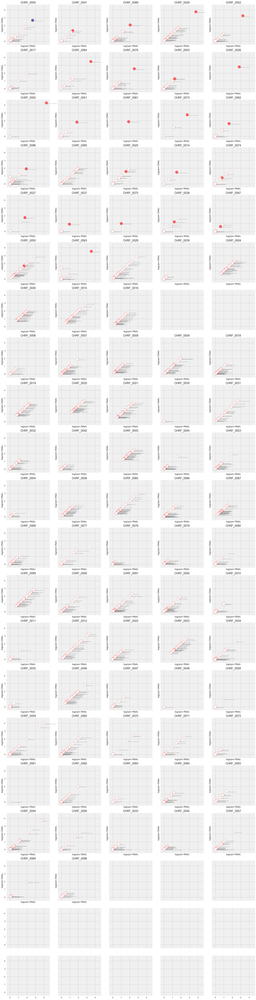

In [13]:
final_results = {}
top_microbes_file = open('./output/' + output_directory + '/top_microbes_by_patient.txt','w')

percent_represented_in_topX_RNA = []
percent_represented_in_topX_DNA = []

RNA_diversity = {}
DNA_diversity = {}

RNA_value = []
DNA_value = []
positive = []
pathogenic = []
virus = []
nrnt_model = []
groupid = []
microbe_id = []
microbe_id_genus = []
patient_id = []
ranks = []
nt_genusz_dna = []
nt_genusz_rna = []

RNA_value_test = []
DNA_value_test = []
positive_test = []
pathogenic_test = []
virus_test = []
nrnt_model_test = []
test_files = []

sensitivity_analysis_results = {}

cultured_fill = ['none',]
cultured_colors = ['blue','red']

fig, axarr = plt.subplots(21,5, figsize=(20, 92), sharex=True, sharey=True)#, facecolor='white')

row = 0
col = 0

f = open('./output/' + output_directory + '/raw_data_pathogen_scoring.txt','w')
do_not_continue = False
ranks_from_culture = {}

list_of_files = list(bacterial.keys())
prev_sample_tc = 0

for i in ordered_list_of_files:   # loop through all files
    print(i)

    sample_id = i.split('/')[-1].split('.')[0].upper()
    metadata_id = metadata.loc[metadata['sample_name_RNA'] == sample_id].index[0]   
    
    tc = true_classification.loc[[sample_id],:]['effective_group'][0]   # set group ID
    ranks_from_culture[i] = []

    if tc == 1 or tc == 4 or tc ==3 or tc ==2 or tc == 5:

        if(not do_not_continue):
            
            # this modifies the scatterplot point shape based on the group, 
            # currently setting all to circles
            group = 'o'  
            
            # in the plot of log(RNA rpM) x log(DNA rpM) we want to divide into sections based 
            # on sample adjuciation - all samples from Group 1 are grouped together, followed by 
            # all samples in G2, etc. This section creates a new line whenever the group switches.
            if tc == 1 and prev_sample_tc < tc:
                print('hi')
            if tc == 2 and prev_sample_tc < tc:
                row += 1
                col = 0
            if tc == 3 and prev_sample_tc < tc:
                row += 1
                col = 0
            if tc == 4 and prev_sample_tc < tc:
                row +=1 # 0
                col = 0

            bac = full[i] 

            if(bac.shape[0] > 0):
                bac = bac.reset_index()
                
                # sort the operating matrix by column RPM
                bac.sort_values(by='genus_NT_rpm RNA', inplace=True, ascending=False)   
                bac = bac.reset_index() #reindex([i for i in range(len(bac.index))])
                
                # Keep track of the percent of all microbial rpM that are represented in the 
                # top 15 microbes. This threshold was selected based on the fact that all 
                # culture-identified microbes were present w/in the top 15. Here we quantify
                # the total % microbial represnted by this subset.
                try:
                    percent_represented_in_topX_DNA.append(bac.head(n=topX)['genus_NT_rpm DNA']
                                                           .sum()/bac['genus_genus_NT_rpm DNA'].sum())
                except:
                    print("could not append DNA % in top 15")
                try:
                    percent_represented_in_topX_RNA.append(bac.head(n=topX)['genus_NT_rpm RNA']
                                                           .sum()/bac['genus_NT_rpm RNA'].sum())
                except:
                    print("could not append RNA % in top 15")
                
                # topX allows us to select the top N microbes (15 for the purpose of the study)
                bac = bac.head(n=topX) 
                print(bac)
                
                bac['genus_NT_rpm DNA scaled'] = (bac['genus_NT_rpm DNA']
                                                 /bac['genus_NT_rpm DNA'].sum())
                bac['genus_NT_rpm RNA scaled'] = (bac['genus_NT_rpm RNA']
                                                 /bac['genus_NT_rpm RNA'].sum())              
                bac.fillna(0)
                
                DNA_diversity[i.split('/')[4].split('.')[0]] = (1- simpson_di(dict(bac['genus_NT_rpm DNA'])))
                RNA_diversity[i.split('/')[4].split('.')[0]] = (1- simpson_di(dict(bac['genus_NT_rpm RNA'])))
                
                
                # this outputs the full topX microbes (DNA and RNA data) to .txt file .
                top_microbes_file = open('./output/' + output_directory + 
                                         '/top_microbes_by_patient.txt','a')
                top_microbes_file.write("\n----\n" + i + "\n\n")
                top_microbes_file.close()
                top_microbes_file = open('./output/' + output_directory + 
                                         '/top_microbes_by_patient.txt','a')
                bac.to_csv('./output/' + output_directory + 
                           '/top_microbes_by_patient.txt', sep='\t', mode='a')
                top_microbes_file.write("\n\n")
                top_microbes_file.close()
                
                grew_in_culture = []   # fill color
                is_pathogen = []       # edge color
                is_virus = []          # shape (square = virus, circle = bacteria/fungi)
                nrnt_pointsize = []    # NO LONGER APPLICABLE

                bac = bac.dropna(axis=0, how='all')

                rank_number_identified = 0
                for n in bac.index:
                    rank_number_identified += 1   # increment with each microbe

                    
                    # implementing a heuristic for assigning most likely 
                    # species to genus-level rpM
                    curr_genus = bac.loc[n]['name_x']    # default is DNA species...
                    species_colID = 'name_x'
                    
                    # ...but if RNA rM is greater, then set curr_genus to the RNA species
                    if bac.loc[n]['genus_NT_rpm DNA'] < bac.loc[n]['genus_NT_rpm RNA']:   
                        curr_genus = bac.loc[n]['name_y']
                        species_colID = 'name_y'

                    # TODO: Could remove this section - 
                    # no longer looking at NR:NT ratio for this paper
                    # if(with_nrnt_concordance):
                    if(True):
                        # get the genus to use as a tag for finding the concordance
                        #g = ' '.join(bac.loc[n]['genus_taxid'].split(' ')[0:-3])   
                        g = bac.loc[n]['genus_taxid'] 
                        try:
                            # try to append the NRNT point size
                            nrnt_pointsize.append(float(nrnt_values.loc[g]['prop'])) 
                            print("WEIRD...NRNT WAS FOUND: " + str(g))
                        except:   # if the NRNT value can't be found, just append zero...
                            # ...  cases in which it can't be found are when rM is extremely low
                            nrnt_pointsize.append(1)  #NO NRNT POINT SIZE

                    #
                    # set the facecolor of points based on classificaiton of microbe. Overall... 
                    # blue = non-pathogenic bacteria/fungi
                    # green = non-pathogenic virus
                    # red = pathogenic (bacteria, virus, or fungi)
                    #
                    
                    set_color = "darkblue"     # default blue
                    if (curr_genus in list_of_viruses_in_dictionary) or ('irus' in str(curr_genus)):  #if genus is any virus, green
                        set_color = "green"
                        is_virus.append("green")   
                    else:
                        is_virus.append('none')
                    # set red if pathogen, regardless of whether it was previously 
                    # set to green for "virus"; this means that viruses on list of pathogens
                    # will appear red, not green.

                    try:
                        if (curr_genus in full_respiratory_microbes_list) or (curr_genus.split(' ')[0] in full_respiratory_microbes_list):  
                            set_color = "red"
                    except:
                        if (curr_genus in full_respiratory_microbes_list):
                            set_color = "red"
                    
                    # to the vector of pathogenicity, append the color; red == pathogen
                    is_pathogen.append("red")#set_color)  # "red") ADDED 7/6 to make all microbes "pathogens" 

                    
                    #
                    # set the fill color based on whether the microbe grew in culture
                    # colors are consistent with the outline colors when grew_in_culture is true,
                    # otherwise fill color is empty
                    # 
                    
                    #'''
                    if (tc == 1 or tc==2) and not (isinstance((metadata.loc[metadata_id]['organism']), float)): # this grew in culture
                        if bac.loc[n]['Species_Assignment'] in list(metadata.loc[metadata_id]['organism'].split(',')):      
                            ranks_from_culture[i].append(rank_number_identified)
                            grew_in_culture.append(set_color) 
                            #elif len(bac.loc[n]['Species_Assignment']) == 1 and sum([bac.loc[n]['Species_Assignment'] in i for i in list(metadata.loc[metadata_id]['organism'].split(','))]) > 0:
                            #ranks_from_culture[i].append(rank_number_identified)
                            #grew_in_culture.append(set_color) 
                        else:
                            grew_in_culture.append('white')     # this did not grow in culture
                    else:
                        #'''
                        # this was not in G1 or G2, therefore did not grow in culture 
                        grew_in_culture.append('white')    
                        
                    g = bac.loc[n]['genus_taxid']   # genus-level microbe ID
                    

                #
                # make plot of all microbes, split by individuals, weighted by nrnt concordance 
                #
        
                # this defines the plot structure - 5 columns, up to 21 rows 
                # (bc we have 100 samples)
                if row < 21 and col < 5: 
                
                    correct_species_names = []
                
                    # plot viruses a different shape
                    bac['is_pathogen'] = is_pathogen
                    bac['grew_in_culture'] = grew_in_culture
                    bac['nrnt_pointsize'] = nrnt_pointsize
                    bacv = bac[bac['category_name']=="Viruses"] 
                    baco = bac[bac['category_name']!="Viruses"] 
                    
                    
                    
                    axarr[row,col].scatter(np.log10((baco['genus_NT_rpm RNA']+1)),  
                           np.log10((baco['genus_NT_rpm DNA']+1)),
                           alpha = .6, edgecolor=baco['is_pathogen'], 
                           facecolor = baco['grew_in_culture'], 
                           marker='o', s =[max(j*200,20) for j in baco['nrnt_pointsize']]) 
                           #,linewidth='1.2' )
                    axarr[row,col].scatter(np.log10((bacv['genus_NT_rpm RNA']+1)),  
                           np.log10((bacv['genus_NT_rpm DNA']+1)),
                           alpha = .6, edgecolor=bacv['is_pathogen'], 
                           facecolor = bacv['grew_in_culture'], 
                           marker='s', s =[max(j*200,20) for j in bacv['nrnt_pointsize']]) 
                           #,linewidth='1.2' )

                    
                    '''
                    plt.scatter(np.log10((baco['genus_NT_rpm RNA']+1)),  
                           np.log10((baco['genus_NT_rpm DNA']+1)),
                           alpha = .6, edgecolor=bacv['is_pathogen'], 
                           facecolor = baco['grew_in_culture'], 
                           marker='o', s =[max(j*200,20) for j in baco['nrnt_pointsize']] )
                    plt.show()
                    '''
                    
                    
                    # loop through microbes and annotate the scatterplot with text 
                    for n in bac.index:
                        curr_genus = bac.loc[n]['name_x']    # default is DNA species...
                        species_colID = 'name_x'
                        # ... but if RNA rM is greater, then curr_genus is the rna genus
                        if bac.loc[n]['genus_NT_rpm DNA'] < bac.loc[n]['genus_NT_rpm RNA']:    
                            curr_genus = bac.loc[n]['name_y']
                            species_colID = 'name_y'
                        #'''    
                        # annotate
                        axarr[row,col].annotate(bac.loc[n][species_colID], 
                                         (np.log10((bac.loc[n]['genus_NT_rpm RNA']+1)) + .1, 
                                         np.log10((bac.loc[n]['genus_NT_rpm DNA']+1)) - .1),
                                         fontsize=4, color='grey') 
                        
                        #'''
                        correct_species_names.append(bac.loc[n][species_colID])
                    

                    # set axis parameters and labels
                    #axarr[row,col].set_title(
                    #    'TA-'+i.split('/')[5].split('.')[0].split('-')[1], fontsize=14)
                    axarr[row,col].set_title(metadata_id, fontsize=14)
                    axarr[row,col].set_xticks(np.arange(0,4.5,1))
                    axarr[row,col].set_yticks(np.arange(0,4.5,1))
                    axarr[row,col].set_xlabel('log(rpm RNA)')
                    axarr[row,col].set_ylabel('log(rpm DNA)')
                    
                    #axarr[row,col].set_facecolor('white')

                    # if you have reached the last column of subplots, 
                    # move to the next row in subplot grid
                    if col == 4:
                        row += 1
                        col = 0
                    else:
                        col += 1

                    #
                    # CALCULATE/STRUCTURE VALUES TO BE PUT INTO LOGISTIC REGRESSION:
                    #
                       
                    #for sensitivity analysis with real model 
                    RNA_value = RNA_value + list(np.log10((bac['genus_NT_rpm RNA']+1)))  
                    DNA_value = DNA_value + list(np.log10((bac['genus_NT_rpm DNA']+1)))  
                    positive = positive + grew_in_culture
                    pathogenic = pathogenic + is_pathogen
                    virus = virus + is_virus
                    nrnt_model = nrnt_model + nrnt_pointsize
                    groupid = groupid + [tc for l in range(len(nrnt_pointsize))]
                    microbe_id = microbe_id  + correct_species_names
                    microbe_id_genus = microbe_id_genus + [bac['genus_taxid'][i] for 
                                                           i in range(len(bac['genus_taxid']))]
                    patient_id = patient_id + [i.split('/')[-1] for 
                                               l in range(len(nrnt_pointsize))]
                    nt_genusz_rna = nt_genusz_rna + list(bac['NT_zscore RNA'])
                    nt_genusz_dna = nt_genusz_dna + list(bac['NT_zscore DNA'])
                    ranks = ranks + [j for j in range(len(bac.index))]
                    
                    
            # bac.shape was < 1, so no microbes identified - fill these values with zero. 
            else:  
                
                if row < 21 and col < 5:  # no real data to plot
                    
                    # just set axis parameters and labels
                    #axarr[row,col].set_title(
                    #    'TA-'+i.split('/')[5].split('.')[0].split('-')[1], fontsize=14)
                    axarr[row,col].set_title(metadata_id, fontsize=14)
                    axarr[row,col].set_xticks(np.arange(0,4.5,1)) 
                    axarr[row,col].set_yticks(np.arange(0,4.5,1)) 
                    axarr[row,col].set_xlabel('log(rM RNA)')
                    axarr[row,col].set_ylabel('log(rM DNA)')
                    #axarr[row,col].set_axis_bgcolor('white')

                    # if you have reached the last column of subplots, 
                    # move to the next row in subplot grid
                    if col == 4:
                        row += 1
                        col = 0
                    else:
                        col += 1
                        
    else:
        print("Warning: what is going on??")
    prev_sample_tc = tc

plt.savefig('./output/' + output_directory + '/FigureS1.pdf', transparent=True)   # save figure to .pdf file

<Figure size 1080x216 with 0 Axes>

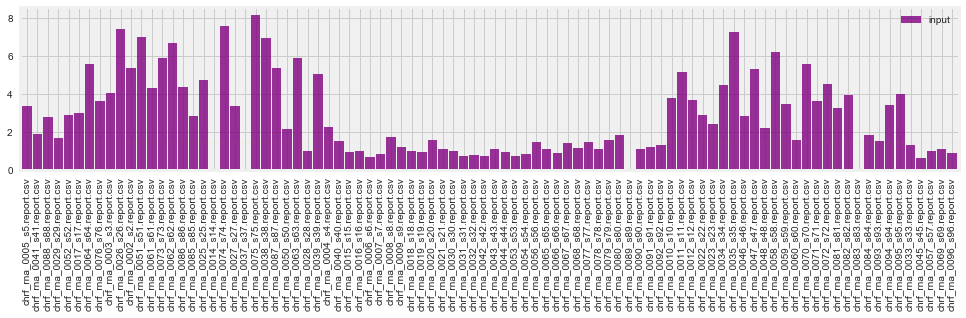

In [14]:
rna_input = pd.read_csv(
    './data/' + data_directory +
    '/rna_input_070618.tsv',
    sep='\t',
    header=0,
    index_col=0)

rna_input.index = [i.lower() for i in rna_input.index]
x = [i.split('/')[-1].split('.')[0]+'.report.csv' for i in list(ordered_list_of_files)]
rna_input = rna_input.loc[x]

plt.figure(figsize=(15,3))
log(rna_input+1).plot(kind='bar',color='purple', width=.9, alpha = .8,figsize=(15,3))
plt.axhline(y=1.4, linestyle=':', lw=.1, color='orange')
plt.savefig('./output/' + output_directory + '/rna_input_barplot.pdf' , bbox_inches='tight')


The previous cell collected the % of total reads per million that were covered by the top N microbes, per patient on both RNA- and DNA-seq. This analysis presents statistics on the distribution of percent rpM represented.

In [15]:
print("RNA")
print(scipy.stats.describe(percent_represented_in_topX_RNA))
print("IQR:" + str(np.median(percent_represented_in_topX_RNA)-
                   scipy.stats.iqr(percent_represented_in_topX_RNA)) + " - " + 
      str(np.median(percent_represented_in_topX_RNA)+
          scipy.stats.iqr(percent_represented_in_topX_RNA)))

print("\nDNA")
pDNA = [i for i in percent_represented_in_topX_DNA if not np.isnan(i) ]
print(scipy.stats.describe(pDNA))
print("IQR: " + str(np.median(pDNA)-scipy.stats.iqr(pDNA)) + " - " + 
      str(np.median(pDNA)+scipy.stats.iqr(pDNA)))

total_topX = percent_represented_in_topX_RNA+pDNA
print("\nTOTAL")
print(scipy.stats.describe(total_topX))
print("IQR: " + str(np.median(total_topX)-scipy.stats.iqr(total_topX)) + " - " + 
      str(np.median(total_topX)+scipy.stats.iqr(total_topX)))

RNA
DescribeResult(nobs=89, minmax=(0.8468112798264643, 1.0), mean=0.9922231641015362, variance=0.0005713488310581245, skewness=-4.161565614944486, kurtosis=18.680611233342397)
IQR:1.0 - 1.0

DNA


ValueError: The input must not be empty.

### Analysis of Ranks of NGS identification

> "To this point, while we detected all 39 pathogens identified from clinician-ordered microbiologic tests in the 26 LRTI+C+M patients using mNGS (Table S3), a ten-fold greater number of airway commensals were also identified."

The goal was to convey the fact that 100% of microbes identified by clinical culture were identified within the sequencing results. To accomplish this, I sought to generate a figure similar to Fig 2B from this paper: https://www.biorxiv.org/content/biorxiv/early/2017/08/17/177402.full.pdf


KeyError: "None of [['CHRF_0002']] are in the [index]"

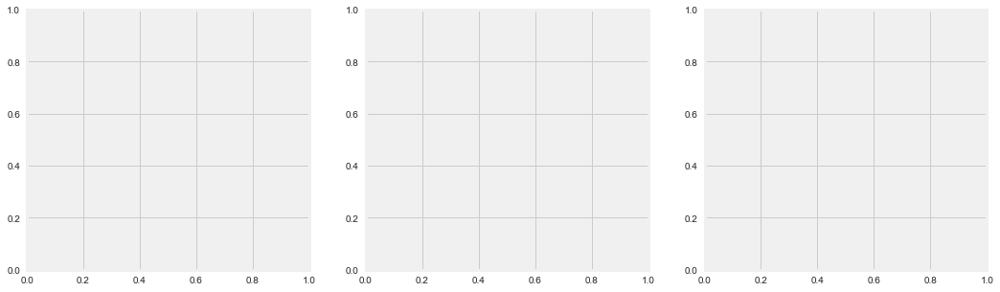

In [16]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,5))

all_ranks = {}  # dictionary, keys are the ranks and values are the number of times a microbe had that rank
only_first_ranks = {}
s = 0
s2 = 0

for i in list_of_files:   # loop through all the files
    sample_id = i.split('/')[-1].split('.')[0].upper()
    #sample_id = i.split('/')[-1].split('.')[-3]   # get the sample ID from filename
    # get the metadata for that sample ID
    metadata_id = metadata.loc[metadata['sample_name_RNA'] == sample_id].index[0]   
    # get the true classification for that sample
    tc = true_classification.loc[[metadata_id],:]['effective_group'][0] 
    #print(tc)
    
    # use dictionary of ranks created while plotting per-sample rM RNA and rM DNA (above); 
    # parse for plotting.
    for j in ranks_from_culture[i]:   
        s += 1
        try:
            all_ranks[j] += 1
        except:
            all_ranks[j] = 1
    if(len(ranks_from_culture[i]) > 0):  # if something grew in culture
        s2 += 1
        try:
            only_first_ranks[ranks_from_culture[i][0]] += 1
        except:
            only_first_ranks[ranks_from_culture[i][0]] = 1
        

# plot the first panel with proportions of all microbes
(pd.Series(all_ranks)/s).plot('bar',width=.9, ax=axes[0],color='#007acc')

# plot the second panel with proportions including only the most abundant microbe per patient
(pd.Series(only_first_ranks)/s2).plot('bar',width=.9,ax=axes[1], color='#e6b800')

# loop through and convert count data to cummulative proportions
# cummulative proportions for the "all microbes" data
all_ranks_cummulative = all_ranks
all_ranks_cummulative[2] = all_ranks_cummulative[1] + all_ranks_cummulative[2]
all_ranks_cummulative[3] = all_ranks_cummulative[2] + all_ranks_cummulative[3]
all_ranks_cummulative[4] = all_ranks_cummulative[3] + all_ranks_cummulative[4]
all_ranks_cummulative[7] = all_ranks_cummulative[4] + all_ranks_cummulative[7]
if topX == 15:
    all_ranks_cummulative[10] = all_ranks_cummulative[10] + all_ranks_cummulative[7]
    all_ranks_cummulative[13] = all_ranks_cummulative[13] + all_ranks_cummulative[10]

# cummulative proportions for the "only top microbe" data
only_first_ranks_cummulative = only_first_ranks
only_first_ranks_cummulative[2] = (only_first_ranks_cummulative[1] + 
                                   only_first_ranks_cummulative[2])
only_first_ranks_cummulative[3] = (only_first_ranks_cummulative[2] +
                                   only_first_ranks_cummulative[3])
only_first_ranks_cummulative[4] = (only_first_ranks_cummulative[3] +
                                   only_first_ranks_cummulative[4])
    
# create a merged dataframe for final panel plot
cumm_rank_df = pd.DataFrame({'All Ranks': all_ranks_cummulative, 
                             'First Ranks': only_first_ranks_cummulative})
cumm_rank_df.fillna(26, inplace=True)
cumm_rank_df_norm = cumm_rank_df/cumm_rank_df.max()
cumm_rank_df_norm.columns=['All Microbes (including polymicrobial)',
                           'Most Abundant Pathogen per Patient']

# plot the side-by-side representation
ax = cumm_rank_df_norm.plot(kind="bar", ax=axes[2], color = ['#007acc','#e6b800']
                           ).legend(bbox_to_anchor=(.8, -.15))

# append details to the plot (axes and legend) on third panel
plt.yticks(np.arange(0,1.05,.1))
plt.ylim(0,1.05)
plt.xlabel("Culture Confirmed Rank")
plt.ylabel("Proportion of Samples")
plt.title("RNA-seq Rank of All Clinically-confirmed \nPathogens Including Multi-Culture")

plt.show()

# print the data used to generate the plots
print("Cummulative # of Microbes at each Rank:")
print(pd.Series(all_ranks_cummulative))

print("\nCummulative # of Top Microbes at each Rank:")
print(pd.Series(only_first_ranks_cummulative))

print("\n")
print(cumm_rank_df_norm)

In [17]:
# Get the sensitivity/specificity for identifying microbes as the patient-level.
# Did we pick up the microbe at all by NGS? 
# Note: This is separate from the linear model for identifying putative pathogens

had_cultured_organism = 0
at_least_one_organism_identified_by_ngs = 0
all_organisms_identified_by_ngs = 0
total_number_organisms_culture = 0
total_number_organisms_anyNGS = 0

for i in list_of_files:
    sample_id = i.split('/')[-1].split('.')[-3]
    metadata_id = metadata.loc[metadata['RNAfilename'] == sample_id].index[0]
    tc = true_classification.loc[[sample_id],:]['effective_group'][0]
    bac = full[i]

    try:
        if tc == 1:
            
            #cmd will fail if nan, so since it doesn't fail there was a cultured organism
            organism_list = metadata.loc[metadata_id]['organism'].split(',') 
            
            total_number_organisms_culture += len(organism_list)
            if(len(organism_list) > 0):    
                had_cultured_organism += 1
                ID_by_NGS = [bac.loc[i]['Genus'] for i in bac.index if 
                             bac.loc[i]['Genus'] in organism_list]
                
                total_number_organisms_anyNGS  += len(ID_by_NGS) 
                    
                if len(ID_by_NGS) > 0:
                    at_least_one_organism_identified_by_ngs += 1
                    
                if len(set(ID_by_NGS)) == len(set(organism_list)):
                    all_organisms_identified_by_ngs += 1
                else:
                    print(i.split('/')[-1] + " is missing the following organisms by NGS:")
                    print(set(organism_list)-set(ID_by_NGS))
    except:
        if tc == 1:
            #if tc is 1 and no organism is listed, we want to know...otherwise skip
            print(metadata.loc[metadata_id]['organism'])  

print("# of patients that had a cultured organism: " 
      + str(had_cultured_organism))
print('# of patients that had at least one cultured organism identified in NGS: '
      + str(at_least_one_organism_identified_by_ngs))
print('# of patients that had all cultured organisms identified in NGS: '
      + str(all_organisms_identified_by_ngs))

print('Total # of organisms in culture: ' 
      + str(total_number_organisms_culture))
print('Total # of organisms in culture, identified AT ALL by NGS: ' 
      + str(total_number_organisms_anyNGS))


IndexError: list index out of range

# Set-up Data from LR and RB Models

> "For both models, microbes identified by clinician-ordered diagnostics in LRTI+C+M patients and all viruses with established respiratory pathogenicity, were considered pathogens (n=12 in derivation cohort and n=26 in validation cohort, Table S1). Any additional microbes identified by NGS were considered commensals (n = 155 in derivation cohort, n=174 in validation cohort)."

This code creates the main data structure that will be used to implement the rules-based and logistic regression models - a dataframe with one line per sample containing 
- RNAvalue
- DNAvalue
- groupID
- rank
- microbeID
- patient
- pathogenicity
- virus status
- and whether the microbe was identified in culture.

In [15]:
# Parse out the relevant features from Figure S1 - generated in main analysis above.
sensitivity_DF = pd.DataFrame.from_dict({'RNAvalue':RNA_value,
                                         'DNAvalue':DNA_value,
                                         'groupID':groupid,
                                         'positive':positive,
                                         'pathogenic':pathogenic,
                                         'nrnt':nrnt_model,
                                         'ranks':ranks,
                                         'virus':virus,
                                         'microbe':microbe_id,
                                         'microbe_genus':microbe_id_genus, 
                                         'patient':patient_id, 
                                         'nt_Z_rna':nt_genusz_rna,
                                         'nt_Z_dna':nt_genusz_dna}, orient='columns')

X = sensitivity_DF[['RNAvalue','DNAvalue','nrnt','groupID','ranks','microbe',
                    'patient','microbe_genus','nt_Z_rna','nt_Z_dna']]
X[['pathogenic_red']] = sensitivity_DF[['pathogenic']] == 'red'
X[['pathogenic_green']] = sensitivity_DF[['virus']] == 'green'
X[['pathogenic_darkblue']] = sensitivity_DF[['pathogenic']] == 'darkblue'
X['positive'] = sensitivity_DF[['positive']]!="white"#"none"

# Full training dataset
X.fillna(0,inplace=True)
Y = X[['positive']]
Y = Y['positive'].tolist()

# Separate out by group membership for training and analysis of True Positive / True Negative
X_g1 = X[X['groupID'] == 1]
print(X_g1.shape)
X_g2 = X[X['groupID'] == 2]
print(X_g2.shape)
X_g3 = X[X['groupID'] == 3]
print(X_g3.shape)
X_g4 = X[X['groupID'] == 4]
print(X_g4.shape)
X_g1g4 = pd.concat([X_g1, X_g4], axis=0)

# generate the outcome vectors based on whether microbe was identified by standard microbiology
Y_g1 = X_g1[['positive']]
Y_g1 = Y_g1['positive'].tolist()
Y_g2 = X_g2[['positive']]
Y_g2 = Y_g2['positive'].tolist()
Y_g3 = X_g3[['positive']]
Y_g3 = Y_g3['positive'].tolist()
Y_g4 = X_g4[['positive']]
Y_g4 = Y_g4['positive'].tolist()
Y_g1g4 = X_g1g4[['positive']]
Y_g1g4 = Y_g1g4['positive'].tolist()

X.to_csv('./output/' + output_directory + '/microbe_model_data.csv')  # save full dataset to .csv
X.head() # demo of training data

(373, 14)
(0, 14)
(282, 14)
(545, 14)


,RNAvalue,DNAvalue,nrnt,groupID,ranks,microbe,patient,microbe_genus,nt_Z_rna,nt_Z_dna,pathogenic_red,pathogenic_green,pathogenic_darkblue,positive
0,2.669224,2.669224,1,1.0,0,Enterobacter hormaechei,chrf_rna_0005_s5.csv,547,99.0,99.0,True,False,False,True
1,1.842609,1.842609,1,1.0,1,Lactobacillus crispatus,chrf_rna_0005_s5.csv,1578,17.7,17.7,True,False,False,False
2,1.613842,1.613842,1,1.0,2,Citrobacter freundii,chrf_rna_0005_s5.csv,544,99.0,99.0,True,False,False,False
3,0.857332,0.857332,1,1.0,3,Fusobacterium nucleatum,chrf_rna_0005_s5.csv,848,6.0,6.0,True,False,False,False
4,0.612784,0.612784,1,1.0,4,Pluralibacter gergoviae,chrf_rna_0005_s5.csv,1330546,59.8,59.8,True,False,False,False


In [16]:
# separate G1/G4 data further into training and test sets 
# these sample names were identified by random selection of host RNA-seq data based on RNA-seq batches.
X_g1_train = X_g1[X_g1['patient'].isin(training_sample_names)]
X_g4_train = X_g4[X_g4['patient'].isin(training_sample_names)]
X_g1g4_train = pd.concat([X_g1_train,X_g4_train])
Y_g1_train = X_g1_train['positive'].tolist()
Y_g4_train = X_g4_train['positive'].tolist()

X_g1_test = X_g1[~X_g1['patient'].isin(training_sample_names)]
X_g4_test = X_g4[~X_g4['patient'].isin(training_sample_names)]
X_g1g4_test = pd.concat([X_g1_test,X_g4_test])
Y_g1_test = X_g1_test['positive'].tolist()
Y_g4_test = X_g4_test['positive'].tolist()

print("Training data contains: " + str(X_g1g4_train.shape[0]) + 
      " total microbes from 20 patients (in the LRTI+C/+M and LRTI-NEG training set), of which " + 
      str(X_g1g4_train[X_g1g4_train['positive']==True].shape[0]) + 
      " microbes are considered POSITIVE (grew in culture).")
print("The test data contains: " + str(X_g1g4_test.shape[0]) + 
      " total microbes from all remaining patients in the validation cohort, of which " + 
      str(X_g1g4_test[X_g1g4_test['positive']==True].shape[0]) + 
      " microbes are considered POSITIVE (grew in culture).")

Training data contains: 0 total microbes from 20 patients (in the LRTI+C/+M and LRTI-NEG training set), of which 0 microbes are considered POSITIVE (grew in culture).
The test data contains: 918 total microbes from all remaining patients in the validation cohort, of which 25 microbes are considered POSITIVE (grew in culture).


## Quantify the observation that RNA rpM is generally > DNA rpM 

> "RNA-Seq yielded a greater abundance of sequences as compared to DNA-seq for 79% of microbes, with a mean of 89 more reads per million reads mapped (rpm) than DNA-Seq (IQR: 0.11 - 29.0 rpm) per microbe."

% of all microbes with RNA > DNA rpM: 0.0
Mean: 0.9959170551002499
Min: 0.03937007874015748
25th percentile: 1.0
50th percentile: 1.0
75th percentile: 1.0
Max: 1.0


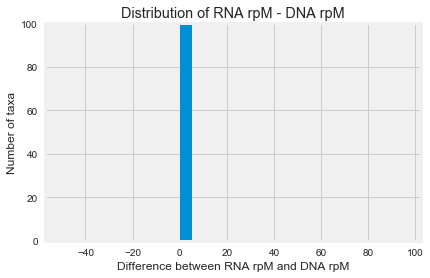

In [17]:
# quantify the difference in RNA rpm v. DNA rpm 

# not including RNA viruses in this calculation bc they can't have DNA
not_virus = X[X['DNAvalue'] > 0]                                   
# reverse the log conversion to report true rpm difference
dif_RNAvDNAx = 10**not_virus['RNAvalue']-10**not_virus['DNAvalue']  
dif_RNAvDNA = (10**not_virus['RNAvalue'])/10**not_virus['DNAvalue']

# add column to dataframe to ease reporting of analysis
not_virus['RNAminusDNA'] = dif_RNAvDNA                             

# report the statistics:
print("% of all microbes with RNA > DNA rpM: " + str(sum(dif_RNAvDNAx > 0)/len(dif_RNAvDNA)))
print("Mean: " + str(np.mean(dif_RNAvDNA)))
print("Min: " + str(np.min(dif_RNAvDNA)))
print("25th percentile: " + str(np.percentile(dif_RNAvDNA, 25)))
print("50th percentile: " + str(np.percentile(dif_RNAvDNA, 50)))
print("75th percentile: " + str(np.percentile(dif_RNAvDNA, 75)))
print("Max: " + str(np.max(dif_RNAvDNA)))

# plot histogram of the differences
plt.hist(dif_RNAvDNA, bins=[i*5 for i in range(-10,20)])
plt.title("Distribution of RNA rpM - DNA rpM")
plt.xlabel("Difference between RNA rpM and DNA rpM")
plt.ylabel("Number of taxa")
plt.ylim(0,100)
plt.show()

## Execute Rules-Based Model (RBM) for distinguishing between 'pathogens' and 'commensals'

> "In the RBM, respiratory microbes from each patient were assigned an abundance score based on the sum of log(RNA-Seq) and log(DNA-Seq) genus reads per million (rpm) (Table S3). Microbes were then ranked by this score, and the largest differential between sequentially ranked taxa was used as a threshold to isolate the group of highest-scoring microbes within each patient (Fig2A, Fig S1). These high scoring microbes plus all RNA viruses detected at > 0.1 rpm were captured as putative pathogens by the RBM if present in an a. priori developed index of established lower respiratory pathogens derived from landmark surveillance studies and clinical guidelines (Table S2B)"

Plot the RNA x DNA projection for all microbes - those identified by the RBM are filled, those identified by standard clinical microbiology are red.

In [18]:


def get_split(list_of_values):  #returns the index
    splits = {}
    max_split = 0
    max_split_id = 0
    split_list = []
    for i in range(len(list_of_values)):
        if i == 0:
            splits[i] = 0
            split_list.append(0)
        else:
            splits[i] = -1 * (list_of_values[i] - list_of_values[i-1] )
            split_list.append(splits[i])

        if splits[i] > max_split:
            max_split = splits[i]
            max_split_id = i

    return max_split_id
def apply_rule_based_method_cluster(input_data, input_res, groupID, output_filename, title=None, annotate_plots=False,rbm_method_plot=False):

    rbm1_patient = []
    rbm1_genus = []
    rbm1_microbe = []

    s = int(np.round(len(set(input_data['patient']))/5)+1)

    if rbm_method_plot:
        fig, axarr = plt.subplots(s,5, figsize=(20, s*4), sharex=True, sharey=True)
        row = 0
        col = 0

    for i in list(set(input_data['patient'])):#[0:3]:
        new_adds = 0
        #print(i)

        sub = input_data[input_data['patient']==i]
        sub['rna+dna'] = sub['RNAvalue'] + sub['DNAvalue']
        sub.sort_values(by='rna+dna', ascending=False, inplace=True)

        #ADD POTENTIAL BACTERIAL MICROBES
        subB = sub[sub['pathogenic_green'] == False] #cannot be a virus

        size_of_top_clust = get_split(list(subB['rna+dna']))
        # this was added on 12/28 to deal with cases in which only 1 bacterial microbe is present
        if(size_of_top_clust < 1):
            size_of_top_clust = 1 # there should always be at least 1 microbe in top cluster (if only 1 microbe present)


        ## NEW PLOTTING FUNCTION 2/1
        #plt.figure(figsize=[3,3])
        if rbm_method_plot:
            axarr[row,col].scatter([i for i in range(len(subB['rna+dna']))],subB['rna+dna'],color=[['darkblue','red'][int(i)] for i in subB['pathogenic_red']])
            axarr[row,col].axvline(x=size_of_top_clust - .5, color='r', linestyle='-',lw=.4)
            axarr[row,col].set_title(i)
            axarr[row,col].set_xlim(-1,15)
            axarr[row,col].set_ylim(-1,12)
            axarr[row,col].set_xticks(np.arange(0,15,1)) #MODS 2/1
            axarr[row,col].set_yticks(np.arange(0,12,1)) #MODS 2/1
            for l in range(len(subB.index)):
                axarr[row,col].annotate(subB.iloc[l]['microbe'],(l + .1,subB.iloc[l]['rna+dna']-.1),
                                 fontsize=8, color='grey')
            if col == 4:
                row += 1
                col = 0
            else:
                col += 1


        #print(size_of_top_clust)
        top = subB.head(n=size_of_top_clust)
        top = top[top['pathogenic_red'] == True]
        #print(top)
        for j in range(len(top.index)):
            rbm1_genus.append(str(top['microbe_genus'].iloc[j]))
            rbm1_microbe.append(str(top['microbe'].iloc[j]))
            new_adds += 1

        possible_viruses = sub[[(sub.loc[j]['pathogenic_green'] == True and sub.loc[j]['pathogenic_red'] == True) for j in sub.index]]
        possible_viruses = possible_viruses[possible_viruses['RNAvalue'] > np.log10(.1 + 1)] # RNAvalue is log10(RNA rpm + 1), and we want to keep viruses with rpm > .1
        if(len(possible_viruses.index) > 0):
            res = possible_viruses.head(n=1)
            for j in range(len(res.index)):
                rbm1_genus.append(str(res['microbe_genus'].iloc[j]))
                rbm1_microbe.append(str(res['microbe'].iloc[j]))
                new_adds += 1

        rbm1_patient = rbm1_patient + [i for n in range(new_adds)]

    rbm_g1 = pd.DataFrame.from_dict({'microbe': rbm1_microbe,'patient':rbm1_patient,'microbe_genus':rbm1_genus})
    rbm_g1.drop_duplicates(inplace=True)

    if groupID == 2:
        c = ['blue','blue']
    else:
        c = ['blue','red']

    if rbm_method_plot:
        plt.savefig(output_filename+"_methodplot.pdf")
        plt.show()

    #print([c[int(i)] for i in input_res])

    plt.figure(figsize=[8,8])
    a = [rbm_g1.iloc[i]['microbe'] + "-" + str(rbm_g1.iloc[i]['patient']) for i in range(len(rbm_g1))]
    match = [(str(input_data.iloc[i]['microbe']) + "-" + input_data.iloc[i]['patient'] in a) for i in range(len(input_data.index))]
    plt.scatter(input_data['RNAvalue'],input_data['DNAvalue'],
               edgecolor=[c[int(input_data.loc[i]['positive'])]
                       if input_data[input_data['patient'] == input_data.loc[i]['patient']]['positive'].sum() < 2
                       or c[int(input_data.loc[i]['positive'])] == 'blue'
                       or input_data.loc[i]['RNAvalue'] == max(input_data[(input_data.patient == input_data.loc[i]['patient']) & (input_data.positive == True)]['RNAvalue'])
                       else 'orange' for i in input_data.index],
                s=[85 if match[i] == 1 else 50 for i in range(len(match)) ],#linewidth='1.2',
                facecolor = [c[input_res[i]] if match[i] == 1 else 'white' for i in range(len(match)) ], alpha=.7)
                #facecolor=[c[int(Y_g2[i])] if predicted[:,1][i] > probability_threshold else 'white' for i in range(len(Y_g2)) ],alpha=.6) #s=predicted[:,1]*200
    
    if(annotate_plots):
        for i in range(len(input_res)):
            #if(predicted[:,1][i] > probability_threshold):
            if input_res[i] or match[i] == 1: #if the microbe was True in input_res
                try:
                    sp = input_data.iloc[i]['microbe'].split(' ')
                except:
                    sp = 'NA'
                pa = input_data.iloc[i]['patient'].split('-')[1]
                plt.annotate(sp[0][0] + '. ' + sp[1] + ' - ' + pa,(input_data.iloc[i]['RNAvalue'] + .1,input_data.iloc[i]['DNAvalue']-.1),
                             fontsize=5, color='grey')

    plt.xlim((-.2, 5.5))
    plt.ylim((-.2, 5.5))
    if not title == None:
        plt.title(title)
    else:
        plt.title("Group " + str(groupID) + " - Rule Based Method")
    #plt.axis((-1,12,-1,12))
    plt.xlabel('log( RNA rpM )' )
    plt.ylabel('log( DNA rpM )' )
    plt.savefig(output_filename + ".pdf")

    return rbm_g1

Group 1 RBM Results:


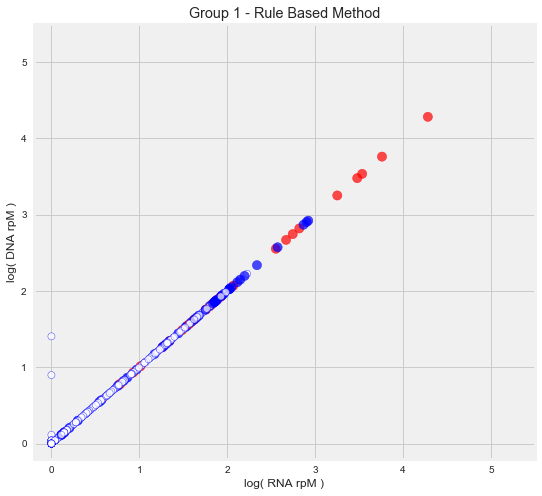

Group 2 RBM Results:


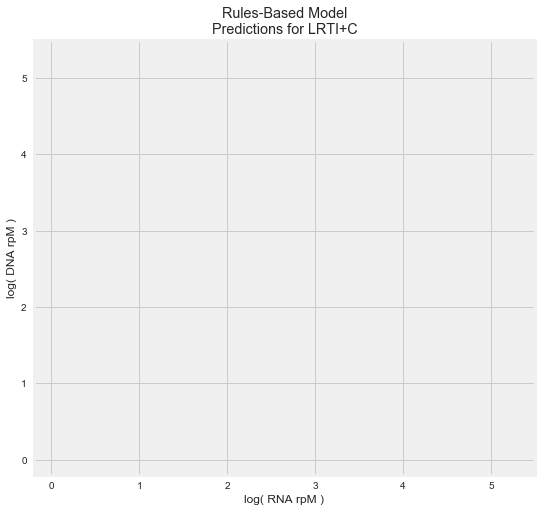

Group 3 RBM Results:


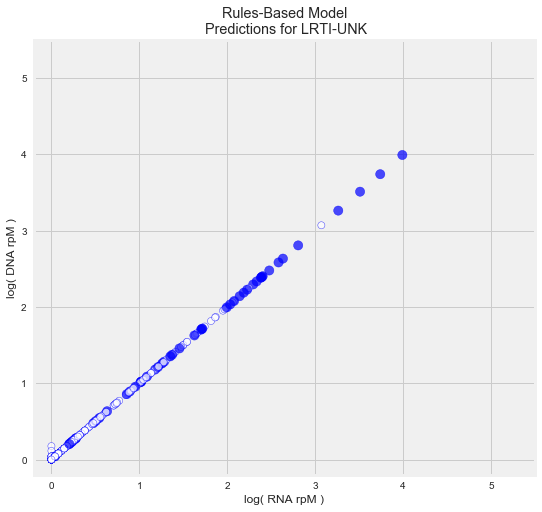

Group 4 RBM Results:


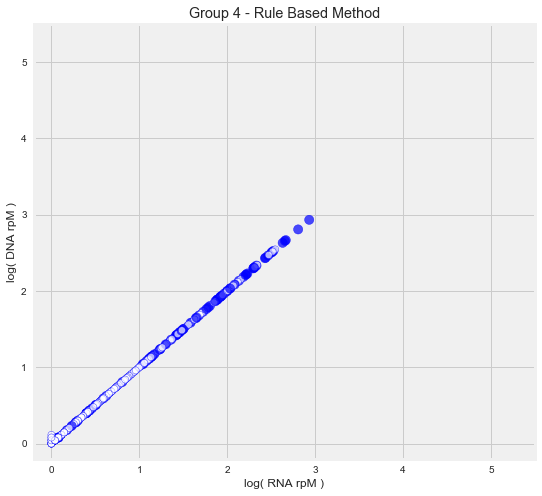

'\n# Evaluate RBM sensitivity against culture results\n# NOTE: this sensitivity calculation is at the per-patient level (as opposed to per-microbe); \n# OUTDATED.\nprint("Group 1 RBM Results:")\nplotting_functions.evaluate_sensitivity(rbm_g1,list_of_files, metadata, \n    true_classification, full, output_directory)\nprint("Group 2 RBM Results:")\nplotting_functions.evaluate_sensitivity(rbm_g2,list_of_files, metadata, \n    true_classification, full, output_directory)\nprint("Group 3 RBM Results:")\nplotting_functions.evaluate_sensitivity(rbm_g3,list_of_files, metadata, \n    true_classification, full, output_directory)\nprint("Group 4 RBM Results:")\nplotting_functions.evaluate_sensitivity(rbm_g4,list_of_files, metadata, \n    true_classification, full, output_directory)\n'

In [19]:
annotate_plots = False # do not want to write microbe names on the plots

# run RBM on Group 1 and Group 4 to generate the combined prediction Figure 2A
# We don't care about training and test sets in the RBM because each sample is 
# processed entirely independently

print("Group 1 RBM Results:") # Group 1 Only
rbm_g1 = apply_rule_based_method_cluster(X_g1, 
                                                            Y_g1, 
                                                            1, 
                                                            './output/' + output_directory +
                                                            '/rbm_1', 
                                                            rbm_method_plot=False)
rbm_g1.to_csv('./output/' + output_directory + '/RBM_G1.csv')
plt.show()

print("Group 2 RBM Results:") # Group 2 Only
rbm_g2 = apply_rule_based_method_cluster(
    X_g2, 
    Y_g2,
    2,
    './output/' + output_directory + '/FigureS3A',
    title="Rules-Based Model\n Predictions for LRTI+C ",
    rbm_method_plot=False)
rbm_g2.to_csv('./output/' + output_directory + '/RBM_G2.csv')
plt.show()

print("Group 3 RBM Results:") # Group 3 Only
rbm_g3 = apply_rule_based_method_cluster(
    X_g3,                                                         
    Y_g3, 
    3, 
    './output/' + output_directory + '/FigureS3C', 
    title="Rules-Based Model\n Predictions for LRTI-UNK", 
    rbm_method_plot=False)
rbm_g3.to_csv('./output/' + output_directory + '/RBM_G3.csv')
plt.show()

print("Group 4 RBM Results:") # Group 4 Only
rbm_g4 = apply_rule_based_method_cluster(
    X_g4, 
    Y_g4, 
    4, 
    './output/' + output_directory + '/rbm_4', 
    rbm_method_plot=False)
rbm_g4.to_csv('./output/' + output_directory + '/RBM_G4.csv')
plt.show()

# rbm_g1 - rbm_g4 results are saved and appended to output TableS3.

'''
# Evaluate RBM sensitivity against culture results
# NOTE: this sensitivity calculation is at the per-patient level (as opposed to per-microbe); 
# OUTDATED.
print("Group 1 RBM Results:")
plotting_functions.evaluate_sensitivity(rbm_g1,list_of_files, metadata, 
    true_classification, full, output_directory)
print("Group 2 RBM Results:")
plotting_functions.evaluate_sensitivity(rbm_g2,list_of_files, metadata, 
    true_classification, full, output_directory)
print("Group 3 RBM Results:")
plotting_functions.evaluate_sensitivity(rbm_g3,list_of_files, metadata, 
    true_classification, full, output_directory)
print("Group 4 RBM Results:")
plotting_functions.evaluate_sensitivity(rbm_g4,list_of_files, metadata, 
    true_classification, full, output_directory)
'''

# Train and Evaluate Logistic Regression Model (LRM) 

First, for distinguishing between 'pathogens' and 'commensals'; then, for separating LRTI+C+M and no-LRTI patients.

> "We thus employed machine learning to distinguish respiratory pathogens from commensals using a logistic regression model (LRM) trained on microbes detected in derivation cohort patients using the predictor variables of: RNA-Seq rpm, DNA-Seq rpm, rank by RNA-Seq rpm, established LRTI pathogen (yes/no), and virus (yes/no). These features were selected to preferentially favor highly abundant organisms with established pathogenicity in the lung, but still permit detection of uncommon taxa that could represent putative pathogens. "

# Training v. Test Set - LR Analysis 

## Assess Model Stability:
Run LR model for 1000 rounds of cross-validation within the Derivation Cohort, further splitting the data intoa training set = 70% and test set = 30% at each iteration.

> "To evaluate LRM performance, we first performed 1000 rounds of cross-validation in which we randomly sub-divided the derivation cohort into training (70%) and test (30%) sets during each round, which yielded an average AUC of 0.93 +/- 0.08 standard deviations."

In [18]:
# SAME AS BLOCK BELOW BUT WITH "_iterative" appended to AUC plot 

from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.ensemble import RandomForestClassifier
import random
import numpy as np
from scipy import interp
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import confusion_matrix

print("sklearn version:")
print(sklearn.__version__)

PROBABILITY_THRESHOLD = .2#0.36 # 0.38 #0.278 #

print("Basic Stats about number of Positive/Negative Cases and Features of each group:\n")
X_pos = X_g1g4_train[X_g1g4_train['positive'] == True]
X_neg = X_g1g4_train[X_g1g4_train['positive'] == False]
print("Number of PATHOGENS in the training set:")
print(X_pos.shape)
print("Number of COMMENSALS in the training set:")
print(X_neg.shape)
print("\nRNA: wilcox p = ",
      str(scipy.stats.ranksums(X_pos[['RNAvalue']],X_neg[['RNAvalue']]).pvalue))
print("DNA: wilcox p = ",
      str(scipy.stats.ranksums(X_pos[['DNAvalue']],X_neg[['DNAvalue']]).pvalue))
print("RANKS: wilcox p = ",
      str(scipy.stats.ranksums(X_pos[['ranks']],X_neg[['ranks']]).pvalue))
print("is respiratory pathogen: Percent in PATHOGENS = " + 
      str(Counter(list(X_pos['pathogenic_red']))[True]/X_pos.shape[0]) + 
      ", Percent in COMMENSALS = " + 
      str(Counter(list(X_neg['pathogenic_red']))[True]/X_neg.shape[0]))
print("is virus: Percent in PATHOGENS = " + 
      str(Counter(list(X_pos['pathogenic_green']))[True]/X_pos.shape[0]) +
      ", Percent in COMMENSALS = " + 
      str(Counter(list(X_neg['pathogenic_green']))[True]/X_neg.shape[0]))
print("\n-----")



training_variables = ['RNAvalue','DNAvalue','pathogenic_red','pathogenic_green','ranks']
many_rounds_train_auc = []
many_rounds_test_auc = []

tprs_iterative = []
aucs_iterative = []
mean_fpr_iterative = np.linspace(0, 1, 100)

#X = X_g1g4_train[training_variables] 

X_combo = pd.concat([X_g1_train,X_g4_train])  # train on both group 1 and group 4 patients
y_combo = Y_g1_train + Y_g4_train   

# track num iterations w/ 1 class (likely the negative class) in the test set
oneclasspresent = 0    
c = ['blue','red']

for i in range(1000):
    X_train, X_test, y_train, y_test = train_test_split(
        X_combo[training_variables], y_combo, test_size=0.3
    ) 
    
    try:
        lr = linear_model.LogisticRegression(C=1000000)
        lr.fit(X_train, y_train)
        
        many_rounds_train_auc.append(
            metrics.roc_auc_score(y_train, lr.predict_proba(X_train)[:,1]))
        many_rounds_test_auc.append(
            metrics.roc_auc_score(y_test, lr.predict_proba(X_test)[:,1]))
        
        fpr, tpr, thresholds = metrics.roc_curve(
            y_test, lr.predict_proba(X_test)[:,1], pos_label=1)  
        tprs_iterative.append(interp(mean_fpr_iterative, fpr, tpr))
        tprs_iterative[-1][0] = 0.0
        roc_auc = auc(fpr, tpr)
        aucs_iterative.append(roc_auc)
        
    except:
        # if only 1 class is present, cannot compute the req'd stats; skip this iteration
        oneclasspresent += 1    

print("\nWARNING: only one class was present in the test set for " + str(oneclasspresent) +
      " rounds of train/test split")
print("\n-----\n\nOutput metrics (at threshold = " + str(PROBABILITY_THRESHOLD) + ")")
print("Logistic regression Train AUC for 1000 rounds CV :: ", np.mean(many_rounds_train_auc))
print("Logistic regression Test AUC for 1000 rounds CV :: ", np.mean(many_rounds_test_auc))

sklearn version:
0.18.1
Basic Stats about number of Positive/Negative Cases and Features of each group:

Number of PATHOGENS in the training set:
(0, 14)
Number of COMMENSALS in the training set:
(0, 14)

RNA: wilcox p =  nan
DNA: wilcox p =  nan
RANKS: wilcox p =  nan


ZeroDivisionError: division by zero

## Obtain final predictions (separating true Training and Test sets)

### Leave-one-patient-out (LOPO) cross-validation to obtain Training Set predictions

LOPO-CV enables us to produce microbe predictions for all microbes in patients in the pre-established derivation set.

In [21]:
# LOPO-CV schematic is as follows:
# IN EACH ITERATION...
#  1. Remove all microbes from one patient
#  2. Train on microbes from all other patients
#  3. Predict for all microbes in the held-out patient
# This results in the predicted [pathogen v. commensal] probability for each microbe 
# in the training set

#
# RUN LOPO-CV ON ALL GROUP 1 AND GROUP 4 PATIENTS
#


# full training data
X_combo = X_g1g4_train 
Y_combo = X_combo[['positive']]

patients_to_remove = list(set(X_combo['patient']))  # names of each patient in the training set
predictions = []
truths = []
training_auc = []
c = ['blue','red']
patient_max_scores = {}
patient_groups = {}

for i in patients_to_remove:  # loop through all patients
    
    # training set is all combo microbes that are not from patient = i
    X_train_sub = X_combo[X_combo['patient'] != i]   
    X_train = X_train_sub[training_variables] 
    y_train = X_train_sub['positive']

    # test set is all combo microbes that are from patient = i
    X_test_sub = X_combo[X_combo['patient'] == i]   
    X_test = X_test_sub[training_variables] 
    y_test = X_test_sub['positive']

    lr = linear_model.LogisticRegression(C=1000000) # large C, effectively no regularization
    lr.fit(X_train, y_train)                        # fit the logistic regression model
    p_test = lr.predict_proba(X_test)[:,1]          # predict on the left-out sub test set
    p_train = lr.predict_proba(X_train)[:,1]        # predict on the training set 
    
    # METRICS for evaluating model performance
    # append subset predictions to list of all predictions
    predictions = predictions + list(p_test)
    # append truth values to list of all true classifications
    truths = truths + list(y_test)
    # calculate AUC for training subset
    training_auc.append(metrics.roc_auc_score([int(j) for j in y_train], p_train))  
        
    # track the maximum pathogen v. commensal score per patient
    patient_max_scores[i] = max(list(p_test))  
    patient_groups[i] = list(X_test_sub['groupID'])[0]   # track the LRTI group
        
    count = 0
    
    # append the pathogen v. commensal LRM "score" value to each row of the X_combo matrix ...
    # ... for downstream plots 
    for j in X_combo[X_combo['patient'] == i].index:  
        X_combo.loc[j,'score'] = p_test[count]
        count += 1
        
print("Mean AUC for LOPO-CV training: " + str(np.mean(training_auc)))  
print("\nTotal AUC for LOPO-CV predictions: " + str(metrics.roc_auc_score([int(i) for 
                                                                           i in truths], 
                                                                          predictions)))
pathogen_functions.get_CI([int(i) for i in truths], predictions, 1000);

# Youden's index for pathogen v. commensal model 
# We are not using this in the analysis for consistency in threshold btwn pathogen v. 
# commensal and LRTI v. no-LRTI models
# youdens_patho_commensal_model = pathogen_functions.Find_Optimal_Cutoff([int(i) for i in truths],
#                                                                            predictions)
# print("Youden's training pathogen v. commensal: " + str(youdens_patho_commensal_model))

Mean AUC for LOPO-CV training: nan


ValueError: Only one class present in y_true. ROC AUC score is not defined in that case.

#### Training Set: Use the max. LRM score per patient to distinguish between LRTI v. no-LRTI patients

> "We recognized that the highest per-patient LRM pathogen versus commensal probability value differed significantly between LRTI+C+M and no-LRTI subjects (p = 3.8 x 10-4 by Wilcoxon rank sum). As such, we hypothesized that this value might have utility not only for pathogen versus commensal prediction, but also for LRTI prediction in general. We tested this idea and found that the maximum per patient LRM probability value predicted LRTI status with an AUC of 0.97 (95% CI = 0.90 - 1.00) in the derivation cohort and 0.93 (95% CI = 0.82 - 1.00) in the validation cohort (Figs 2B, S3)"

In [21]:
# USE THE PATIENT-SPECIFIC MAX SCORE VALUE TO CREATE A CLASSIFIER FOR G1 V. G4 PATIENTS...
# actually, we only have 1 feature so we will just evaluate the AUC.

scores = []
group = []
patient_names = []
for i in patient_max_scores.keys():
    scores.append(patient_max_scores[i])
    group.append(patient_groups[i])
    patient_names.append(i)

# Generate AUC curve for predicting Group 1 v. Group 4 from the top microbe score
#youdens_patient_microbe_model = pathogen_functions.Find_Optimal_Cutoff(group, scores)
#print("Youden's training patient microbe: " + str(youdens_patient_microbe_model))
fpr, tpr, thresholds = metrics.roc_curve(group, scores, pos_label=1)  
print("AUC for distinguishing LRTI+C+M v. no-LRTI patients = " + 
      str(metrics.roc_auc_score([int(i==1) for i in group], scores)))
pathogen_functions.get_CI([int(i==1) for i in group], scores, 1000)

print("\nAt probability threshold = " + str(PROBABILITY_THRESHOLD))
print("TP, FP, TN, FN")
print(pathogen_functions.perf_measure([i > PROBABILITY_THRESHOLD for i in scores], 
                                      [int(i==1) for i in group]))


# PLOT: Figure S3
# AUC curve for LRTI+C+M v. no-LRTI using the max. pathogen v. commensal probability per patient
plt.figure(figsize=(7,7))
plt.plot(fpr, tpr, color='b', lw=3, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('LR Model LOOCV Performance for Distinguishing\n LRTI+C/M from LRTI-NEG Patients')
plt.legend(loc="lower right")
plt.savefig('./output/' + output_directory + '/FigureS2.pdf')
plt.show()

# PLOT: max predicted probability score by patient - for visualization and 
# double-checking feasability of AUC
plt.ylabel("Top Score \n(output from comm v. path model)")
plt.xlabel("Patient")
c=['b','r']
df = pd.DataFrame.from_dict(patient_max_scores, orient='index')
df.index = [i.split('.')[0] for i in df.index]
df['color'] = [int(i == 1) for i in group]
df.sort_values(by=0,inplace=True)
df[0].plot(kind='bar',color='grey',figsize=(10,4), alpha=.4)
plt.scatter([i for i in range(len(df[0]))],df[0],color=[c[i] for i in df['color']],s=100)
plt.show()
print(df[0])  # print out the patient ID and max microbe score (same as plot)


# evaluate the p-value of scores from group 1 and group 4
group1_scores = []
group4_scores = []
for i in range(len(group)):
    if int(group[i] == 1):
        group1_scores.append(scores[i])
    else:
        group4_scores.append(scores[i])

print("P-value for top microbe score in LRTI+C/M versus LRTI-NEG: " + 
      str(scipy.stats.ranksums(group1_scores,group4_scores).pvalue))

# Create the data for per-patient heatmap view showing all microbes that passed 
# the threshold for all patients (in groups 1 and group 4)
creating_matrix_from_Xcombo = X_combo[X_combo['score'] > PROBABILITY_THRESHOLD]
patient_by_microbe_predicted_combo = creating_matrix_from_Xcombo[['microbe',
                                                                  'patient',
                                                                  'microbe_genus']]
patient_by_microbe_predicted_combo.index = [i for i in range(len(
    patient_by_microbe_predicted_combo.index))]


IndexError: index -1 is out of bounds for axis 0 with size 0

### Pathogen v. Commensal LRM model applied to Test Set and LRTI+C and unk-LRTI patient groups

> "We found that both the RBM and the LRM identified previously occult putative pathogens in patients with clinically adjudicated LRTI but negative microbiologic testing (LRTI+C), as well as new potential co-infecting pathogens in the LRTI+C+M subjects (Figs 3, S2, Table S3). Putative new pathogens were identified in 21 (62%) of LRTI+C subjects using the RBM, and 21 (62%) via the LRM (Fig S2, Table S3). Both methods enabled a microbiologic diagnosis in a greater number of LRTI-positive subjects compared to clinician-ordered diagnostics (78% vs 43% for both RBM  and LRM (p < 1.00 x10-4 by McNemar's test, respectively) (Fig 3)."

How to interpret the following plots:
- IF THE EDGE IS RED, it was identified in culture (and should be filled in, true positive)
- IF a red edge is not filled in, then it is a false negative.
- IF an edge is blue, then it was not identified in culture (and should not be filled in, true negative)
- IF a blue circle is filled in then it is a false positive.

'\n\n# unk-LRTI PREDICTIONS\npredicted = lr.predict_proba(X_g3[training_variables]) \nplt.figure(figsize=[8,8])\nplt.scatter(X_g3[\'RNAvalue\'],X_g3[\'DNAvalue\'],\n            edgecolor=[c[int(i)] for i in Y_g3],\n            s=[max(i*200,20) for i in predicted[:,1]],\n            #linewidth=\'1.2\',\n            facecolor=[c[int(Y_g3[i])] if predicted[:,1][i] > \n                       PROBABILITY_THRESHOLD else \'none\' for i in range(len(Y_g3)) ],\n            alpha=.6)\nxlim((-.2, 4.5))\nylim((-.2, 4.5))\nif(annotate_plots):\n    for i in range(len(Y_g3)):\n        if True:\n            try:\n                sp = X_g3.iloc[i][\'microbe\'].split(\' \')\n            except: \n                sp = \'NA\'\n            pa = X_g3.iloc[i][\'patient\'].split(\'-\')[1]\n            plt.annotate(sp[0][0] + \'. \' + sp[1] + \' - \' + pa,\n                         (X_g3.iloc[i][\'RNAvalue\'] + .1,\n                          X_g3.iloc[i][\'DNAvalue\']-.1), \n                         fontsize=7

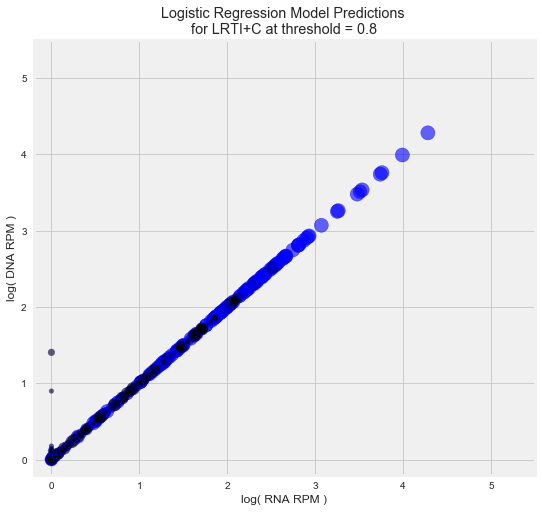

In [22]:
# PLOT THE WEIGHTED PROJECTION OF EACH GROUP'S MICROBES 
# (WEIGHTED by THE PROBABILITY OUTPUT BY LINEAR MODEL)

'''

# create fresh linear model; large C to run non-regularized regression
lr = linear_model.LogisticRegression(C=1000000)
training_variables = ['RNAvalue','DNAvalue','pathogenic_red','pathogenic_green','ranks']

# Train on all Group 1 and Group 4 patients
lr = lr.fit(X_combo[training_variables],Y_combo)

print("LRM Model Coefficients for final pathogen v. commensal trained model:")
print(training_variables)
print(lr.coef_)

# save the combined model to a pickle file 
pickle.dump(lr, open('./output/' + output_directory + '/mBAL_g1g4combo_logRegModel', 'wb'))  

'''

lr = pickle.load( open( "/Users/kkalantar/Documents/Research/MBAL/miniBAL_study/output/042618/mBAL_g1g4combo_logRegModel", "rb" ) )
training_variables = ['RNAvalue','DNAvalue','pathogenic_red','pathogenic_green','ranks']
PROBABILITY_THRESHOLD = .8

#
# TRAIN ON ALL TEST SAMPLES FOR BOTH PATHOGEN V. COMMENSAL MODEL AND PATIENT MICROBE MODEL
#

c = ['blue','red'] # for G1 and G4 projection plot 
                   # (where some microbes were identified by clinical microbiology)
c2 = ['blue','red'] # for G2 and G3 projection pplots



annotate_plots = False 
c = ['blue','blue']

# Plot predicted probabilities for group 2 patients' microbes
predicted = lr.predict_proba(X[training_variables])
plt.figure(figsize=[8,8])
plt.scatter(X['RNAvalue'],X['DNAvalue'],
            edgecolor=[c[int(i)] for i in Y],
            s=[max(i*200,20) for i in predicted[:,1]],
            #linewidth='1.2',
            facecolor=[c[int(Y[i])] if predicted[:,1][i] > 
                       PROBABILITY_THRESHOLD else 'none' for i in range(len(Y)) ],
            alpha=.6) 

xlim((-.2, 5.5))
ylim((-.2, 5.5))
if(annotate_plots):
    for i in range(len(Y)):
        if(predicted[:,1][i] > PROBABILITY_THRESHOLD):
            sp = X.iloc[i]['microbe'].split(' ')
            plt.annotate(sp[0][0] + '. ' + sp[1],
                         (X.iloc[i]['RNAvalue'] + .1,X.iloc[i]['DNAvalue']-.1), 
                         fontsize=7, 
                         color='grey')     
plt.title("Logistic Regression Model Predictions \nfor LRTI+C at threshold = " + 
          str(PROBABILITY_THRESHOLD))
plt.xlabel('log( RNA RPM )')
plt.ylabel('log( DNA RPM )')
plt.savefig('./output/' + output_directory + '/FigureS3B.pdf')
patient_by_microbe_predicted_g2 = pd.DataFrame.from_dict({
    'microbe':[X.iloc[i]['microbe'] for i in range(len(Y))if predicted[:,1][i] > 
               PROBABILITY_THRESHOLD ],
    'patient':[X.iloc[i]['patient'] for i in range(len(Y))if predicted[:,1][i] > 
               PROBABILITY_THRESHOLD],
    'microbe_genus':[X.iloc[i]['microbe_genus'] for i in range(len(Y)) if 
                     predicted[:,1][i] > PROBABILITY_THRESHOLD ]})

# append the group 2 pathogen v. commensal model to the original data matrix
X['score'] = predicted[:,1]


'''
# establish the test set
X_g1g4_test = pd.concat([X_g1_test,X_g4_test])
Y_g1g4_test = list(X_g1g4_test['positive'])

print("\n # of Pathogens v. Commensals in Training and Test sets, respectively:")
print(Counter(Y_combo['positive']))
print(Counter(Y_g1g4_test))

# Plot predicted probabilities for group 1 TEST SET patients' microbes
predicted = lr.predict_proba(X_g1g4_test[training_variables])
X_g1g4_test['score'] = predicted[:,1]  # append the predicted probabilities to the data matrix

# PLOT: RNA v. DNA plot with microbes shown with probabilities.
plt.figure(figsize=[8,8])

# visualize the test set in RNA rM by DNA rM space;
plt.scatter(X_g1g4_test['RNAvalue'],
            X_g1g4_test['DNAvalue'],
            edgecolor=[c[int(X_g1g4_test.loc[i]['positive'])] 
                       if X_g1g4_test[X_g1g4_test['patient'] == 
                                      X_g1g4_test.loc[i]['patient']]['positive'].sum() < 2 
                       or c[int(X_g1g4_test.loc[i]['positive'])] == 'blue' 
                       or X_g1g4_test.loc[i]['score'] == max(
                           X_g1g4_test[(X_g1g4_test.patient == X_g1g4_test.loc[i]['patient']) 
                                       & (X_g1g4_test.positive == True)]['score']) 
                       else 'orange' for i in X_g1g4_test.index],
            s=[max(i*600,3) for i in X_g1g4_test['score']],
            linewidth='1.2',
            facecolor=[c[int(Y_g1g4_test[i])] if predicted[:,1][i] > 
                       PROBABILITY_THRESHOLD else 'none' for i in range(len(Y_g1g4_test)) ],
            alpha=.7) 

# add the scatterplot of predicted TRAINING microbes in RNA rM by DNA rM space;
plt.scatter(X_combo['RNAvalue'],
            X_combo['DNAvalue'],
            edgecolor=[c[int(X_combo.loc[i]['positive'])] 
                       if X_combo[X_combo['patient'] == 
                                  X_combo.loc[i]['patient']]['positive'].sum() < 2 
                       or c[int(X_combo.loc[i]['positive'])] == 'blue' 
                       or X_combo.loc[i]['score'] == max(
                           X_combo[(X_combo.patient == X_combo.loc[i]['patient'])
                                   & (X_combo.positive == True)]['score']) 
                       else 'orange' for i in X_combo.index],
            s=[max(i*600,3) for i in X_combo['score']],
            linewidth='1.2',
            facecolor=[c2[int(X_combo.iloc[i]['positive'])] if X_combo.iloc[i]['score'] > 
                       PROBABILITY_THRESHOLD else 'none' for i in range(len(X_combo['positive'])) ],
            alpha=.4)

xlim((-.2, 4.5))
ylim((-.2, 4.5))
plt.title(
    "Logistic Regression Model Predictions \nfor LRTI+C/M and LRTI-NEG at probability score threshold = " + 
    str(PROBABILITY_THRESHOLD))
plt.xlabel("log( RNA rpM )")
plt.ylabel("log( DNA rpM )")
plt.savefig('./output/' + output_directory + '/Figure2D.pdf')

if(annotate_plots):
    for i in range(len(Y_g1g4_test)):
        if(predicted[:,1][i] > PROBABILITY_THRESHOLD):
            sp = X_g1g4_test.iloc[i]['microbe'].split(' ')
            plt.annotate(sp[0][0] + '. ' + sp[1],
                         (X_g1g4_test.iloc[i]['RNAvalue'] +
                          .1,X_g1g4_test.iloc[i]['DNAvalue']-.1), 
                         fontsize=7, color='grey')     
    
plt.show()


# save the predicted probabilities for each microbe to write to file downstream
patient_by_microbe_predicted_g1g4_test = pd.DataFrame.from_dict({
    'microbe': [X_g1g4_test.iloc[i]['microbe'] for i in range(len(Y_g1g4_test))
         if predicted[:,1][i] > PROBABILITY_THRESHOLD ],
    'patient':[X_g1g4_test.iloc[i]['patient'] for i in range(len(Y_g1g4_test))
               if predicted[:,1][i] > PROBABILITY_THRESHOLD],
    'microbe_genus':[X_g1g4_test.iloc[i]['microbe_genus'] for
                     i in range(len(Y_g1g4_test))if predicted[:,1][i] > 
                                   PROBABILITY_THRESHOLD ]})

print("\n\n")
'''

#
# Predictions for Group 2 (LRTI+C) and Group 3 (unk-LRTI) patients
#

# LRTI+C PREDICTIONS

'''
annotate_plots = False 
c = ['blue','blue']

# Plot predicted probabilities for group 2 patients' microbes
predicted = lr.predict_proba(X_g2[training_variables])
plt.figure(figsize=[8,8])
plt.scatter(X_g2['RNAvalue'],X_g2['DNAvalue'],
            edgecolor=[c[int(i)] for i in Y_g2],
            s=[max(i*200,20) for i in predicted[:,1]],
            #linewidth='1.2',
            facecolor=[c[int(Y_g2[i])] if predicted[:,1][i] > 
                       PROBABILITY_THRESHOLD else 'none' for i in range(len(Y_g2)) ],
            alpha=.6) 

xlim((-.2, 5.5))
ylim((-.2, 5.5))
if(annotate_plots):
    for i in range(len(Y_g2)):
        if(predicted[:,1][i] > PROBABILITY_THRESHOLD):
            sp = X_g2.iloc[i]['microbe'].split(' ')
            plt.annotate(sp[0][0] + '. ' + sp[1],
                         (X_g2.iloc[i]['RNAvalue'] + .1,X_g2.iloc[i]['DNAvalue']-.1), 
                         fontsize=7, 
                         color='grey')     
plt.title("Logistic Regression Model Predictions \nfor LRTI+C at threshold = " + 
          str(PROBABILITY_THRESHOLD))
plt.xlabel('log( RNA RPM )')
plt.ylabel('log( DNA RPM )')
plt.savefig('./output/' + output_directory + '/FigureS3B.pdf')
patient_by_microbe_predicted_g2 = pd.DataFrame.from_dict({
    'microbe':[X_g2.iloc[i]['microbe'] for i in range(len(Y_g2))if predicted[:,1][i] > 
               PROBABILITY_THRESHOLD ],
    'patient':[X_g2.iloc[i]['patient'] for i in range(len(Y_g2))if predicted[:,1][i] > 
               PROBABILITY_THRESHOLD],
    'microbe_genus':[X_g2.iloc[i]['microbe_genus'] for i in range(len(Y_g2)) if 
                     predicted[:,1][i] > PROBABILITY_THRESHOLD ]})

# append the group 2 pathogen v. commensal model to the original data matrix
X_g2['score'] = predicted[:,1]
'''


'''

# unk-LRTI PREDICTIONS
predicted = lr.predict_proba(X_g3[training_variables]) 
plt.figure(figsize=[8,8])
plt.scatter(X_g3['RNAvalue'],X_g3['DNAvalue'],
            edgecolor=[c[int(i)] for i in Y_g3],
            s=[max(i*200,20) for i in predicted[:,1]],
            #linewidth='1.2',
            facecolor=[c[int(Y_g3[i])] if predicted[:,1][i] > 
                       PROBABILITY_THRESHOLD else 'none' for i in range(len(Y_g3)) ],
            alpha=.6)
xlim((-.2, 4.5))
ylim((-.2, 4.5))
if(annotate_plots):
    for i in range(len(Y_g3)):
        if True:
            try:
                sp = X_g3.iloc[i]['microbe'].split(' ')
            except: 
                sp = 'NA'
            pa = X_g3.iloc[i]['patient'].split('-')[1]
            plt.annotate(sp[0][0] + '. ' + sp[1] + ' - ' + pa,
                         (X_g3.iloc[i]['RNAvalue'] + .1,
                          X_g3.iloc[i]['DNAvalue']-.1), 
                         fontsize=7, 
                         color='grey')  
plt.title("Logistic Regression Model Predictions \nfor LRTI-UNK at threshold = " + 
          str(PROBABILITY_THRESHOLD))
plt.xlabel('log( RNA RPM )')
plt.ylabel('log( DNA RPM )')
plt.savefig('./output/' + output_directory + '/FigureS3D.pdf')
patient_by_microbe_predicted_g3 = pd.DataFrame.from_dict({
    'microbe':[X_g3.iloc[i]['microbe'] for i in range(len(Y_g3))if predicted[:,1][i] > 
               PROBABILITY_THRESHOLD ],
    'patient':[X_g3.iloc[i]['patient'] for i in range(len(Y_g3))if predicted[:,1][i] > 
               PROBABILITY_THRESHOLD],
    'microbe_genus':[X_g3.iloc[i]['microbe_genus'] for i in range(len(Y_g3)) if 
                     predicted[:,1][i] > PROBABILITY_THRESHOLD ]})
X_g3['score'] = predicted[:,1]

'''




In [24]:
#rbm_g2
#X_g2


#### Test Set: Use the LRM score per patient to distinguish between LRTI v. no-LRTI patients

In [25]:
# Get the per-patient max score for microbe patient model
test_max_scores = []
test_max_truth = []
for i in set(X_g1g4_test['patient']):
    test_max_scores.append(
        max(X_g1g4_test[X_g1g4_test['patient']==i]['score']))
    test_max_truth.append(
        metadata[metadata['RNAfilename']==i.split('.')[0]]['effective_group'].iloc[0])
    
# calculate performance metrics for the test set LRTI v. no-LRTI  
fpr, tpr, thresholds = metrics.roc_curve(test_max_truth, test_max_scores, pos_label=1)  
print("TEST AUC for predicting patients G1 v. G4 = " + 
      str(metrics.roc_auc_score([int(i==1) for i in test_max_truth], test_max_scores)))
pathogen_functions.get_CI([int(i==1) for i in test_max_truth], test_max_scores, 1000)

print("\nAt probability threshold = " + str(PROBABILITY_THRESHOLD))
print("TP, FP, TN, FN")
print(pathogen_functions.perf_measure([i > PROBABILITY_THRESHOLD for i in test_max_scores], 
                                      [int(i==1) for i in test_max_truth]))


plt.figure(figsize=(7,7))
plt.plot(fpr, tpr, color='b',
         lw=3, alpha=.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('LR Model TEST Performance for Distinguishing\n LRTI+C/M from LRTI-NEG Patients')
plt.legend(loc="lower right")
plt.savefig('./output/' + output_directory + '/FigureS2B.pdf')
plt.show()

# Create plot of max predicted probability score by patient - for visualization 
# and double-checking feasability of AUC
plt.ylabel("Top TEST Score \n(output from comm v. path model)")
plt.xlabel("Patient")
c=['b','r']
df = pd.DataFrame.from_dict(dict(zip(list(set(X_g1g4_test['patient'])),test_max_scores)),
                            orient='index')
df.index = [i.split('.')[0] for i in df.index]
df['color'] = [int(i == 1) for i in test_max_truth]
df.sort_values(by=0,inplace=True)
plt.scatter([i for i in range(len(df[0]))],df[0],color=[c[i] for i in df['color']],s=100)
df[0].plot(kind='bar',color='grey',figsize=(10,4))
plt.show()

print(df)

KeyError: 'score'

#### Pathogen v. Commensal Figure (Publication Style)

In [32]:
# PLOT THE WEIGHTED PROJECTION OF EACH GROUP'S MICROBES 
# (WEIGHTED by THE PROBABILITY OUTPUT BY LINEAR MODEL)

#
# TRYING TO TRAIN ON TEST SAMPLES FOR BOTH PATHOGEN V. COMMENSAL MODEL AND PATIENT MICROBE MODEL
#

c = ['blue','red']
c2 = ['blue','red']

Y_g1g4_test = list(X_g1g4_test['positive'])

# separate the test set into viruses (square) and bacteria (round)
X_g1g4_test_v = X_g1g4_test[X_g1g4_test['pathogenic_green']==True]
X_g1g4_test_b = X_g1g4_test[X_g1g4_test['pathogenic_green']==False]

# separate the training set into viruses (square) and bacteria (round)
X_combo_v = X_combo[X_combo['pathogenic_green']==True]
X_combo_b = X_combo[X_combo['pathogenic_green']==False]

# identify polymicrobial cases
mult_pathos1 = pd.Series(Counter(list(X_g1g4_test[X_g1g4_test['positive']]['patient']) 
                                 + list(X_combo[X_combo['positive']]['patient'])))
mp1 = mult_pathos1[mult_pathos1>1]
mp =  list(mp1.index) # patients with multiple pathogens identified by clinical microbiology
sp = [i for i in mult_pathos1.index if i not in mp]  # patients with single pathogens

fig, ax = plt.subplots(figsize=[8,8], facecolor='white')
ax.set_axis_bgcolor('white')
ax.spines['bottom'].set_color('0')
ax.spines['top'].set_color('0')
ax.spines['right'].set_color('0')
ax.spines['left'].set_color('0')

plt.scatter(X_g1g4_test_v['DNAvalue'] + X_g1g4_test_v['RNAvalue'],X_g1g4_test_v['score'],
            edgecolor=[c[int(X_g1g4_test_v.loc[i]['positive'])] 
                       if X_g1g4_test_v.loc[i]['patient'] in (sp) 
                       or c[int(X_g1g4_test_v.loc[i]['positive'])] == 'blue' 
                       else 'darkred' for i in X_g1g4_test_v.index],
            s=[max(i*600,10) for i in X_g1g4_test_v['score']],
            linewidth='1.2',
            marker='s',
            facecolor=[c2[int(X_g1g4_test_v.iloc[i]['positive'])] if X_g1g4_test_v.iloc[i]['score'] 
                       > PROBABILITY_THRESHOLD else 'none' for i in range(len(X_g1g4_test_v)) ],
            alpha=.7) 

plt.scatter(X_combo_v['DNAvalue']+X_combo_v['RNAvalue'],X_combo_v['score'],
            edgecolor=[c[int(X_combo_v.loc[i]['positive'])] 
                       if X_combo_v.loc[i]['patient'] in (sp) 
                       or c[int(X_combo_v.loc[i]['positive'])] == 'blue' 
                       else 'darkred' for i in X_combo_v.index],
            s=[max(i*600,10) for i in X_combo_v['score']],
            linewidth='1.2',
            marker='s',
            facecolor=[c2[int(X_combo_v.iloc[i]['positive'])] if X_combo_v.iloc[i]['score'] > 
                       PROBABILITY_THRESHOLD else 'none' for i in range(len(X_combo_v['positive']))],
            alpha=.7)

plt.scatter(X_g1g4_test_b['DNAvalue']+X_g1g4_test_b['RNAvalue'], X_g1g4_test_b['score'],
            edgecolor=[c[int(X_g1g4_test_b.loc[i]['positive'])] 
                       if X_g1g4_test_b.loc[i]['patient'] in (sp) 
                       or c[int(X_g1g4_test_b.loc[i]['positive'])] == 'blue' 
                       else 'darkred' for i in X_g1g4_test_b.index],
            s=[max(i*600,10) for i in X_g1g4_test_b['score']],
            linewidth='1.2',
            facecolor=[c[int(X_g1g4_test_b.iloc[i]['positive'])] if X_g1g4_test_b.iloc[i]['score'] > 
                       PROBABILITY_THRESHOLD else 'none' for i in range(len(X_g1g4_test_b)) ],
            alpha=.7) 

plt.scatter(X_combo_b['DNAvalue']+X_combo_b['RNAvalue'],X_combo_b['score'],
            edgecolor=[c[int(X_combo_b.loc[i]['positive'])] 
                       if X_combo_b.loc[i]['patient'] in (sp) 
                       or c[int(X_combo_b.loc[i]['positive'])] == 'blue'  
                       else 'darkred' for i in X_combo_b.index],
            s=[max(i*600,10) for i in X_combo_b['score']],
            linewidth='1.2',
            facecolor=[c2[int(X_combo_b.iloc[i]['positive'])] if X_combo_b.iloc[i]['score'] > 
                       PROBABILITY_THRESHOLD else 'none' for i in range(len(X_combo_b['positive'])) ],
            alpha=.7)

plt.axhline(y=PROBABILITY_THRESHOLD, color='firebrick', linestyle='--',lw=1)
plt.yticks(np.arange(0, 1.1, .1))
plt.xlabel("log(DNA rpM) + log(RNA rpM)")
plt.ylabel("LRM Probability")
ax.grid(linestyle='-', linewidth='0.25', color='#A9A9A9')
plt.savefig('./output/' + output_directory + '/Figure2C_v2_virbac.pdf',transparent=True)
plt.show()


NameError: name 'X_combo' is not defined

#### LRM ROC Plot (Publication version)

This plot puts together the following:
1. The mean ROC curve and standard deviation for 1000 rounds of 70/30 training/test sub-split in the Training Set
2. The ROC curve for LOPO-CV in the training set
3. The ROC curve for validation with the test set.

AttributeError: 'AxesSubplot' object has no attribute 'set_axis_bgcolor'

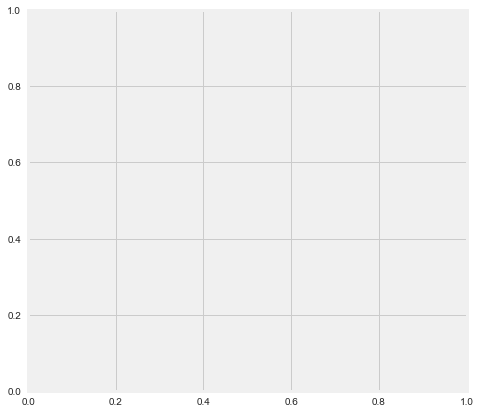

In [27]:
c = ['blue','red']

fig, ax = plt.subplots(figsize=(7,7), facecolor='white')
ax.set_axis_bgcolor('white')
plt.rcParams['axes.facecolor'] = '#f0f0f0'

# 1000 rounds of 70%/30% train/test ROC Curve

mean_tpr_iterative = np.mean(tprs_iterative, axis=0)
mean_tpr_iterative[-1] = 1.0
mean_auc_iterative = auc(mean_fpr_iterative, mean_tpr_iterative)
std_auc_iterative = np.std(aucs_iterative)
plt.plot(mean_fpr_iterative, 
         mean_tpr_iterative, 
         color='grey',
         label=r'Derivation LOO-CV AUC = %0.2f $\pm$ %0.2f' % (mean_auc_iterative, 
                                                               std_auc_iterative),
         lw=3, alpha=.7)
std_tpr_iterative = np.std(tprs_iterative, axis=0)
tprs_iterative_upper = np.minimum(mean_tpr_iterative + std_tpr_iterative, 1)
tprs_iterative_lower = np.maximum(mean_tpr_iterative - std_tpr_iterative, 0)
plt.fill_between(mean_fpr_iterative, 
                 tprs_iterative_lower, 
                 tprs_iterative_upper, 
                 color='lightgrey', 
                 alpha=.2,
                 label=r'$\pm$ 1 std. dev.')
xlim([-0.05, 1.05])
ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

# LOPO-CV ROC Curve

fpr, tpr, thresholds = metrics.roc_curve(list(X_g1g4_train['positive']),
                                         list(X_g1g4_train['score']), pos_label=1)    
ci = pathogen_functions.get_CI([int(i) for i in list(X_g1g4_train['positive'])], 
                               list(X_g1g4_train['score']), 1000)
plt.plot(fpr, tpr, 
         color='blue',
         lw=3, 
         alpha=.8, 
         label = 'Derivation LOPO-CV AUC = %0.2f (%0.2f - %0.2f)' % (metrics.roc_auc_score(
             list(X_g1g4_train['positive']),list(X_g1g4_train['score'])),ci[0],ci[1]))

# Test set ROC Curve

fpr, tpr, thresholds = metrics.roc_curve(list(X_g1g4_test['positive']), 
                                         list(X_g1g4_test['score']), pos_label=1)    
ci = pathogen_functions.get_CI([int(i) for i in list(X_g1g4_test['positive'])], 
                               list(X_g1g4_test['score']), 1000)
plt.plot(fpr, tpr, 
         color='green',
         lw=3, 
         alpha=.8, 
         label = 'Validation AUC = %0.2f (%0.2f - %.2f)' % (metrics.roc_auc_score(
             list(X_g1g4_test['positive']),list(X_g1g4_test['score'])),ci[0],ci[1]))

# visual aspects of the plot
ax.spines['bottom'].set_color('0')
ax.spines['top'].set_color('0')
ax.spines['right'].set_color('0')
ax.spines['left'].set_color('0')
l = plt.legend(bbox_to_anchor=(.85, -.3),loc=4)
l.get_frame().set_facecolor('white')
l.get_frame().set_edgecolor('white')

plt.savefig('./output/' + output_directory + '/Figure2C.pdf', transparent = True,bbox_inches='tight')
plt.show()


# Return stats on the content of the Group 1 + Group 4 training set
print("\nNumber of \'Pathogens\' in Training Set: " + 
      str(Counter(list(X_combo['positive']))[True]))
print("Number of \'Commensals\' in Training Set: " + 
      str(Counter(list(X_combo['positive']))[False]))
print("Percentage of microbes used for training that are \'Pathogens\': " + 
      str(Counter(list(X_combo['positive']))[True]/X_combo.shape[0]))

print("\nNumber of \'Pathogens\' in Test Set: " + 
      str(Counter(list(X_g1g4_test['positive']))[True]))
print("Number of \'Commensals\'in Test Set: " + 
      str(Counter(list(X_g1g4_test['positive']))[False]))
print("Percentage of microbes used for TEST that are \'Pathogens\': " + 
      str(Counter(list(X_combo['positive']))[True]/X_combo.shape[0]))


#### Save microbe score results in .csv file for use in R script

In [28]:
# Compute MAX PATIENT SCORES for groups 2 and 3...
# this will be used as input to the R script for microbial arm of the combo score

for i in set(X_g1g4_test['patient']):
    patient_max_scores[i] = max(X_g1g4_test[X_g1g4_test['patient'] == i]['score'])

for i in set(X_g2['patient']):
    patient_max_scores[i] = max(X_g2[X_g2['patient'] == i]['score'])
    
for i in set(X_g3['patient']):
    patient_max_scores[i] = max(X_g3[X_g3['patient'] == i]['score'])
    
df = pd.DataFrame.from_dict(patient_max_scores, orient='index')
df.index = [i.split('.')[0] for i in df.index]

grp = []
for i in df.index:
    grp.append(int(metadata[metadata['RNAfilename']==i]['effective_group']))

df['color'] = grp

#write the scores to .csv file so they can be read as "microbe scores" into the R script
df.to_csv('./output/' + output_directory + '/patient_microbe_scores.csv')  

# write microbe predictions to .csv file 
patient_by_microbe_predicted_g1g4_test.to_csv('./output/' + 
                                              output_directory + 
                                              "/LRpred_G1G4_test.csv")
patient_by_microbe_predicted_g2.to_csv('./output/' + 
                                       output_directory + 
                                       '/LRpred_G2.csv')
patient_by_microbe_predicted_g3.to_csv('./output/' + 
                                       output_directory + 
                                       '/LRpred_G3.csv')

KeyError: 'score'

### Generate Supplemental Tables of Microbe Data (ie Table S3B)


In [41]:
X_withscores = X_g2 #pd.concat([X_g1g4_train,X_g1g4_test,X_g2,X_g3])
A = X_withscores[X_withscores['score'] > PROBABILITY_THRESHOLD].sort_values(by='patient')
A[[i.split(".")[0] in list(metadata[metadata['effective_group'] == 1]['RNAfilename']) for 
   i in list(A['patient'])]].to_csv('./output/' + 
                                        output_directory + 
                                        '/group1POS.microbestats.csv')
A[[i.split(".")[0] in list(metadata[metadata['effective_group'] == 2]['RNAfilename']) for 
   i in list(A['patient'])]].to_csv('./output/' + 
                                    output_directory + 
                                    '/group2POS.microbestats.csv')
A[[i.split(".")[0] in list(metadata[metadata['effective_group'] == 3]['RNAfilename']) for 
   i in list(A['patient'])]].to_csv('./output/' + 
                                    output_directory + 
                                    '/group3POS.microbestats.csv')
A[[i.split(".")[0] in list(metadata[metadata['effective_group'] == 4]['RNAfilename']) for 
   i in list(A['patient'])]].to_csv('./output/' + 
                                    output_directory + 
                                    '/group4POS.microbestats.csv')

KeyError: 'score'

In [29]:
X_withscores = X #X_g2 #pd.concat([X_g1g4_train,X_g1g4_test,X_g2,X_g3])

# add the clinical values    
X_withscores['Clin+'] = ['Y' if i else 'N' for i in list(X_withscores['positive'])]

# add one to ranks to make them more standard notation
X_withscores['ranks'] = X_withscores['ranks'] + 1

# append LRM predictions 
X_withscores['LRM+'] = ['Y' if i > PROBABILITY_THRESHOLD else 'N' for 
                        i in list(X_withscores['score'])]


# append the RBM predictions
all_RBM = pd.concat([rbm_g1,rbm_g2,rbm_g3,rbm_g4])
rbm_pos = []
for i in X_withscores.index:
    p = X_withscores.loc[i]['patient']
    m = X_withscores.loc[i]['microbe']#_genus']
    a = list(all_RBM[all_RBM['patient']==p]['microbe'])#_genus'])
    if m in a:
        rbm_pos.append('Y')
    else:
        rbm_pos.append('N')
X_withscores['RBM+'] = rbm_pos    

X_withscores['Study ID'] = [i.split('-')[0] for i in list(X_withscores['patient'])]
X_withscores['keep'] = [list(X_withscores.loc[i][['Clin+','LRM+','RBM+']]).count('Y') > 0 for 
                        i in X_withscores.index]

lrti_cat_dict = {1:'LRTI+C/+M', 2:'LRTI+C',3:'unk-LRTI',4:'no-LRTI',5:'water'}
X_withscores['LRTI Category'] = [lrti_cat_dict[i] for i in list(X_withscores['groupID'])]        
X_withscores.sort_values(by='Study ID',inplace=True)
X_withscores.head(n=10)

TypeError: invalid type comparison

In [33]:
# This finalizes the output for TableS3B (Publication version)

table3B = X_withscores[X_withscores['keep']][['Study ID',
                                              'LRTI Category', 
                                              'microbe', 
                                              'Clin+', 
                                              'LRM+', 
                                              'RBM+',
                                              'RNAvalue',
                                              'DNAvalue',
                                              'ranks',
                                              'pathogenic_red',
                                              'pathogenic_green',
                                              'score',
                                              'nt_Z_rna',
                                              'nt_Z_dna']]

adding_to_df = []
for i in set(list(X_withscores['Study ID'])):
    if i not in list(table3B['Study ID']):
        adding_to_df.append(
            [i, str(list(X_withscores[X_withscores['Study ID']==i]['LRTI Category'])[0])] + 
            [None for i in range(12)])
        
df2 = pd.DataFrame(adding_to_df, columns=table3B.columns)
x = table3B.append(df2)
table3B = x

table3B.columns = ['Study ID',
                   'LRTI Category', 
                   'Microbe', 
                   'Clin+', 
                   'LRM+', 
                   'RBM+',
                   'log10( RNA-seq genus rpM )',
                   'log10( DNA-seq genus rpM )',
                   'Rank','Respiratory Pathogen?',
                   'Virus?',
                   'LRM Score',
                   'RNA Z-score',
                   'DNA Z-score']

table3B.sort_values(by=['Study ID','Rank'], inplace=True)
table3B_1 = table3B[table3B['LRTI Category'] == 'LRTI+C/+M']
table3B_2 = table3B[table3B['LRTI Category'] == 'LRTI+C']
table3B_3 = table3B[table3B['LRTI Category'] == 'unk-LRTI']
table3B_4 = table3B[table3B['LRTI Category'] == 'no-LRTI']

t3 = pd.concat([table3B_1,table3B_2,table3B_4,table3B_3])
t3.tail(n=10)
t3.to_csv('./output/' + output_directory + '/TableS3Bfinal.csv',index=False)

KeyError: 'keep'

## Preliminary version of Figure 3 - combining all methods of pathogen prediction

This is used to rapidly assess the microbial predictions, however it DID NOT end up in the manuscript due to the difficulty protraying the take-home message.

                                  chrf_rna_0050_s50.report.csv  \
Corynebacterium urealyticum                                  0   
Corynebacterium aurimucosum                                  0   
Streptococcus pneumoniae                                     0   
Moraxella osloensis                                          0   
Corynebacterium maris                                        0   
Salmonella enterica                                          0   
Methylobacterium aquaticum                                   0   
Streptococcus mitis                                          0   
Sphingomonas koreensis                                       0   
Staphylococcus aureus                                        0   
Staphylococcus saprophyticus                                 0   
Staphylococcus pasteuri                                      0   
Corynebacterium ureicelerivorans                             0   
Enterobacter hormaechei                                      0   
Massilia p

True
30
chrf_rna_0004_s4.report.csv
True
31
chrf_rna_0040_s40.report.csv
True
32
chrf_rna_0015_s15.report.csv
True
33
chrf_rna_0015_s15.report.csv
True
34
chrf_rna_0015_s15.report.csv
True
35
chrf_rna_0016_s16.report.csv
True
36
chrf_rna_0007_s7.report.csv
True
37
chrf_rna_0008_s8.report.csv
True
38
chrf_rna_0009_s9.report.csv
True
39
chrf_rna_0018_s18.report.csv
True
40
chrf_rna_0019_s19.report.csv
True
41
chrf_rna_0019_s19.report.csv
True
42
chrf_rna_0020_s20.report.csv
True
43
chrf_rna_0020_s20.report.csv
True
44
chrf_rna_0021_s21.report.csv
True
45
chrf_rna_0021_s21.report.csv
True
46
chrf_rna_0031_s31.report.csv
True
47
chrf_rna_0031_s31.report.csv
True
48
chrf_rna_0032_s32.report.csv
True
49
chrf_rna_0043_s43.report.csv
True
50
chrf_rna_0043_s43.report.csv
True
51
chrf_rna_0044_s44.report.csv
True
52
chrf_rna_0053_s53.report.csv
True
53
chrf_rna_0056_s56.report.csv
True
54
chrf_rna_0065_s65.report.csv
True
55
chrf_rna_0065_s65.report.csv
True
56
chrf_rna_0066_s66.report.csv
True


9
chrf_rna_0026_s26.report.csv
True
4
10
chrf_rna_0002_s2.report.csv
True
4
11
chrf_rna_0051_s51.report.csv
True
4
12
chrf_rna_0061_s61.report.csv
True
4
13
chrf_rna_0073_s73.report.csv
True
4
14
chrf_rna_0062_s62.report.csv
True
4
15
chrf_rna_0062_s62.report.csv
True
16
chrf_rna_0086_s86.report.csv
True
4
17
chrf_rna_0085_s85.report.csv
True
18
chrf_rna_0025_s25.report.csv
True
19
chrf_rna_0014_s14.report.csv
True
20
chrf_rna_0074_s74.report.csv
True
21
chrf_rna_0027_s27.report.csv
True
4
22
chrf_rna_0038_s38.report.csv
True
23
chrf_rna_0050_s50.report.csv
True
24
chrf_rna_0050_s50.report.csv
True
25
chrf_rna_0063_s63.report.csv
True
4
26
chrf_rna_0028_s28.report.csv
True
27
chrf_rna_0028_s28.report.csv
True
28
chrf_rna_0039_s39.report.csv
True
29
chrf_rna_0004_s4.report.csv
True
30
chrf_rna_0004_s4.report.csv
True
31
chrf_rna_0040_s40.report.csv
True
32
chrf_rna_0015_s15.report.csv
True
33
chrf_rna_0015_s15.report.csv
True
34
chrf_rna_0015_s15.report.csv
True
35
chrf_rna_0016_s16.rep

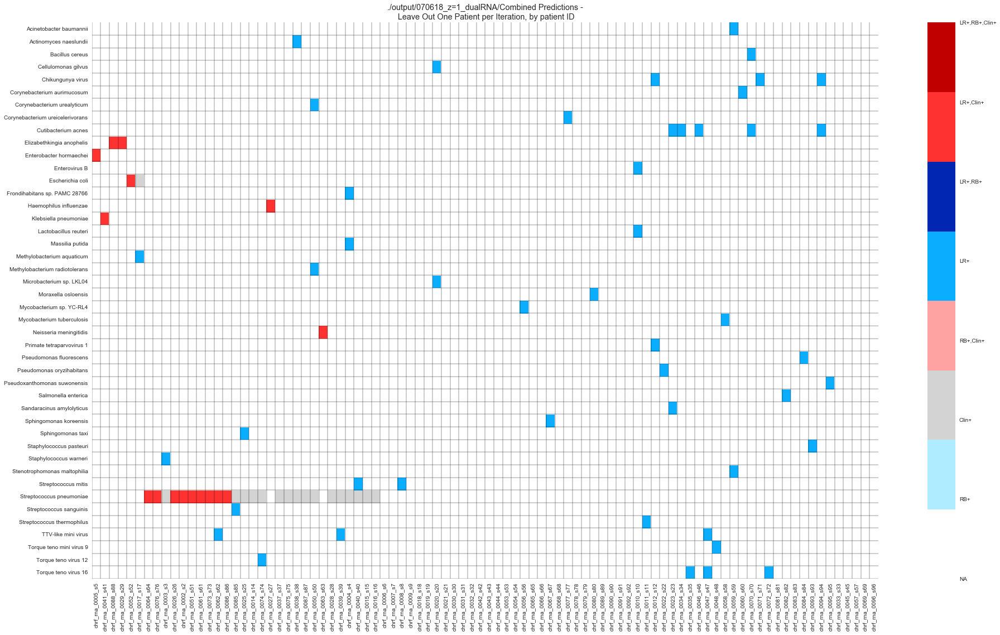

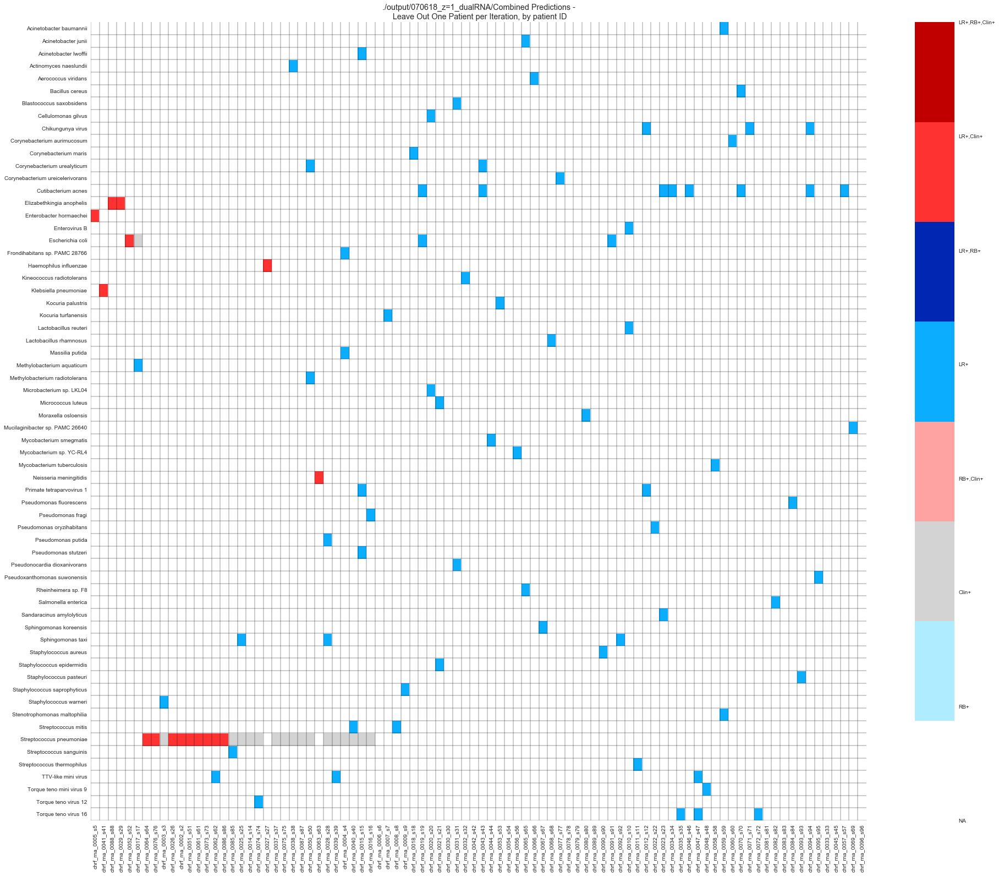

In [23]:

from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import ListedColormap

gcombos = []

# TRYING TO CREATE COMBO HEATMAP THAT WILL TAKE IN THE INPUTS FROM ALL G1, G4, G2/3 and output the color-coded heatmap
# NOVEMBER 27

def create_prediction_heatmap_combo_overlap(input_rbm_data, input_lr_data, original_matrix, filename, groupID, true_classification, output_directory, metadata, training_sample_names, output_filename, print_output = False, collapse=True, diversity = None, DIVERSITY_THRESHOLD=1):

    input_rbm_data.to_csv('./output/' + output_directory + '/TableS6A.csv')
    input_lr_data.to_csv('./output/' + output_directory + '/TableS6B.csv')

    # new colors - using shade to indicate group, color to indicate clin +
    # WHITE, RB only (light blue), clin only (light grey), RB + Clin (light red), LR only (med blue), LR + RM (dark blue), LR + Clin (med red), LR + RB + Clin (dark red)
    colors = ['white','#AFECFF','lightgrey','#FFA2A2','#0BAEFF','#0026B2','#FF3232','#C00000'] # trying to make the above colors more distinct

    CustomCmap = matplotlib.colors.ListedColormap(colors)
    yay_v = 0

    d = pd.DataFrame(0, index=np.arange(len(set(input_lr_data['microbe']))), columns=[i.split('.')[0].lower()+'.report.csv' for i in list(set(original_matrix['patient']))])
    d.index = set(input_lr_data['microbe'])
    print(d)

    #loop through every patient and create a new column for each patient
    #add all group 1s
    g1s_train = []
    g1s_test = []
    for i in true_classification.index:
        if 'RNA' in i:
            if true_classification.loc[i]['effective_group'] == 1:
                if(i.lower()+'.report.csv' in training_sample_names):
                    g1s_train.append(i.lower()+'.report.csv')
                else:
                    g1s_test.append(i.lower()+'.report.csv')
                #g1s.append(i+'.report.csv')
                if i.lower() + '.report.csv' not in list(d.columns):   #if patient not in heatmap, add it.
                    d[i.lower() + '.report.csv'] = [0 for j in range(len(d.index))]
    #add all group 4s
    g4s_train = []
    g4s_test = []
    for i in true_classification.index:
        if 'RNA' in i:
            if true_classification.loc[i]['effective_group'] == 4:
                if(i.lower()+'.report.csv' in training_sample_names):
                    g4s_train.append(i.lower()+'.report.csv')
                else:
                    g4s_test.append(i.lower()+'.report.csv')
                #g4s.append(i+'.report.csv')
                if i.lower() + '.report.csv' not in list(d.columns):   #if patient not in heatmap, add it.
                    d[i.lower() + '.report.csv'] = [0 for j in range(len(d.index))]
    #add all group 2s
    g2s = []
    for i in true_classification.index:
        if 'RNA' in i:
            if true_classification.loc[i]['effective_group'] == 2:
                g2s.append(i.lower()+'.report.csv')
                if i.lower() + '.report.csv' not in list(d.columns):   #if patient not in heatmap, add it.
                    d[i.lower() + '.report.csv'] = [0 for j in range(len(d.index))]
    #add all group 3s
    g3s = []
    for i in true_classification.index:
        if 'RNA' in i:
            if true_classification.loc[i]['effective_group'] == 3:
                g3s.append(i.lower()+'.report.csv')
                if i.lower() + '.report.csv' not in list(d.columns):   #if patient not in heatmap, add it.
                    d[i.lower() + '.report.csv'] = [0 for j in range(len(d.index))]

    #add all group 5s
    g5s = []
    for i in true_classification.index:
        if 'RNA' in i:
            if true_classification.loc[i]['effective_group'] == 5:
                g5s.append(i.lower()+'.report.csv')
                if i.lower() + '.report.csv' not in list(d.columns):   #if patient not in heatmap, add it.
                    print('HIIIIII')
                    d[i.lower() + '.report.csv'] = [0 for j in range(len(d.index))]

    #print(metadata.head())
    #print(input_rbm_data['patient'].head())
    #print(metadata[metadata['sample_name_RNA'] == input_lr_data.iloc[i]['patient'].split('.')[0].upper()]['organism'].iloc[0])
    
    
    
    '''
    # ADD VALUES FOR RB method
    for i in input_rbm_data.index:
        print(input_rbm_data.iloc[i]['patient'].split('.')[0] + '.report.csv')
        print(input_rbm_data.iloc[i]['patient'].split('.')[0] + '.report.csv' in list(diversity.index))
        print(diversity.index)
        print(diversity.head())
        print(diversity.loc[input_rbm_data.iloc[i]['patient'].split('.')[0] + '.report.csv'])
        if diversity.loc[input_rbm_data.iloc[i]['patient'].split('.')[0] + '.report.csv']['input'] > DIVERSITY_THRESHOLD:
            d[input_rbm_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_rbm_data.iloc[i]['microbe']] = 1
            orgs = metadata[metadata['sample_name_RNA'] == input_rbm_data.iloc[i]['patient'].split('.')[0].upper()]['organism'].iloc[0]
            #print(orgs)
            if(type(orgs) == type('string')):
                if input_rbm_data.iloc[i]['microbe'] in orgs.split(','):
                    yay_v += 1
                    d[input_rbm_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_rbm_data.iloc[i]['microbe']] = d[input_rbm_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_rbm_data.iloc[i]['microbe']] + 2

    '''
    
        # ADD VALUES FOR LR method
    for i in input_lr_data.index:
        print(i)
        print(input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv')
        print(input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv' in list(diversity.index))
        
        if diversity.loc[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv']['input'] > DIVERSITY_THRESHOLD:
        
            try:
                #print(d.columns)
                #print(input_lr_data.iloc[i]['patient'])
                #print(input_lr_data.iloc[i]['microbe'])
                d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_lr_data.iloc[i]['microbe']] = d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_lr_data.iloc[i]['microbe']] + 4   #try to just add to existing values
            except:
                #NEED TO ADD THE ROW
                new_index = [ v for v in d.index] + [input_lr_data.iloc[i]['microbe']]
                d.loc[len(d)]=[0 for i in range(len(d.columns))]
                d.index = new_index
                d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_lr_data.iloc[i]['microbe']] = 4   # if the value has not existed before, add to the dataframe

            orgs = metadata[metadata['sample_name_RNA'] == input_lr_data.iloc[i]['patient'].split('.')[0].upper()]['organism'].iloc[0]   # loop through all the organisms
            if(type(orgs) == type('string')):
                if input_lr_data.iloc[i]['microbe'] in orgs.split(','):
                    yay_v += 1
                    print(d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_lr_data.iloc[i]['microbe']])
                    if d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_lr_data.iloc[i]['microbe']] not in [3,7]:  # if the organism is confirmed, but has not previously been clinically confirmed then...add clinical to it
                        d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_lr_data.iloc[i]['microbe']] = d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][input_lr_data.iloc[i]['microbe']] + 2

    # LOOP THROUGH AND ADD CLINICAL GENERA
    #print("???")
    #print(len(set(input_lr_data.index)))
    #print(metadata.shape)

    for i in metadata.index:#input_lr_data.index:
        index = metadata.loc[i]['sample_name_RNA'].lower()+'.report.csv'
        #print(index)
        
        #print(metadata.loc[i]['organism'])
        #print()
        orgs = metadata.loc[i]['organism']#[metadata['sample_name_RNA'] == input_lr_data.iloc[i]['patient'].split('.')[0].upper()]['organism'].iloc[0]
        if(type(orgs) == type('string')):
            #print(input_lr_data.iloc[i]['patient'])
            #print(orgs)
            '''
            for o in orgs.split(','):
                #list_of_species = list(set(input_lr_data.loc[input_lr_data['microbe_genus']==o]['microbe']).union(set(input_lr_data.loc[input_lr_data['microbe_genus']==o]['microbe'])))
                list_of_species = list(set(input_lr_data.loc[input_lr_data['microbe']==o]['microbe']).union(set(input_lr_data.loc[input_lr_data['microbe']==o]['microbe'])))
                print(list_of_species)
                a_species_was_found = False
                for s in list_of_species:
                    if not a_species_was_found:
                        try:
                            if d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][s] > 0:
                                a_species_was_found = True
                        except:
                            continue

                #print(a_species_was_found)

                if not a_species_was_found:
                    if sum([int(o == v ) for v in  d.index]) > 0:
                        print(o)
                        print(i)
                        print(input_lr_data.head())
                        d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][o] = 2
                    else:
                        new_index = [ v for v in d.index] + [o]
                        d.loc[len(d)]=[0 for i in range(len(d.columns))]

                        d.index = new_index
                        d[input_lr_data.iloc[i]['patient'].split('.')[0] + '.report.csv'][o] = 2

            '''
            for o in orgs.split(','):
                #print(o)
                try:
                    #print('indise Try')
                    #print(d[index][o])
                    if d[index][o] > 0:
                        a_species_was_found = True
                    else:
                        d[index][o] = 2
                except:
                    print('in except')
                    new_index = [ v for v in d.index] + [o]
                    d.loc[len(d)]=[0 for i in range(len(d.columns))]
                    d.index = new_index
                    d[index][o] = 2




    #gcombos = g1s_train + g1s_test + g4s_train +  g4s_test + g2s + g3s + g5s
    #print("GCOMBOS")
    #print(gcombos)
    gcombos = [i.split('/')[-1].split('.')[0] + '.report.csv' for i in ordered_list_of_files]
    
    d = d[gcombos] # this sorts the columns in order of [group1] [group4]

    #reset names to remove .report.csv notation
    new_col_names = []
    for i in d.columns:
        new_col_names.append(i.split('.')[0])
    d.columns = new_col_names




    # Apply some collapsing for the indices
    if(collapse):
        strep_viridans_group = ['Streptococcus pseudopneumoniae ( 257758 )','Streptococcus sp. VT 162 ( 1419814 )',
                                'Streptococcus salivarius ( 1304 )','Streptococcus mitis ( 28037 )',
                                'Streptococcus pseudopneumoniae ( 257758 )','Streptococcus anginosus ( 1328 )']
        strep_preprocessed_names = []
        #print(d.index)
        for i in d.index:
            if(i in strep_viridans_group):
                strep_preprocessed_names.append('Streptococci viridans Group ( XXX )')
            elif('coronavirus' in i):
                strep_preprocessed_names.append('Human coronavirus species ( XXX )')
            else:
                strep_preprocessed_names.append(i)  # strep pneumo and strep genera (clinical) will be merged

        d.index = strep_preprocessed_names
        first_values = [' '.join(i.split(' ')[0:-4]) if i.count(' ') > 3 else ' '.join(i.split(' ')[0:-3]) for i in d.index]
        d.index = first_values


        for j in d.columns:
            for k in set(first_values):
                #print(k)
                l = list(d[j][d.index==k])
                #print(l)
                if 2 in l and 3 in l:
                    # this is bad - it will collapse incorrectly and appear the BM and LR matched (score = 5),
                    # when in reality it was a collapse of RB+Clin (3) and Clin+ (3) again - need to modify the cases post-hoc.
                    #print([3] + [0 for i in range(len(l)-1)])
                    d[j][d.index==k] = [3] + [0 for i in range(len(l)-1)]





        d = d.groupby(d.index).sum()

        post_mod_index = []  # MODIFICATIONS TO UPDATE NAME OF STREP AND STAPH TO BE CLEAR
        for i in d.index:
            if(i == 'Streptococcus'):
                post_mod_index.append('Streptococcus pneumoniae')
            elif(i == 'Staphylococcus'):
                post_mod_index.append('Staphylococcus aureus')
            elif(i == 'Human respiratory syncytial'):
                post_mod_index.append('Human RSV')
            else:
                post_mod_index.append(i)

        d.index = post_mod_index




    # sort the indices by alphabetical order
    new_d = d.sort_index(axis=0)
    d = new_d
    d = d[d.sum(axis=1) > 0]
    
    #new_columns = ['-'.join(c.split('-')[0:2]) for c in d.columns]
    #new_cols_temp = ['TA-' + str(c.split('-')[1]) for c in d.columns]  #convert names to TA-XXX notation
    #new_columns = [i[0:6] for i in new_cols_temp]  #get rid of TRNA from the one sample that has weird naming convention
    #print(new_columns)
    #d.columns = new_columns




    fig_height = (d.shape[0]/4.8)*2
    #fig_width = d.shape[1]/4.8
    fig_width = (d.shape[1]/6.4)*2

    #d.to_csv('LRcombo.csv')

    if print_output:
        print(d.head())

    #colors = ['white','#4AA2B6','lightgrey','#04819E','#69DE56','#F93846','#1DD300','#F90012']
    #ordered_colors = ['white','lightgrey','deepskyblue','blue','yellow','gold','orange','red']

    cmap = LinearSegmentedColormap.from_list('Custom', colors, len(colors))


    plt.figure(figsize=(fig_width,fig_height))
    #ax = sns.heatmap(d,cmap=CustomCmap,vmin=0,vmax=7,cbar=False)
    ax = sns.heatmap(d,cmap=cmap,vmin=0,vmax=7)#,row_colors='red')#,cbar=False)
    ax.hlines([i for i in range(len(d.index))], *ax.get_xlim(),lw=.4)
    ax.vlines([i for i in range(len(d.columns))], *ax.get_ylim(),lw=.4)
    ax.tick_params(labelsize=10)
    colorbar = ax.collections[0].colorbar
    colorbar.set_ticks([i for i in range(len(colors))])
    colorbar.set_ticks([0,2,1,3,4,6,5,7])
    colorbar.set_ticklabels(['NA','Clin+','RB+','RB+,Clin+','LR+','LR+,Clin+','LR+,RB+','LR+,RB+,Clin+'])
    #colorbar.set_ticklabels(['NA','RB+','Clin+','RB+,Clin+','LR+','LR+,RB+','LR+,Clin+','LR+,RB+,Clin+'])

    plt.title( filename + ", by patient ID")
    plt.savefig('./output/' + output_directory + '/' + output_filename , bbox_inches='tight')

    return d



lr_results = pd.concat([ 
                        patient_by_microbe_predicted_g2]) #,patient_by_microbe_predicted_g4_test, 
lr_results.reset_index(inplace=True)
c = pd.concat([rbm_g1,rbm_g4,rbm_g2,rbm_g3])
c.reset_index(inplace=True)

X_full = pd.concat([X_g1,X_g4,X_g2,X_g3])

# this representation enables easy viewing of the overlap btwn clinical and predicted results
# unfortunately, the published TableS2 does not highlight this aspect of the data as well, 
# so I am maintaining this graphic here.
#
d = create_prediction_heatmap_combo_overlap(c,lr_results,X_full, 
                                            './output/' +  output_directory + 
                                              '/Combined Predictions -\n Leave Out One Patient per Iteration',
                                               [1,4,2,3],
                                                               true_classification, 
                                                               output_directory, 
                                                               metadata, 
                                                               training_sample_names,
                                                               'FigureS3_TrainTest.pdf', 
                                                               print_output = False, 
                                                               collapse=False,
                                                               diversity = log(rna_input+1),
                                                                DIVERSITY_THRESHOLD = 1.4)# pd.concat([pd.Series(RNA_diversity),pd.Series(DNA_diversity)], axis=1).max(axis=1),
                                                               #DIVERSITY_THRESHOLD=.6)
print("DONE WITH THE FIRST HEATMAP")

d = create_prediction_heatmap_combo_overlap(c,lr_results,X_full, 
                                            './output/' +  output_directory + 
                                              '/Combined Predictions -\n Leave Out One Patient per Iteration',
                                               [1,4,2,3],
                                                               true_classification, 
                                                               output_directory, 
                                                               metadata, 
                                                               training_sample_names,
                                                               'FigureS3_TrainTest_nodivthresh.pdf', 
                                                               print_output = False, 
                                                               collapse=False,
                                            diversity = log(rna_input+1),
                                            DIVERSITY_THRESHOLD = 0
                                           #diversity = pd.concat([pd.Series(RNA_diversity),pd.Series(DNA_diversity)], axis=1).mean(axis=1),
                                                               )

In [52]:
#lr_results
X_full
#patient_by_microbe_predicted_g2
X
#predicted[:,1]
X[X.patient == "chrf_rna_0063_s63.csv"]
set(lr_results['microbe'])
print(lr_results)
print(c)

    index                       microbe  microbe_genus                patient
0       0         Klebsiella pneumoniae            570  chrf_rna_0041_s41.csv
1       1     Elizabethkingia anophelis         308865  chrf_rna_0088_s88.csv
2       2     Elizabethkingia anophelis         308865  chrf_rna_0029_s29.csv
3       3              Escherichia coli            561  chrf_rna_0052_s52.csv
4       4         Klebsiella pneumoniae            570  chrf_rna_0052_s52.csv
5       5      Streptococcus pneumoniae           1301  chrf_rna_0064_s64.csv
6       6      Streptococcus pneumoniae           1301  chrf_rna_0076_s76.csv
7       7      Streptococcus pneumoniae           1301   chrf_rna_0003_s3.csv
8       8      Streptococcus pneumoniae           1301  chrf_rna_0026_s26.csv
9       9      Streptococcus pneumoniae           1301   chrf_rna_0002_s2.csv
10     10      Streptococcus pneumoniae           1301  chrf_rna_0051_s51.csv
11     11      Streptococcus pneumoniae           1301  chrf_rna

[]
0.6803447113113357


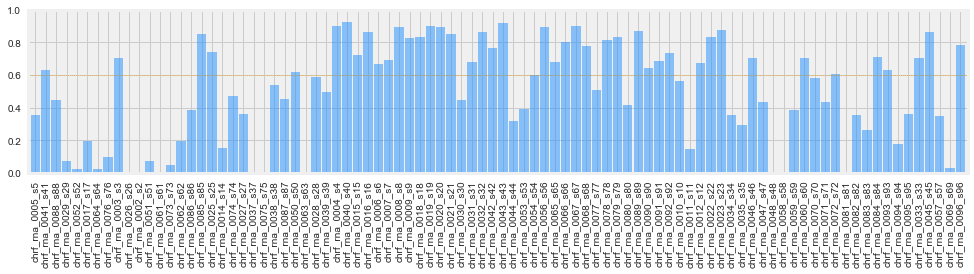

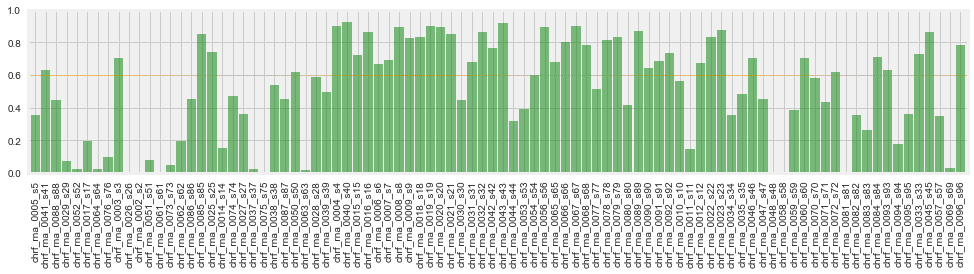

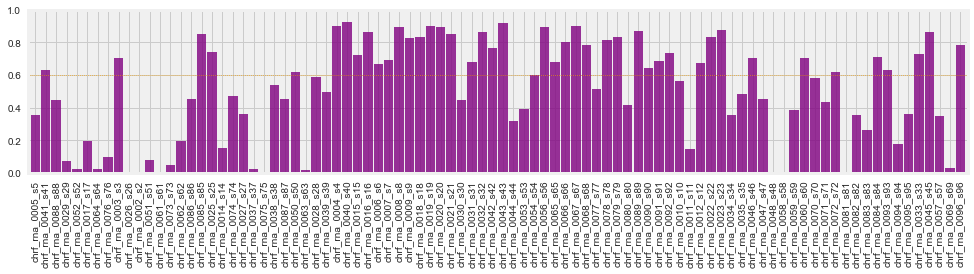

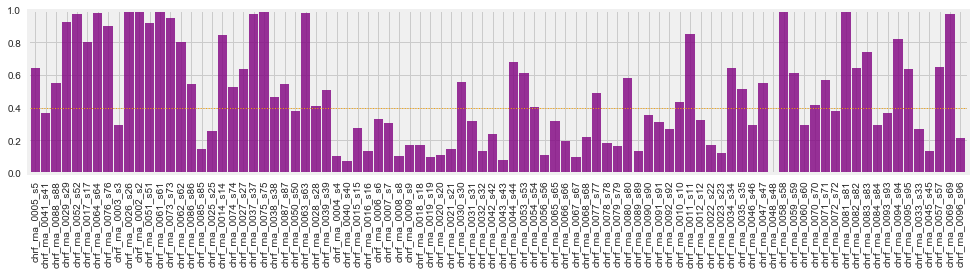

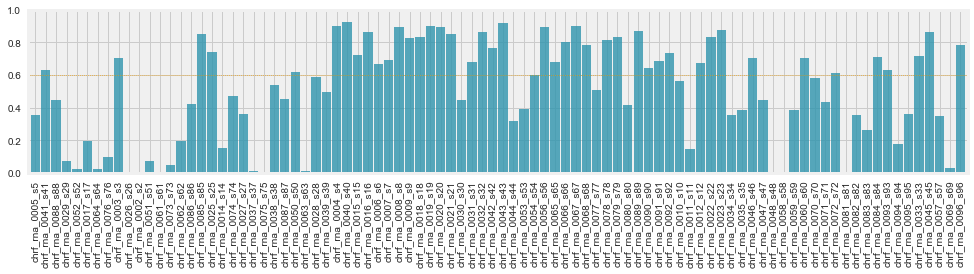

In [28]:
print(gcombos)

plt.figure(figsize=(15,3))
rna_div_plot = pd.Series(RNA_diversity).loc[list(d.columns)].plot(kind='bar', color='dodgerblue', width=.9, alpha = .5,ylim=[0,1])
#dna_div_plot = pd.Series(DNA_diversity).loc[list(d.columns)].plot(kind='bar', color='green', width=.9, alpha = .5)
plt.axhline(y=.6, linestyle=':', lw=.75, color='orange')
plt.savefig('./output/' + output_directory + '/rna_div_barplot.pdf' , bbox_inches='tight')

plt.figure(figsize=(15,3))
#rna_div_plot = pd.Series(RNA_diversity).loc[list(d.columns)].plot(kind='bar', color='dodgerblue', width=.9, alpha = .5)
dna_div_plot = pd.Series(DNA_diversity).loc[list(d.columns)].plot(kind='bar', color='green', width=.9, alpha = .5,ylim=[0,1])
plt.axhline(y=.6, linestyle=':', lw=.75, color='orange')
plt.savefig('./output/' + output_directory + '/dna_div_barplot.pdf' , bbox_inches='tight')


plt.figure(figsize=(15,3))
pd.concat([pd.Series(RNA_diversity),pd.Series(DNA_diversity)], axis=1).max(axis=1).loc[list(d.columns)].plot(kind='bar', color='purple', width=.9, alpha = .8,ylim=[0,1])
plt.axhline(y=.6, linestyle=':', lw=.75, color='orange')
plt.savefig('./output/' + output_directory + '/max_div_barplot.pdf' , bbox_inches='tight')

plt.figure(figsize=(15,3))
(1-pd.concat([pd.Series(RNA_diversity),pd.Series(DNA_diversity)], axis=1).max(axis=1)).loc[list(d.columns)].plot(kind='bar', color='purple', width=.9, alpha = .8,ylim=[0,1])
plt.axhline(y=.4, linestyle=':', lw=1, color='orange')
plt.savefig('./output/' + output_directory + '/max_div_barplot.pdf' , bbox_inches='tight')


plt.figure(figsize=(15,3))
pd.concat([pd.Series(RNA_diversity),pd.Series(DNA_diversity)], axis=1).mean(axis=1).loc[list(d.columns)].plot(kind='bar', color='#2e94ad', width=.9, alpha = .8,ylim=[0,1])
plt.axhline(y=.6, linestyle=':', lw=.75, color='orange')
plt.savefig('./output/' + output_directory + '/mean_div_barplot.pdf' , bbox_inches='tight')

print(pd.concat([pd.Series(RNA_diversity),pd.Series(DNA_diversity)], axis=1).mean(axis=1).loc[list(d.columns)].loc['chrf_rna_0065_s65'])

In [24]:
#Evaluate how many individuals had microbes identified by each method as compared to the known total number of group 1 patients.
print("Number of patients in Group 1 " + str(len(set(X_g1['patient']))))

print("\nNumber of patients in Group 1 w/ at least 1 pathogens identified by RBM " + 
      str(len(set(rbm_g1['patient']))))
print("Number of microbes identified by RBM in G1: "+ 
      str(len(rbm_g1['microbe'])))

print("\nNumber of patients in Group 1 w/ at least 1 pathogens identified by LR Model " + 
      str(len( set(X_g1['patient']).intersection(
          set(pd.concat([patient_by_microbe_predicted_combo,
                         patient_by_microbe_predicted_g1g4_test])['patient'])))))
print("Number of microbes identified by LR in both G1 and G4: "+ 
      str(len(pd.concat([patient_by_microbe_predicted_combo,
                         patient_by_microbe_predicted_g1g4_test])['microbe'])))

print("\nPatient IDs without a pathogen identified by RBM " + 
      str(set(X_g1['patient']) - set(rbm_g1['patient'])))
print("Patient IDs without a pathogen identified by LR Model " + 
      str(set(X_g1['patient']) - set(pd.concat([patient_by_microbe_predicted_combo,
                                                patient_by_microbe_predicted_g1g4_test])['patient'])))

Number of patients in Group 1 33

Number of patients in Group 1 w/ at least 1 pathogens identified by RBM 23
Number of microbes identified by RBM in G1: 23


NameError: name 'patient_by_microbe_predicted_combo' is not defined

In [26]:
#Evaluate how many individuals had microbes identified by each method as compared to the known total number of group 1 patients.
print("Number of patients in Group 2 " + str(len(set(X_g2['patient']))))
print("\nNumber of patients in Group 2 w/ at least 1 pathogens identified by RBM " + 
      str(len(set(rbm_g2['patient']))))
print("Number of microbes identified by RBM: " + str(len(rbm_g2['patient'])))

print("\nNumber of patients in Group 2 w/ at least 1 pathogens identified by LR Model " + 
      str(len( set(X_g2['patient']).intersection(set(patient_by_microbe_predicted_g2['patient'])))))
print("Number of microbes identified by LR: " + str(len(patient_by_microbe_predicted_g2['patient'])))

print("\nPatient IDs without a pathogen identified by RBM:\n" + 
      '\n'.join(list(set(X_g2['patient']) - set(rbm_g2['patient']))))
print("\nPatient IDs without a pathogen identified by LR Model\n" + 
      '\n'.join(list(set(X_g2['patient']) - set(patient_by_microbe_predicted_g2['patient']))))

Number of patients in Group 2 0

Number of patients in Group 2 w/ at least 1 pathogens identified by RBM 0
Number of microbes identified by RBM: 0

Number of patients in Group 2 w/ at least 1 pathogens identified by LR Model 0
Number of microbes identified by LR: 48

Patient IDs without a pathogen identified by RBM:


Patient IDs without a pathogen identified by LR Model



In [29]:
#OUTPUT per-patient microbe predictions to files
rbm_g1.to_csv('./output/' + output_directory + '/rbm_g1.csv')
rbm_g2.to_csv('./output/' + output_directory + '/rbm_g2.csv')
rbm_g3.to_csv('./output/' + output_directory + '/rbm_g3.csv')
rbm_g4.to_csv('./output/' + output_directory + '/rbm_g4.csv')

patient_by_microbe_predicted_combo.to_csv('./output/' + 
                                          output_directory + 
                                          '/patient_by_microbe_predicted_combo.csv')
patient_by_microbe_predicted_g2.to_csv('./output/' + 
                                       output_directory + 
                                       '/patient_by_microbe_predicted_g2.csv')
patient_by_microbe_predicted_g3.to_csv('./output/' + 
                                       output_directory + 
                                       '/patient_by_microbe_predicted_g3.csv')

NameError: name 'patient_by_microbe_predicted_combo' is not defined

In [ ]:
# write the full training and test data matrices to a .csv file so other individuals could replicate the models
X_combo.to_csv("./output/" + output_directory + '/LRTrainingData.csv')
X_g1g4_test.to_csv("./output/" + output_directory + '/LRTestData.csv')

## Addressing Outstanding Qs and making modifications specific to publication

**FIGURE S2: Create a 2-part heatmap where part 1 = clinical only, part 2 = RBM/LRM resutls; divided up by sub-component (LRTI+C/+M Deriviation / LRTI+C/+M Validation / no-LRTI Derivation / no-LRTI Validation / LRTI+C / unk-LRTI)**

In [ ]:
lr_results = pd.concat([patient_by_microbe_predicted_combo, patient_by_microbe_predicted_g1g4_test, patient_by_microbe_predicted_g2,patient_by_microbe_predicted_g3]) 
lr_results.reset_index(inplace=True)
c = pd.concat([rbm_g1,rbm_g4,rbm_g2,rbm_g3])
c.reset_index(inplace=True)

X_full = pd.concat([X_g1,X_g4,X_g2,X_g3])
d = plotting_functions.create_prediction_heatmap_combo_overlap_update2(c,
                                 lr_results,
                                 X_full, 
                                 './output/' + 
                                 output_directory + 
                                 '/Combined Predictions -\n Leave Out One Patient per Iteration',
                                 [1,4,2,3],
                                 true_classification, 
                                 output_directory,
                                 metadata, 
                                 training_sample_names,
                                 'FigureS3_TrainTest.pdf',
                                 print_output = False, collapse=True)

**For comparison, create a scatterplot for the water samples!**

Note, the axes of this scatterplot are from 0 to .8. All other scatterplots (ie Figure S1) are on the axis 0 - 5. This emphasizes the fact that water samples had substantially fewer microbial reads. 

In [ ]:
dna_water = pd.read_csv('data/' + data_directory + '/water_controls/' + 
                        'direct_water_subtraction_DNA.concordant.csv',index_col=0)
rna_water = pd.read_csv('data/' + data_directory + '/water_controls/' + 
                        'direct_water_subtraction_RNA.concordant.csv',index_col=0)

c = ['blue','red']
water_pathogens = [c[int(i.split(' ')[0] in ' '.join(full_respiratory_microbes_list))] for 
                   i in dna_water.index]

plt.figure(figsize=(6, 6))
plt.scatter(np.log10(rna_water['x']+1),  
                           np.log10(dna_water['x']+1),               
            alpha = .6,
            marker='o',
            s=200,
            edgecolor=water_pathogens, 
            facecolor='none', 
            linewidth='1.2' )

plt.xlim((-.05, 0.8))
plt.ylim((-.05, 0.8))

# annotate the scatterplot points with the microbe name
for n in dna_water.index:
    plt.annotate(n.split(' ')[0], (np.log10(rna_water.loc[n]['x']+1)+.02,  
                               np.log10(dna_water.loc[n]['x']+1)+.04),
                                             fontsize=5, color='grey',rotation=30) 
    
plt.xlabel("log(rpm RNA)")
plt.ylabel("log(rpm DNA)")
plt.title("Scaled rpm Values for concordant\n microbes in water samples")
plt.savefig('./output/' + output_directory + '/Water_Microbes.pdf')

**Are there any LR predictions that weren't in the list of common respiratory pathogens?**

While the LR model does potentially enable the detection of "putative pathogens" that are not in the list of known respiratory pathogens, there were few cases of this in our cohort. 

In [ ]:
# merge all the relevant dataframes of predictions
not_in_list_of_common = pd.concat([X_combo, X_g1g4_test, X_g2, X_g3])  

# report the predictions that were positive by LRM and not in the list of common pathogens (ie pathogenic_red != True)
not_in_list_of_common[not_in_list_of_common['score'] > PROBABILITY_THRESHOLD][not_in_list_of_common[not_in_list_of_common['score'] > PROBABILITY_THRESHOLD]['pathogenic_red'] == False]

**What is the sensitivity and specificity of the RBM and LRM (on the microbe level)**

In [ ]:
# SENSITIVITY AND SPECIFICITY CALCULATIONS -- 3/22

# RBM Performance - combined the derivation and validation sets to report only 
# the overall sens/spec.
print("RBM Overall Performance (for G1 and G4, regardless of Training v. Test Set)")
Xws = X_withscores[X_withscores['LRTI Category'].isin(['LRTI+C/+M','no-LRTI'])]
tn, fp, fn, tp = confusion_matrix([i == 'Y' for i in list(Xws['Clin+'])],
                                  [i == 'Y' for i in list(Xws['RBM+'])]).ravel()
print("TN : TP : FP : FN = " + str( [tn, tp, fp, fn]))
print("Sensitivity: " + str(tp/(tp+fn)))
print("Specificity: " + str(tn/(tn+fp)))
print("Accuracy:" + str((tp+tn)/(tp + tn + fp + fn)))

#a = Xws[Xws['RBM+']=="Y"]
#b = a[a['Clin+']=="N"]
#print(b)




print("\n------------\n")

# PERFOMANCE SEPARATED BY TRAINGING AND TEST SETS
Xws_train = X_withscores[X_withscores['patient'].isin(list(X_g1g4_train['patient']))]
print("Training set size:")
print(Xws_train.shape)
print("Test set size:")
Xws_test = X_withscores[X_withscores['patient'].isin(list(X_g1g4_test['patient']))]
print(Xws_test.shape)

print("\n------------\n")

# RBM Performance - combined the derivation and validation sets to report only 
# the overall sens/spec.
print("RBM training performance")
tn, fp, fn, tp = confusion_matrix([i == 'Y' for i in list(Xws_train['Clin+'])],
                                  [i == 'Y' for i in list(Xws_train['RBM+'])]).ravel()
print("TN : TP : FP : FN = " + str( [tn, tp, fp, fn]))
print("Sensitivity: " + str(tp/(tp+fn)))
print("Specificity: " + str(tn/(tn+fp)))
print("Accuracy:" + str((tp+tn)/(tp + tn + fp + fn)))
print("\n")

print("RBM test performance")
tn, fp, fn, tp = confusion_matrix([i == 'Y' for i in list(Xws_test['Clin+'])],
                                  [i == 'Y' for i in list(Xws_test['RBM+'])]).ravel()
print("TN : TP : FP : FN = " + str( [tn, tp, fp, fn]))
print("Sensitivity: " + str(tp/(tp+fn)))
print("Specificity: " + str(tn/(tn+fp)))
print("Accuracy:" + str((tp+tn)/(tp + tn + fp + fn)))

print("\n------------\n")

# LRM Performance, separated by training and test set
print("\nLRM training performance:")
tn, fp, fn, tp = confusion_matrix([i == 'Y' for i in list(Xws_train['Clin+'])],
                                  [i == 'Y' for i in list(Xws_train['LRM+'])]).ravel()
print("TN : TP : FP : FN = " + str( [tn, tp, fp, fn]))
print("Sensitivity: " + str(tp/(tp+fn)))
print("Specificity: " + str(tn/(tn+fp)))
print("Accuracy:" + str((tp+tn)/(tp + tn + fp + fn)))

print("\nLRM test performance:")
tn, fp, fn, tp = confusion_matrix([i == 'Y' for i in list(Xws_test['Clin+'])],
                                  [i == 'Y' for i in list(Xws_test['LRM+'])]).ravel()
print("TN : TP : FP : FN = " + str( [tn, tp, fp, fn]))
print("Sensitivity: " + str(tp/(tp+fn)))
print("Specificity: " + str(tn/(tn+fp)))
print("Accuracy:" + str((tp+tn)/(tp + tn + fp + fn)))

print("\nNote: PROBABILITY_THRESHOLD used = " + str(PROBABILITY_THRESHOLD))

#### Proving to myself that the LRM is better than just RNA+DNA rpm

In [ ]:
# set up 4-panel scatter plot
fig, axarr = plt.subplots(2,2, figsize=(16,6), sharey = False, sharex = True)  

# AUC for LRM on test set
# in scatterplot, we should ideally see all blue dots (commensals) with low scores 
# and all red dots (pathogens) with high scores
t = X_g1g4_test
t.sort_values(by='score', inplace=True)
#plt.figure(figsize=(8,3))
axarr[0,0].scatter([i for i in range(len(t.index))], t['score'], color = 
                   ['red' if t.loc[i]['positive'] else 'blue' for i in t.index])
axarr[0,0].annotate("AUC for test set (should be same as what is shown above): " + 
                    str(metrics.roc_auc_score(list(X_g1g4_test['positive']),
                                              list(X_g1g4_test['score']))),
                    xy=(1,.8))
axarr[0,0].set_title('AUC LRM Score, all microbes')
#plt.show()

# AUC for RNA rpm + DNA rpm on test set
# in scatterplot, we should ideally see all blue dots (commensals) with low scores 
# and all red dots (pathogens) with high scores
t['RNA+DNA'] = list(X_g1g4_test['RNAvalue']+X_g1g4_test['DNAvalue'])
t1 = t
t.sort_values(by='RNA+DNA', inplace=True)
axarr[0,1].scatter([i for i in range(len(t.index))], t['RNA+DNA'], 
                   color = ['red' if t.loc[i]['positive'] else 'blue' for i in t.index])
axarr[0,1].annotate("\nAUC for test set using just RNA rpm + DNA rpm: " + 
                    str(metrics.roc_auc_score(list(X_g1g4_test['positive']),
                                              list(X_g1g4_test['RNAvalue']+
                                                   X_g1g4_test['DNAvalue']))),
                    xy=(1,6))
axarr[0,1].set_title('AUC RNA+DNA, all microbes')

# remove all additional microbes (only 1 etiologic pathogen per person)
tpos = t[t['positive']]
tneg = t[t['positive']==False]
t2 = tpos.drop_duplicates(subset=['patient','positive'], keep="last")
t3 = pd.concat([t2,tneg])

# print the change in microbe numbers
print("\noriginal number of total microbes: " + str(t.shape))
print("number of microbes after removing polymicrobial: " + str(t3.shape))

# AUC for LRM Score on test set with only 1 microbe / person
t3.sort_values(by='score',inplace=True)
axarr[1,0].scatter([i for i in range(len(t3.index))], t3['score'], 
                   color = ['red' if t3.loc[i]['positive'] else 'blue' for i in t3.index])
axarr[1,0].annotate("\nAUC for test set using LRM without polymicrobial: "+ 
                    str(metrics.roc_auc_score(list(t3['positive']),list(t3['score']))),
                    xy=(1,.8))
axarr[1,0].set_title('AUC LRM Score, Without polymicrobial')

# AUC for RNA+DNA on test set with only 1 microbe / person
t3.sort_values(by='RNA+DNA',inplace=True)
axarr[1,1].scatter([i for i in range(len(t3.index))], t3['RNA+DNA'], 
                   color = ['red' if t3.loc[i]['positive'] else 'blue' for i in t3.index])
axarr[1,1].annotate("\nAUC for test set using just RNA + DNA without poly: " + 
                    str(metrics.roc_auc_score(list(t3['positive']),
                                              list(t3['RNAvalue']+t3['DNAvalue']))),
                    xy=(1,6))
axarr[1,1].set_title('AUC RNA+DNA, Without polymicrobial')
plt.show()

### Learning Curve Analysis

Is the training set an appropriate size for the logistic regression model?

> "To evaluate the logistic regression model performance as a function of derivation cohort size, learning curves were computed using randomized subsets of microbes from the derivation set (n = 5, 10, 15…165 total training microbes). The training and test mean square error (MSE) were computed along with the AUC for the test set at each iteration. This process was repeated over 25 rounds and the mean learning curve was computed (Figure S5A). The results indicate that the training set has saturated model performance, suggesting adequate sample size for the aforementioned analyses. We note that balanced classes may be of benefit, but are unrealistic given the distribution of pathogens amongst the lung microbiome."

In [32]:
from sklearn.model_selection import LeaveOneOut
from operator import itemgetter

#
# Generate learning curve and associated performance metrics; save to dataframe 
# for subsequent plotting.
#

# this takes some time, so set False if we don't want this portion of analysis to run.
run_LC = True  

if run_LC:
    
    # Generate the data for the learning curves
    X_combo = pd.concat([X_g1_train,X_g4_train])  # train on both group 1 and group 4 patients
    y_combo = Y_g1_train + Y_g4_train

    # track num iterations w/ only one class present (likely the negative class) in the test set
    oneclasspresent = 0  
    c = ['blue','red']  

    # set variables to track performance across iterations
    full_aucs = {}
    full_accs = {}
    full_patient_aucs = {}
    full_acc_train = {}
    full_auc_train = {}
    full_trainE = {}
    full_testE = {}
    full_trainppE = {}
    full_testppE = {}

    for n_iters in range(25):    # run the full learning curve 25 times, to estimate variance
        print("STARTING NEW LC ITERATION: " + str(n_iters))                  # "progress bar"
        
        # set variables to track performance within each iteration
        aucs_iterative = []
        acc = []
        sens = []
        spec = []
        acc_train = []
        patient_aucs = []
        aucs_iterative_train = []
        trainE = []
        testE = []
        trainppE = []
        testppE = []

        # loop from 1 to 170, to randomly select n*5 = 5 - 170 training samples to use for 
        # the training as this value increases, the performance is expected to improve 
        # and eventually plateau
        for i in range(34):  

            # at lower numbers you may have only 1 class represented (imbalanced classes), 
            # so repeat until you randomly draw... 
            unsuccessful = True            
            
            # ...a set including at least 1 training sample from both "pathogen" and 
            # "commensal" classes
            while unsuccessful == True:    

                try:   # try to randomly select n*5 training samples
                    r = random.sample([j for j in range(len(X_combo.index))], (i+1)*5)     
                except: # if you have exceeded the max number of samples, use all training data
                    r = [j for j in range(len(X_combo.index))]
                
                # create the sub-training set based on sampled indices
                X_train = X_combo.iloc[r][training_variables] 
                y_train = itemgetter(*r)(y_combo)

                X_test = X_g1g4_test[training_variables] # test set is full test set
                y_test = X_g1g4_test['positive']

                # keep looping until you have a success
                if True:
                    try:
                        
                        # create logistic regression model; no regularization
                        lr = linear_model.LogisticRegression(C=1000000) 
                        lr.fit(X_train, y_train)    # fit the logistic regression model

                        # compute training error metrics
                        cm_train = confusion_matrix(y_train, 
                                                    lr.predict(X_train) > PROBABILITY_THRESHOLD)
                        train_predict = lr.predict_proba(X_train)[:,1] > PROBABILITY_THRESHOLD
                        train_error =  sum([(train_predict[j] - int(y_train[j]))**2 for 
                                            j in range(len(y_train))])/len(y_train)
                        trainE.append(train_error)
                        total_train=sum(sum(cm_train))
                        accuracy_train=(cm_train[0,0]+cm_train[1,1])/total_train
                        acc_train.append(accuracy_train)
                        fpr, tpr, thresholds = metrics.roc_curve(y_train, 
                                                                 lr.predict_proba(X_train)[:,1], 
                                                                 pos_label=1)  
                        aucs_iterative_train.append(auc(fpr, tpr))

                        # compute test error metrics
                        test_predict = lr.predict_proba(X_test)[:,1] > PROBABILITY_THRESHOLD
                        test_error =  sum([(test_predict[j] - int(list(y_test)[j]))**2 for 
                                           j in range(len(y_test))])/len(y_test)
                        testE.append(test_error)
                        cm1 = confusion_matrix(y_test, lr.predict(X_test) > PROBABILITY_THRESHOLD)
                        total1=sum(sum(cm1))
                        accuracy1=(cm1[0,0]+cm1[1,1])/total1
                        acc.append(accuracy1)
                        sensitivity1 = cm1[1,1]/(cm1[1,0]+cm1[1,1])
                        sens.append(sensitivity1)
                        specificity1 = cm1[0,0]/(cm1[0,0]+cm1[0,1]) 
                        spec.append(specificity1)

                        fpr, tpr, thresholds = metrics.roc_curve(y_test, 
                                                                 lr.predict_proba(X_test)[:,1], 
                                                                 pos_label=1)  
                        tprs_iterative.append(interp(mean_fpr_iterative, fpr, tpr))
                        tprs_iterative[-1][0] = 0.0
                        roc_auc = auc(fpr, tpr)
                        aucs_iterative.append(roc_auc)


                        # get the maximum score per patient, use this to calculate AUC for LRTI v. No LRTI prediction
                        X_test_pp = X_g1g4_test
                        X_test_pp['score'] = lr.predict_proba(X_test)[:,1]
                        idx = X_test_pp.groupby(['patient'])['score'].transform(max) == X_test_pp['score'] 
                        X_test_pp2 = X_test_pp[idx] 
                        fpr, tpr, thresholds = metrics.roc_curve(X_test_pp2['groupID']==1, X_test_pp2['score'], pos_label=1) 
                        patient_aucs.append(auc(fpr, tpr))
                        test_pp_error =  sum([(X_test_pp2.iloc[j]['score'] - int(X_test_pp2.iloc[j]['groupID']==1))**2 for 
                                              j in range(len(X_test_pp2.index))])/len(X_test_pp2.index)
                        testppE.append(test_pp_error)

                        X_train_pp = X_combo.iloc[r]
                        X_train_pp['score'] = lr.predict_proba(X_train)[:,1]
                        idx = X_train_pp.groupby(['patient'])['score'].transform(max) == X_train_pp['score'] 
                        X_train_pp2 = X_train_pp[idx] 
                        train_pp_error =  sum([(X_train_pp2.iloc[j]['score'] - int(X_train_pp2.iloc[j]['groupID']==1))**2 for 
                                               j in range(len(X_train_pp2.index))])/len(X_train_pp2.index)
                        trainppE.append(train_pp_error)
                        
                        
                        unsuccessful = False   # successfully reached the end of this iteration of learning curve, so break out of while loop

                    except Exception as e:
                        oneclasspresent += 1

        # the full learning curve is complete, 
        # add performance metrics for this round (will run many times) to the final output
        full_aucs[n_iters] = aucs_iterative
        full_accs[n_iters] = acc
        full_patient_aucs[n_iters] = patient_aucs
        full_acc_train[n_iters] = acc_train
        full_auc_train[n_iters] = aucs_iterative_train
        full_trainE[n_iters] = trainE
        full_testE[n_iters] = testE
        full_trainppE[n_iters] = trainppE
        full_testppE[n_iters] = testppE


    # create a dataframe of the AUC for each round of learning curve at each set of n training samples
    df = pd.DataFrame(full_aucs)
    df2 = pd.DataFrame(full_accs)
    df3 = pd.DataFrame(full_patient_aucs)
    df4 = pd.DataFrame(full_acc_train)
    df5 = pd.DataFrame(full_auc_train)

    df6 = pd.DataFrame(full_trainE)
    df7 = pd.DataFrame(full_testE)
    df8 = pd.DataFrame(full_trainppE)
    df9 = pd.DataFrame(full_testppE)

    print("complete")

    df5.tail(n=10)

#
# PLOT the learning curve plot used in the publication Figure S5
#

if run_LC:

    # set up the legend
    blue_patch = mpatches.Patch(color='blue', label='Training MSE')
    green_patch = mpatches.Patch(color='green', label='Test MSE')
    black_patch = mpatches.Patch(color='black', label='Test AUC')
    red_patch = mpatches.Patch(color='red', label='Mean Test AUC')
    yellow_patch = mpatches.Patch(color='gold', label='Variance Test AUC')

    # for the microbe v. pathogen model
    fig, ax = plt.subplots(figsize=[7,4], facecolor='white')
    ax.set_axis_bgcolor('white')
    for i in range(len(df.index)):
        plt.scatter([(i+1)*5 for j in range(len(df6.loc[i]))], df6.loc[i], 
                    alpha=.2,color='blue',s=10)
    plt.plot([(i+1)*5 for i in range(len(df6.index))],df6.transpose().mean(),
             alpha = .7, lw = 1.2, color='blue') # training
    for i in range(len(df.index)):
        plt.scatter([(i+1)*5 for j in range(len(df7.loc[i]))], df7.loc[i], 
                    alpha=.2,color='green',s=10)
    plt.plot([(i+1)*5 for i in range(len(df7.index))],df7.transpose().mean(),
             alpha = .7, lw = 1.2, color='green') #test

    for i in range(len(df.index)):
        plt.scatter([(i+1)*5 for j in range(len(df.loc[i]))], df.loc[i], 
                    alpha=.3,s=10,color="black")
    plt.plot([(i+1)*5 for i in range(len(df.index))], 
             df.transpose().mean() - df.transpose().var(), alpha = .7, lw = .6, color="gold")
    plt.plot([(i+1)*5 for i in range(len(df.index))], 
             df.transpose().mean() + df.transpose().var(), alpha = .7, lw = .6, color="gold")
    plt.plot([(i+1)*5 for i in range(len(df.index))],
             df.transpose().mean(),alpha = .7, lw = 1.2, color="red")

    plt.xlabel('# of Training Samples')
    plt.ylabel('MSE / AUC')
    plt.ylim([-.1,1.1])
    ax.spines['bottom'].set_color('0')
    ax.spines['top'].set_color('0')
    ax.spines['right'].set_color('0')
    ax.spines['left'].set_color('0')
    first_legend = plt.legend(handles=[black_patch, red_patch, yellow_patch], 
                              bbox_to_anchor=(.6,0.78),loc=2)
    a = plt.gca().add_artist(first_legend)
    a.get_frame().set_facecolor('white')
    a.get_frame().set_edgecolor('white')
    l = plt.legend(handles=[blue_patch, green_patch],bbox_to_anchor=(.6,0.38),loc=2)
    l.get_frame().set_facecolor('white')
    l.get_frame().set_edgecolor('white')
    plt.savefig('./output/' + output_directory + '/FigureS5A.pdf',transparent=True)
    plt.show()

STARTING NEW LC ITERATION: 0


TypeError: itemgetter expected 1 arguments, got 0

In [ ]:
# This plots the "learning curve" for using the top pathogen probability score per 
# patient to distinguish between LRTI and no-LRTI groups
# currently not included in the manuscript, but conclusion is the same as above: 
# we are approaching the required number...
# ...of samples foraccurate estimation of the AUC

m = []
v = []

fig, ax = plt.subplots(figsize=[7,4], facecolor='white')
ax.set_axis_bgcolor('white')
for i in range(len(df3.index)):
    m.append(np.mean(df3.iloc[i]))
    v.append(np.var(df3.iloc[i]))
    plt.scatter([i*5 for j in range(len(df3.iloc[i]))], df3.iloc[i], color='black', alpha=.3, s=10)
plt.plot([i*5 for i in range(len(m))], m,alpha = .7, lw = .8)
plt.plot([i*5 for i in range(len(m))], [m[i]+v[i] for i in range(len(v))],
         alpha = .7, lw = .8, color='gold')
plt.plot([i*5 for i in range(len(m))], [m[i]-v[i] for i in range(len(v))],
         alpha = .7, lw = .8, color='gold')

ax.spines['bottom'].set_color('0')
ax.spines['top'].set_color('0')
ax.spines['right'].set_color('0')
ax.spines['left'].set_color('0')

black_patch = mpatches.Patch(color='black', label='Test AUC')
blue_patch = mpatches.Patch(color='#007acc', label='Mean Test AUC')
yellow_patch = mpatches.Patch(color='gold', label='Variance Test AUC')
first_legend = plt.legend(handles=[black_patch, blue_patch, yellow_patch],
                          bbox_to_anchor=(.6,0.38),loc=2)
a = plt.gca().add_artist(first_legend)
a.get_frame().set_facecolor('white')
a.get_frame().set_edgecolor('white')


plt.xlabel('# of Training Samples')
plt.ylabel('AUC')
plt.title("Learning Curve for LRTI v. no-LRTI Microbe Model")
plt.savefig('./output/' + output_directory + '/FigureS5A_microbe.pdf',transparent=True)
plt.show()